In [3]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0532.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0282.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_1401.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0914.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0691.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0972.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0818.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0463.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0930.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_1323.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_1347.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_1354.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0704.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0

In [4]:
import os
import time
import csv
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import OneCycleLR, ReduceLROnPlateau
from transformers import AutoImageProcessor, SwinForImageClassification
from torch.utils.data import DataLoader, Dataset
from torchvision import datasets, transforms
from tqdm import tqdm
import warnings
from transformers.utils import logging
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc
import seaborn as sns

# Disable all warnings
warnings.filterwarnings("ignore")
# Disable Transformers library logs
logging.set_verbosity_error()

# Helper function to format time
def format_time(seconds):
    hours, remainder = divmod(seconds, 3600)
    minutes, seconds = divmod(remainder, 60)
    return f"{int(hours)}h {int(minutes)}m {int(seconds)}s"

# Define directory for saving results
save_dir = "./swin_results"
os.makedirs(save_dir, exist_ok=True)

# Set seed for reproducibility
seed = 42
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
np.random.seed(seed)

# Define your dataset with simplified data augmentation (similar to ViT model)
data_dir = "/kaggle/input/brain-tumor-mri-dataset"

# Simplified augmentation pipeline like in ViT model
train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Load dataset
full_dataset = datasets.ImageFolder(root=os.path.join(data_dir, "Training"), transform=train_transform)
print(f"Class list: {full_dataset.classes}")
print(f"Number of classes: {len(full_dataset.classes)}")



Class list: ['glioma', 'meningioma', 'notumor', 'pituitary']
Number of classes: 4


In [5]:
# Initialize Swin model - using microsoft/swin-base-patch4-window7-224
model_name = "microsoft/swin-base-patch4-window7-224"
processor = AutoImageProcessor.from_pretrained(model_name)
model = SwinForImageClassification.from_pretrained(
    model_name,
    num_labels=len(full_dataset.classes),
    ignore_mismatched_sizes=True
)

In [6]:
# Split dataset into train and validation
train_size = int(0.8 * len(full_dataset))
val_size = len(full_dataset) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(full_dataset, [train_size, val_size])

# Apply validation transform to val_dataset
val_dataset.dataset.transform = val_transform

# Create dataloaders
batch_size = 16
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

# Test dataloader
test_dataset = datasets.ImageFolder(os.path.join(data_dir, "Testing"), transform=val_transform)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

print(f"📊 Training images: {len(train_dataset)}")
print(f"📊 Validation images: {len(val_dataset)}")
print(f"📊 Test images: {len(test_dataset)}")

📊 Training images: 4569
📊 Validation images: 1143
📊 Test images: 1311


Số lượng ảnh trong mỗi lớp của tập train:
glioma: 1061
meningioma: 1051
notumor: 1291
pituitary: 1166


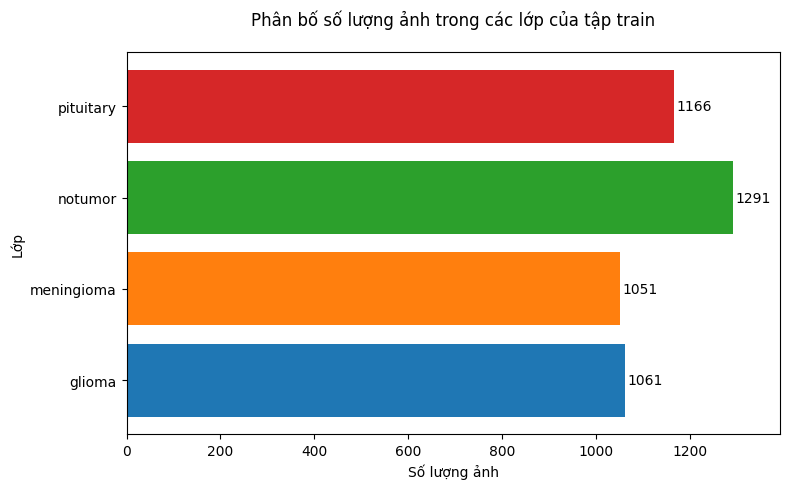

In [5]:
import matplotlib.pyplot as plt
import numpy as np
from collections import Counter

# Lấy chỉ số của các mẫu trong tập train
train_indices = train_dataset.indices
train_labels = [full_dataset.targets[idx] for idx in train_indices]

# Đếm số lượng ảnh trong mỗi lớp
class_counts = Counter(train_labels)
class_names = full_dataset.classes
counts = [class_counts[i] for i in range(len(class_names))]

# In số lượng ảnh trong mỗi lớp
print("Số lượng ảnh trong mỗi lớp của tập train:")
for class_name, count in zip(class_names, counts):
    print(f"{class_name}: {count}")

# Tạo danh sách 4 màu khác nhau cho 4 lớp
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']  # Xanh dương, cam, xanh lá, đỏ

# Vẽ biểu đồ cột nằm
plt.figure(figsize=(8, 5))
bars = plt.barh(class_names, counts, color=colors)
plt.xlabel('Số lượng ảnh')
plt.ylabel('Lớp')
plt.title('Phân bố số lượng ảnh trong các lớp của tập train', loc='center', pad=20)

# Thêm số lượng cụ thể ở cuối mỗi cột
max_count = max(counts)
for bar, count in zip(bars, counts):
    width = bar.get_width()
    plt.text(width + 5, bar.get_y() + bar.get_height()/2, f'{count}', 
             ha='left', va='center', fontsize=10)

# Điều chỉnh giới hạn trục x để tạo thêm không gian cho số
plt.xlim(0, max_count + 100)  # Thêm khoảng trống 100 đơn vị bên phải

plt.tight_layout()

# Lưu biểu đồ
plt.savefig('train_class_distribution_horizontal.png')

In [7]:
from collections import Counter
import random
import torch
from torch.utils.data import Subset

# Hàm để tạo tập dữ liệu cân bằng
def oversample_dataset(dataset, indices):
    # Lấy nhãn của các mẫu trong tập train
    labels = [dataset.dataset.targets[idx] for idx in indices]
    class_counts = Counter(labels)
    class_names = dataset.dataset.classes
    print("Phân bố lớp trước oversampling:")
    for class_idx, count in class_counts.items():
        print(f"{class_names[class_idx]}: {count}")

    # Tìm số lượng mẫu lớn nhất trong một lớp
    max_count = max(class_counts.values())
    print(f"Số lượng mẫu mục tiêu cho mỗi lớp: {max_count}")

    # Tạo danh sách chỉ số mới (bao gồm cả mẫu được sao chép)
    new_indices = []
    for class_idx in range(len(class_names)):
        # Lấy tất cả chỉ số của lớp hiện tại
        class_indices = [idx for idx in indices if dataset.dataset.targets[idx] == class_idx]
        # Số mẫu cần thêm
        samples_to_add = max_count - len(class_indices)
        # Thêm các chỉ số hiện có
        new_indices.extend(class_indices)
        # Sao chép ngẫu nhiên các mẫu từ lớp hiện tại để đạt max_count
        if samples_to_add > 0:
            new_indices.extend(random.choices(class_indices, k=samples_to_add))

    print(f"Tổng số mẫu sau oversampling: {len(new_indices)}")
    return new_indices

# Áp dụng oversampling lên tập train
new_train_indices = oversample_dataset(train_dataset, train_dataset.indices)

# Cập nhật tập train với chỉ số mới
train_dataset = Subset(full_dataset, new_train_indices)

# Tạo lại train_loader (không cần sampler nữa vì dữ liệu đã cân bằng)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# Kiểm tra phân bố lớp sau oversampling
def check_dataset_distribution(dataset, indices):
    labels = [dataset.dataset.targets[idx] for idx in indices]
    class_counts = Counter(labels)
    print("Phân bố lớp sau oversampling trong tập train:")
    for class_idx, count in class_counts.items():
        print(f"{full_dataset.classes[class_idx]}: {count}")

check_dataset_distribution(train_dataset, new_train_indices)

Phân bố lớp trước oversampling:
meningioma: 1078
notumor: 1263
pituitary: 1182
glioma: 1046
Số lượng mẫu mục tiêu cho mỗi lớp: 1263
Tổng số mẫu sau oversampling: 5052
Phân bố lớp sau oversampling trong tập train:
glioma: 1263
meningioma: 1263
notumor: 1263
pituitary: 1263


Số lượng ảnh trong mỗi lớp của tập train (sau oversampling):
glioma: 1263
meningioma: 1263
notumor: 1263
pituitary: 1263


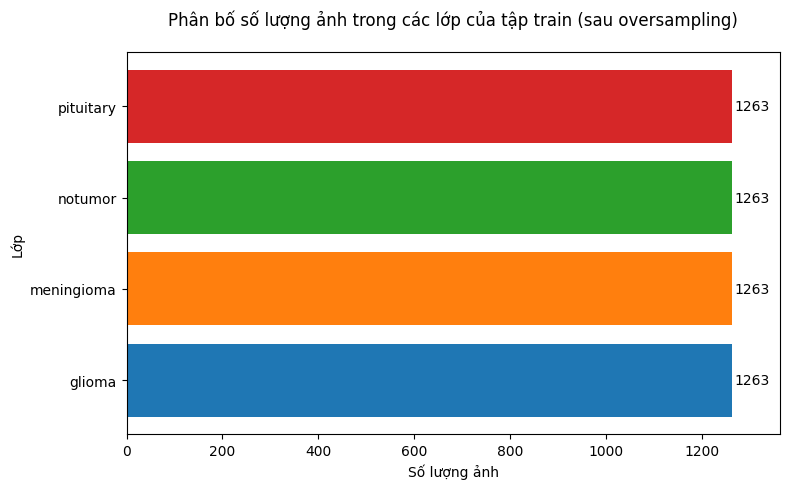

In [8]:
import matplotlib.pyplot as plt
import numpy as np
from collections import Counter

# Lấy chỉ số và nhãn của tập train sau oversampling
train_indices = new_train_indices  # Từ code oversampling trước đó
train_labels = [full_dataset.targets[idx] for idx in train_indices]

# Đếm số lượng ảnh trong mỗi lớp
class_counts = Counter(train_labels)
class_names = full_dataset.classes
counts = [class_counts[i] for i in range(len(class_names))]

# In số lượng ảnh trong mỗi lớp
print("Số lượng ảnh trong mỗi lớp của tập train (sau oversampling):")
for class_name, count in zip(class_names, counts):
    print(f"{class_name}: {count}")

# Tạo danh sách 4 màu khác nhau cho 4 lớp
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']  # Xanh dương, cam, xanh lá, đỏ

# Vẽ biểu đồ cột nằm
plt.figure(figsize=(8, 5))
bars = plt.barh(class_names, counts, color=colors)
plt.xlabel('Số lượng ảnh')
plt.ylabel('Lớp')
plt.title('Phân bố số lượng ảnh trong các lớp của tập train (sau oversampling)', loc='center', pad=20)

# Thêm số lượng cụ thể ở cuối mỗi cột
max_count = max(counts)
for bar, count in zip(bars, counts):
    width = bar.get_width()
    plt.text(width + 5, bar.get_y() + bar.get_height()/2, f'{count}', 
             ha='left', va='center', fontsize=10)

# Điều chỉnh giới hạn trục x để tạo thêm không gian cho số
plt.xlim(0, max_count + 100)  # Thêm khoảng trống 100 đơn vị bên phải

plt.tight_layout()

# Lưu biểu đồ
plt.savefig('train_class_distribution_horizontal_oversampled.png')
plt.show()

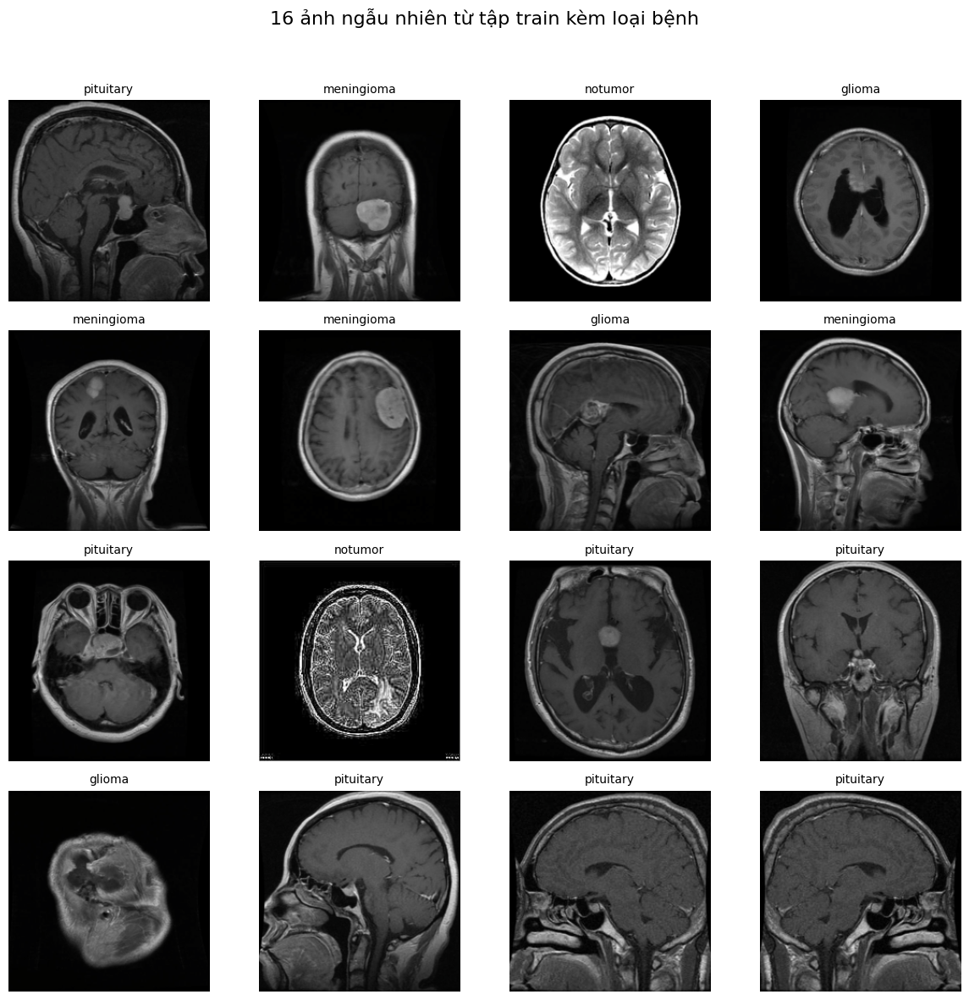

In [12]:
import matplotlib.pyplot as plt
import numpy as np
import random

# Lấy danh sách lớp từ full_dataset
class_names = full_dataset.classes

# Lấy 16 mẫu ngẫu nhiên từ train_dataset
random_indices = random.sample(range(len(train_dataset)), 16)
random_samples = [train_dataset[i] for i in random_indices]

# Tạo lưới 4x4 để hiển thị ảnh
fig, axes = plt.subplots(4, 4, figsize=(12, 12))
axes = axes.flatten()

# Hiển thị từng ảnh và tên loại bệnh
for i, (image, label) in enumerate(random_samples):
    # Chuyển tensor ảnh về định dạng numpy và chuẩn hóa để hiển thị
    image = image.permute(1, 2, 0).numpy()  # Chuyển từ (C, H, W) sang (H, W, C)
    image = image * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])  # Đảo ngược chuẩn hóa
    image = np.clip(image, 0, 1)  # Đảm bảo giá trị trong khoảng [0, 1]

    # Hiển thị ảnh
    axes[i].imshow(image)
    axes[i].set_title(class_names[label], fontsize=10)
    axes[i].axis('off')  # Tắt trục

plt.suptitle('16 ảnh ngẫu nhiên từ tập train kèm loại bệnh', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])  # Điều chỉnh layout để có chỗ cho tiêu đề
plt.savefig('random_train_images.png')

In [7]:
# Freeze most layers and unfreeze the last stage for fine-tuning
for param in model.swin.parameters():
    param.requires_grad = False

# Unfreeze the last stage (stage 3) of Swin Transformer
for param in model.swin.encoder.layers[3].parameters():
    param.requires_grad = True

# Unfreeze classifier
for param in model.classifier.parameters():
    param.requires_grad = True

# Move model to device
model.to(device)

# Loss function with reduced label smoothing
criterion = nn.CrossEntropyLoss(label_smoothing=0.05)

# Adjusted learning rates
optimizer = optim.AdamW([
    {'params': model.swin.encoder.layers[3].parameters(), 'lr': 8e-6},
    {'params': model.classifier.parameters(), 'lr': 2e-5}
], weight_decay=0.05)

# Optimized learning rate scheduler
scheduler = OneCycleLR(
    optimizer,
    max_lr=[8e-6, 2e-5],
    steps_per_epoch=len(train_loader),
    epochs=350,
    pct_start=0.2,
    div_factor=25,
    final_div_factor=3000,
    anneal_strategy='cos'
)

# Add ReduceLROnPlateau scheduler for dynamic LR adjustment
scheduler_plateau = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=7, verbose=True)

# Training parameters
num_epochs = 200
best_val_acc = 0
patience = 35
patience_counter = 0
best_val_loss = float('inf')
train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
start_total_time = time.time()

# Gradient accumulation steps
accumulation_steps = 4

# Training loop
for epoch in range(num_epochs):
    start_time = time.time()

    # Training phase
    model.train()
    train_loss, train_correct, train_total = 0, 0, 0
    progress_bar = tqdm(enumerate(train_loader), total=len(train_loader),
                       desc=f"Epoch {epoch+1}/{num_epochs}")

    optimizer.zero_grad()

    for batch_idx, (images, labels) in progress_bar:
        images, labels = images.to(device), labels.to(device)

        # Forward pass
        outputs = model(images)
        logits = outputs.logits
        loss = criterion(logits, labels)

        # Normalize loss for gradient accumulation
        loss = loss / accumulation_steps
        loss.backward()

        # Update weights every accumulation_steps batches
        if (batch_idx + 1) % accumulation_steps == 0 or (batch_idx + 1) == len(train_loader):
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=0.5)
            optimizer.step()
            scheduler.step()
            optimizer.zero_grad()

        # Trackылы metrics
        train_loss += loss.item() * accumulation_steps
        _, predicted = torch.max(logits, 1)
        train_correct += (predicted == labels).sum().item()
        train_total += labels.size(0)

        progress_bar.set_postfix(
            loss=loss.item() * accumulation_steps,
            acc=f"{100 * train_correct / train_total:.2f}%"
        )

    avg_train_loss = train_loss / len(train_loader)

    # Validation phase
    model.eval()
    val_loss, val_correct, val_total = 0, 0, 0

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            logits = outputs.logits
            loss = criterion(logits, labels)

            val_loss += loss.item()
            _, predicted = torch.max(logits, 1)
            val_correct += (predicted == labels).sum().item()
            val_total += labels.size(0)

    # Calculate average metrics
    train_loss = avg_train_loss
    train_acc = 100 * train_correct / train_total
    val_loss /= len(val_loader)
    val_acc = 100 * val_correct / val_total

    # Update ReduceLROnPlateau scheduler
    scheduler_plateau.step(val_loss)

    # Save metrics
    train_losses.append(train_loss)
    train_accuracies.append(train_acc)
    val_losses.append(val_loss)
    val_accuracies.append(val_acc)

    elapsed_time = format_time(time.time() - start_time)
    print(f"Epoch [{epoch+1}/{num_epochs}] ━ "
          f"Train Loss: {train_loss:.4f} ━ "
          f"Train Acc: {train_acc:.2f}% ━ "
          f"Val Loss: {val_loss:.4f} ━ "
          f"Val Acc: {val_acc:.2f}% ━ "
          f"Time: {elapsed_time}")

    # Check if we've reached target loss
    if val_loss <= 0.1:
        print(f"🎯 Target loss of 0.1 reached at epoch {epoch+1}!")
        model_path = os.path.join(save_dir, "swin_model_target_reached.pth")
        torch.save(model.state_dict(), model_path)
        print(f"💾 Model saved at {model_path} with val_loss {val_loss:.4f}")

    # Save best model based on validation accuracy
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        model_path = os.path.join(save_dir, "swin_model_best_acc.pth")
        torch.save(model.state_dict(), model_path)
        print(f"✅ Model saved at {model_path} with val_acc {val_acc:.2f}%")

    # Save best model based on validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience_counter = 0
        model_path = os.path.join(save_dir, "swin_model_best_loss.pth")
        torch.save(model.state_dict(), model_path)
        print(f"📉 Model saved at {model_path} with val_loss {val_loss:.4f}")
    else:
        patience_counter += 1

    # Early stopping check
    if patience_counter >= patience:
        print(f"⚠️ Early stopping triggered after {patience} epochs without improvement")
        break

    # Save checkpoint every 10 epochs
    if (epoch + 1) % 10 == 0:
        checkpoint_path = os.path.join(save_dir, f"swin_model_epoch_{epoch+1}.pth")
        torch.save({
            'epoch': epoch + 1,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'scheduler_state_dict': scheduler.state_dict(),
            'train_loss': train_loss,
            'val_loss': val_loss,
            'train_acc': train_acc,
            'val_acc': val_acc
        }, checkpoint_path)
        print(f"📌 Checkpoint saved at {checkpoint_path}")

# Save final model
final_model_path = os.path.join(save_dir, "swin_model_final.pth")
torch.save(model.state_dict(), final_model_path)
print(f"🏁 Final model saved at {final_model_path}")

# Save training time
total_train_time = time.time() - start_total_time
train_time_path = os.path.join(save_dir, "swin_train_time.txt")
with open(train_time_path, "w") as f:
    f.write(f"Total Training Time: {format_time(total_train_time)}\n")
    f.write(f"Best validation accuracy: {best_val_acc:.2f}%\n")
    f.write(f"Best validation loss: {best_val_loss:.4f}\n")
    f.write(f"Final validation accuracy: {val_acc:.2f}%\n")
    f.write(f"Final validation loss: {val_loss:.4f}\n")
print(f"🕒 Total training time: {format_time(total_train_time)}")

# Save training log
csv_path = os.path.join(save_dir, "swin_training_log.csv")
with open(csv_path, "w", newline="") as csvfile:
    csvwriter = csv.writer(csvfile)
    csvwriter.writerow(["Epoch", "Train Loss", "Train Accuracy", "Val Loss", "Val Accuracy"])
    for epoch_idx in range(len(train_losses)):
        csvwriter.writerow([
            epoch_idx + 1,
            train_losses[epoch_idx],
            train_accuracies[epoch_idx],
            val_losses[epoch_idx],
            val_accuracies[epoch_idx]
        ])
print(f"📊 Training log saved to {csv_path}")

# Function for evaluating the model on test set
def evaluate_model(model, test_loader, device):
    model.eval()
    test_correct, test_total = 0, 0
    predictions = []
    true_labels = []

    with torch.no_grad():
        for images, labels in tqdm(test_loader, desc="Testing"):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            logits = outputs.logits
            _, predicted = torch.max(logits, 1)
            test_correct += (predicted == labels).sum().item()
            test_total += labels.size(0)
            predictions.extend(predicted.cpu().numpy())
            true_labels.extend(labels.cpu().numpy())

    accuracy = 100 * test_correct / test_total
    print(f"Test Accuracy: {accuracy:.2f}%")

   


Epoch 1/200: 100%|██████████| 286/286 [01:04<00:00,  4.46it/s, acc=24.27%, loss=1.25]


Epoch [1/200] ━ Train Loss: 1.5011 ━ Train Acc: 24.27% ━ Val Loss: 1.4758 ━ Val Acc: 24.41% ━ Time: 0h 1m 18s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 24.41%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 1.4758


Epoch 2/200: 100%|██████████| 286/286 [00:43<00:00,  6.65it/s, acc=25.56%, loss=1.34]


Epoch [2/200] ━ Train Loss: 1.4615 ━ Train Acc: 25.56% ━ Val Loss: 1.4302 ━ Val Acc: 26.25% ━ Time: 0h 0m 52s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 26.25%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 1.4302


Epoch 3/200: 100%|██████████| 286/286 [00:44<00:00,  6.37it/s, acc=27.91%, loss=1.3] 


Epoch [3/200] ━ Train Loss: 1.4187 ━ Train Acc: 27.91% ━ Val Loss: 1.3889 ━ Val Acc: 27.56% ━ Time: 0h 0m 54s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 27.56%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 1.3889


Epoch 4/200: 100%|██████████| 286/286 [00:44<00:00,  6.38it/s, acc=30.14%, loss=1.4] 


Epoch [4/200] ━ Train Loss: 1.3838 ━ Train Acc: 30.14% ━ Val Loss: 1.3501 ━ Val Acc: 31.50% ━ Time: 0h 0m 54s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 31.50%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 1.3501


Epoch 5/200: 100%|██████████| 286/286 [00:44<00:00,  6.43it/s, acc=32.33%, loss=1.35]


Epoch [5/200] ━ Train Loss: 1.3530 ━ Train Acc: 32.33% ━ Val Loss: 1.3129 ━ Val Acc: 35.52% ━ Time: 0h 0m 54s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 35.52%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 1.3129


Epoch 6/200: 100%|██████████| 286/286 [00:44<00:00,  6.45it/s, acc=36.13%, loss=1.35]


Epoch [6/200] ━ Train Loss: 1.3202 ━ Train Acc: 36.13% ━ Val Loss: 1.2762 ━ Val Acc: 40.16% ━ Time: 0h 0m 53s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 40.16%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 1.2762


Epoch 7/200: 100%|██████████| 286/286 [00:44<00:00,  6.37it/s, acc=40.23%, loss=1.33]


Epoch [7/200] ━ Train Loss: 1.2835 ━ Train Acc: 40.23% ━ Val Loss: 1.2396 ━ Val Acc: 47.59% ━ Time: 0h 0m 54s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 47.59%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 1.2396


Epoch 8/200: 100%|██████████| 286/286 [00:45<00:00,  6.35it/s, acc=44.39%, loss=1.28]


Epoch [8/200] ━ Train Loss: 1.2540 ━ Train Acc: 44.39% ━ Val Loss: 1.2021 ━ Val Acc: 55.38% ━ Time: 0h 0m 54s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 55.38%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 1.2021


Epoch 9/200: 100%|██████████| 286/286 [00:44<00:00,  6.38it/s, acc=50.25%, loss=1.25]


Epoch [9/200] ━ Train Loss: 1.2130 ━ Train Acc: 50.25% ━ Val Loss: 1.1643 ━ Val Acc: 61.94% ━ Time: 0h 0m 54s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 61.94%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 1.1643


Epoch 10/200: 100%|██████████| 286/286 [00:44<00:00,  6.37it/s, acc=53.53%, loss=1.15] 


Epoch [10/200] ━ Train Loss: 1.1860 ━ Train Acc: 53.53% ━ Val Loss: 1.1265 ━ Val Acc: 66.58% ━ Time: 0h 0m 54s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 66.58%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 1.1265
📌 Checkpoint saved at ./swin_results/swin_model_epoch_10.pth


Epoch 11/200: 100%|██████████| 286/286 [00:44<00:00,  6.40it/s, acc=56.36%, loss=1.12] 


Epoch [11/200] ━ Train Loss: 1.1466 ━ Train Acc: 56.36% ━ Val Loss: 1.0885 ━ Val Acc: 70.17% ━ Time: 0h 0m 54s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 70.17%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 1.0885


Epoch 12/200: 100%|██████████| 286/286 [00:45<00:00,  6.35it/s, acc=60.82%, loss=1.2]  


Epoch [12/200] ━ Train Loss: 1.1134 ━ Train Acc: 60.82% ━ Val Loss: 1.0500 ━ Val Acc: 71.57% ━ Time: 0h 0m 54s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 71.57%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 1.0500


Epoch 13/200: 100%|██████████| 286/286 [00:44<00:00,  6.38it/s, acc=63.69%, loss=1.4]  


Epoch [13/200] ━ Train Loss: 1.0785 ━ Train Acc: 63.69% ━ Val Loss: 1.0109 ━ Val Acc: 73.84% ━ Time: 0h 0m 54s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 73.84%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 1.0109


Epoch 14/200: 100%|██████████| 286/286 [00:44<00:00,  6.41it/s, acc=64.46%, loss=0.955]


Epoch [14/200] ━ Train Loss: 1.0453 ━ Train Acc: 64.46% ━ Val Loss: 0.9723 ━ Val Acc: 74.89% ━ Time: 0h 0m 53s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 74.89%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.9723


Epoch 15/200: 100%|██████████| 286/286 [00:44<00:00,  6.42it/s, acc=67.48%, loss=1.24] 


Epoch [15/200] ━ Train Loss: 1.0062 ━ Train Acc: 67.48% ━ Val Loss: 0.9338 ━ Val Acc: 76.12% ━ Time: 0h 0m 53s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 76.12%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.9338


Epoch 16/200: 100%|██████████| 286/286 [00:44<00:00,  6.45it/s, acc=68.59%, loss=1.17] 


Epoch [16/200] ━ Train Loss: 0.9753 ━ Train Acc: 68.59% ━ Val Loss: 0.8964 ━ Val Acc: 77.34% ━ Time: 0h 0m 53s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 77.34%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.8964


Epoch 17/200: 100%|██████████| 286/286 [00:44<00:00,  6.43it/s, acc=70.50%, loss=1.06] 


Epoch [17/200] ━ Train Loss: 0.9407 ━ Train Acc: 70.50% ━ Val Loss: 0.8601 ━ Val Acc: 78.74% ━ Time: 0h 0m 53s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 78.74%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.8601


Epoch 18/200: 100%|██████████| 286/286 [00:44<00:00,  6.44it/s, acc=72.73%, loss=1.03] 


Epoch [18/200] ━ Train Loss: 0.9089 ━ Train Acc: 72.73% ━ Val Loss: 0.8253 ━ Val Acc: 80.05% ━ Time: 0h 0m 53s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 80.05%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.8253


Epoch 19/200: 100%|██████████| 286/286 [00:45<00:00,  6.32it/s, acc=74.31%, loss=0.762]


Epoch [19/200] ━ Train Loss: 0.8741 ━ Train Acc: 74.31% ━ Val Loss: 0.7924 ━ Val Acc: 81.63% ━ Time: 0h 0m 55s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 81.63%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.7924


Epoch 20/200: 100%|██████████| 286/286 [00:44<00:00,  6.40it/s, acc=75.77%, loss=0.838]


Epoch [20/200] ━ Train Loss: 0.8335 ━ Train Acc: 75.77% ━ Val Loss: 0.7610 ━ Val Acc: 82.33% ━ Time: 0h 0m 54s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 82.33%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.7610
📌 Checkpoint saved at ./swin_results/swin_model_epoch_20.pth


Epoch 21/200: 100%|██████████| 286/286 [00:44<00:00,  6.41it/s, acc=76.14%, loss=0.722]


Epoch [21/200] ━ Train Loss: 0.8134 ━ Train Acc: 76.14% ━ Val Loss: 0.7316 ━ Val Acc: 83.11% ━ Time: 0h 0m 53s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 83.11%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.7316


Epoch 22/200: 100%|██████████| 286/286 [00:45<00:00,  6.35it/s, acc=77.89%, loss=0.718]


Epoch [22/200] ━ Train Loss: 0.7780 ━ Train Acc: 77.89% ━ Val Loss: 0.7039 ━ Val Acc: 83.29% ━ Time: 0h 0m 54s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 83.29%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.7039


Epoch 23/200: 100%|██████████| 286/286 [00:44<00:00,  6.45it/s, acc=78.51%, loss=0.551]


Epoch [23/200] ━ Train Loss: 0.7561 ━ Train Acc: 78.51% ━ Val Loss: 0.6778 ━ Val Acc: 83.90% ━ Time: 0h 0m 53s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 83.90%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.6778


Epoch 24/200: 100%|██████████| 286/286 [00:44<00:00,  6.39it/s, acc=80.17%, loss=0.583]


Epoch [24/200] ━ Train Loss: 0.7279 ━ Train Acc: 80.17% ━ Val Loss: 0.6537 ━ Val Acc: 84.16% ━ Time: 0h 0m 54s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 84.16%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.6537


Epoch 25/200: 100%|██████████| 286/286 [00:44<00:00,  6.39it/s, acc=80.52%, loss=0.92] 


Epoch [25/200] ━ Train Loss: 0.7034 ━ Train Acc: 80.52% ━ Val Loss: 0.6311 ━ Val Acc: 84.69% ━ Time: 0h 0m 53s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 84.69%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.6311


Epoch 26/200: 100%|██████████| 286/286 [00:44<00:00,  6.41it/s, acc=81.02%, loss=0.46] 


Epoch [26/200] ━ Train Loss: 0.6815 ━ Train Acc: 81.02% ━ Val Loss: 0.6106 ━ Val Acc: 85.48% ━ Time: 0h 0m 54s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 85.48%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.6106


Epoch 27/200: 100%|██████████| 286/286 [00:44<00:00,  6.46it/s, acc=82.14%, loss=0.841]


Epoch [27/200] ━ Train Loss: 0.6638 ━ Train Acc: 82.14% ━ Val Loss: 0.5915 ━ Val Acc: 85.83% ━ Time: 0h 0m 53s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 85.83%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.5915


Epoch 28/200: 100%|██████████| 286/286 [00:44<00:00,  6.50it/s, acc=82.43%, loss=0.518]


Epoch [28/200] ━ Train Loss: 0.6451 ━ Train Acc: 82.43% ━ Val Loss: 0.5740 ━ Val Acc: 86.26% ━ Time: 0h 0m 53s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 86.26%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.5740


Epoch 29/200: 100%|██████████| 286/286 [00:44<00:00,  6.47it/s, acc=82.93%, loss=0.5]  


Epoch [29/200] ━ Train Loss: 0.6321 ━ Train Acc: 82.93% ━ Val Loss: 0.5581 ━ Val Acc: 86.70% ━ Time: 0h 0m 53s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 86.70%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.5581


Epoch 30/200: 100%|██████████| 286/286 [00:44<00:00,  6.47it/s, acc=84.18%, loss=0.414]


Epoch [30/200] ━ Train Loss: 0.6126 ━ Train Acc: 84.18% ━ Val Loss: 0.5431 ━ Val Acc: 87.49% ━ Time: 0h 0m 53s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 87.49%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.5431
📌 Checkpoint saved at ./swin_results/swin_model_epoch_30.pth


Epoch 31/200: 100%|██████████| 286/286 [00:44<00:00,  6.46it/s, acc=84.42%, loss=0.873]


Epoch [31/200] ━ Train Loss: 0.5969 ━ Train Acc: 84.42% ━ Val Loss: 0.5292 ━ Val Acc: 88.10% ━ Time: 0h 0m 53s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 88.10%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.5292


Epoch 32/200: 100%|██████████| 286/286 [00:44<00:00,  6.46it/s, acc=84.57%, loss=0.594]


Epoch [32/200] ━ Train Loss: 0.5847 ━ Train Acc: 84.57% ━ Val Loss: 0.5170 ━ Val Acc: 88.45% ━ Time: 0h 0m 53s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 88.45%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.5170


Epoch 33/200: 100%|██████████| 286/286 [00:44<00:00,  6.42it/s, acc=85.10%, loss=0.609]


Epoch [33/200] ━ Train Loss: 0.5703 ━ Train Acc: 85.10% ━ Val Loss: 0.5053 ━ Val Acc: 88.54% ━ Time: 0h 0m 53s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 88.54%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.5053


Epoch 34/200: 100%|██████████| 286/286 [00:44<00:00,  6.47it/s, acc=85.82%, loss=0.746]


Epoch [34/200] ━ Train Loss: 0.5593 ━ Train Acc: 85.82% ━ Val Loss: 0.4947 ━ Val Acc: 88.89% ━ Time: 0h 0m 53s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 88.89%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.4947


Epoch 35/200: 100%|██████████| 286/286 [00:44<00:00,  6.40it/s, acc=86.28%, loss=0.531]


Epoch [35/200] ━ Train Loss: 0.5496 ━ Train Acc: 86.28% ━ Val Loss: 0.4849 ━ Val Acc: 88.80% ━ Time: 0h 0m 53s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.4849


Epoch 36/200: 100%|██████████| 286/286 [00:45<00:00,  6.31it/s, acc=86.67%, loss=0.686]


Epoch [36/200] ━ Train Loss: 0.5354 ━ Train Acc: 86.67% ━ Val Loss: 0.4757 ━ Val Acc: 89.41% ━ Time: 0h 0m 54s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 89.41%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.4757


Epoch 37/200: 100%|██████████| 286/286 [00:44<00:00,  6.38it/s, acc=87.13%, loss=0.475]


Epoch [37/200] ━ Train Loss: 0.5262 ━ Train Acc: 87.13% ━ Val Loss: 0.4671 ━ Val Acc: 89.68% ━ Time: 0h 0m 54s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 89.68%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.4671


Epoch 38/200: 100%|██████████| 286/286 [00:44<00:00,  6.48it/s, acc=87.13%, loss=0.74] 


Epoch [38/200] ━ Train Loss: 0.5188 ━ Train Acc: 87.13% ━ Val Loss: 0.4594 ━ Val Acc: 90.20% ━ Time: 0h 0m 53s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 90.20%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.4594


Epoch 39/200: 100%|██████████| 286/286 [00:44<00:00,  6.47it/s, acc=87.48%, loss=0.483]


Epoch [39/200] ━ Train Loss: 0.5151 ━ Train Acc: 87.48% ━ Val Loss: 0.4523 ━ Val Acc: 90.55% ━ Time: 0h 0m 53s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 90.55%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.4523


Epoch 40/200: 100%|██████████| 286/286 [00:44<00:00,  6.40it/s, acc=88.03%, loss=0.483]


Epoch [40/200] ━ Train Loss: 0.5046 ━ Train Acc: 88.03% ━ Val Loss: 0.4462 ━ Val Acc: 90.73% ━ Time: 0h 0m 54s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 90.73%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.4462
📌 Checkpoint saved at ./swin_results/swin_model_epoch_40.pth


Epoch 41/200: 100%|██████████| 286/286 [00:44<00:00,  6.45it/s, acc=88.68%, loss=0.403]


Epoch [41/200] ━ Train Loss: 0.4952 ━ Train Acc: 88.68% ━ Val Loss: 0.4400 ━ Val Acc: 90.99% ━ Time: 0h 0m 53s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 90.99%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.4400


Epoch 42/200: 100%|██████████| 286/286 [00:44<00:00,  6.49it/s, acc=88.93%, loss=0.493]


Epoch [42/200] ━ Train Loss: 0.4895 ━ Train Acc: 88.93% ━ Val Loss: 0.4340 ━ Val Acc: 91.43% ━ Time: 0h 0m 53s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 91.43%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.4340


Epoch 43/200: 100%|██████████| 286/286 [00:45<00:00,  6.29it/s, acc=89.01%, loss=0.472]


Epoch [43/200] ━ Train Loss: 0.4797 ━ Train Acc: 89.01% ━ Val Loss: 0.4287 ━ Val Acc: 91.25% ━ Time: 0h 0m 54s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.4287


Epoch 44/200: 100%|██████████| 286/286 [00:44<00:00,  6.38it/s, acc=89.23%, loss=0.442]


Epoch [44/200] ━ Train Loss: 0.4789 ━ Train Acc: 89.23% ━ Val Loss: 0.4232 ━ Val Acc: 91.78% ━ Time: 0h 0m 54s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 91.78%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.4232


Epoch 45/200: 100%|██████████| 286/286 [00:44<00:00,  6.46it/s, acc=89.78%, loss=0.331]


Epoch [45/200] ━ Train Loss: 0.4694 ━ Train Acc: 89.78% ━ Val Loss: 0.4182 ━ Val Acc: 92.21% ━ Time: 0h 0m 53s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 92.21%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.4182


Epoch 46/200: 100%|██████████| 286/286 [00:44<00:00,  6.45it/s, acc=89.89%, loss=0.583]


Epoch [46/200] ━ Train Loss: 0.4669 ━ Train Acc: 89.89% ━ Val Loss: 0.4140 ━ Val Acc: 92.04% ━ Time: 0h 0m 53s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.4140


Epoch 47/200: 100%|██████████| 286/286 [00:44<00:00,  6.38it/s, acc=90.22%, loss=0.398]


Epoch [47/200] ━ Train Loss: 0.4547 ━ Train Acc: 90.22% ━ Val Loss: 0.4092 ━ Val Acc: 92.48% ━ Time: 0h 0m 54s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 92.48%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.4092


Epoch 48/200: 100%|██████████| 286/286 [00:44<00:00,  6.45it/s, acc=90.30%, loss=0.873]


Epoch [48/200] ━ Train Loss: 0.4542 ━ Train Acc: 90.30% ━ Val Loss: 0.4048 ━ Val Acc: 92.91% ━ Time: 0h 0m 53s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 92.91%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.4048


Epoch 49/200: 100%|██████████| 286/286 [00:44<00:00,  6.46it/s, acc=90.46%, loss=0.474]


Epoch [49/200] ━ Train Loss: 0.4475 ━ Train Acc: 90.46% ━ Val Loss: 0.4011 ━ Val Acc: 92.91% ━ Time: 0h 0m 53s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.4011


Epoch 50/200: 100%|██████████| 286/286 [00:44<00:00,  6.43it/s, acc=90.65%, loss=0.569]


Epoch [50/200] ━ Train Loss: 0.4463 ━ Train Acc: 90.65% ━ Val Loss: 0.3970 ━ Val Acc: 92.83% ━ Time: 0h 0m 53s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.3970
📌 Checkpoint saved at ./swin_results/swin_model_epoch_50.pth


Epoch 51/200: 100%|██████████| 286/286 [00:44<00:00,  6.48it/s, acc=91.09%, loss=0.531]


Epoch [51/200] ━ Train Loss: 0.4377 ━ Train Acc: 91.09% ━ Val Loss: 0.3929 ━ Val Acc: 93.26% ━ Time: 0h 0m 53s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 93.26%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.3929


Epoch 52/200: 100%|██████████| 286/286 [00:44<00:00,  6.46it/s, acc=91.29%, loss=0.404]


Epoch [52/200] ━ Train Loss: 0.4329 ━ Train Acc: 91.29% ━ Val Loss: 0.3889 ━ Val Acc: 93.09% ━ Time: 0h 0m 53s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.3889


Epoch 53/200: 100%|██████████| 286/286 [00:44<00:00,  6.37it/s, acc=91.44%, loss=0.314]


Epoch [53/200] ━ Train Loss: 0.4265 ━ Train Acc: 91.44% ━ Val Loss: 0.3850 ━ Val Acc: 93.26% ━ Time: 0h 0m 54s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.3850


Epoch 54/200: 100%|██████████| 286/286 [00:44<00:00,  6.44it/s, acc=91.66%, loss=0.289]


Epoch [54/200] ━ Train Loss: 0.4206 ━ Train Acc: 91.66% ━ Val Loss: 0.3816 ━ Val Acc: 93.35% ━ Time: 0h 0m 53s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 93.35%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.3816


Epoch 55/200: 100%|██████████| 286/286 [00:44<00:00,  6.39it/s, acc=92.08%, loss=0.44] 


Epoch [55/200] ━ Train Loss: 0.4143 ━ Train Acc: 92.08% ━ Val Loss: 0.3783 ━ Val Acc: 93.26% ━ Time: 0h 0m 54s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.3783


Epoch 56/200: 100%|██████████| 286/286 [00:44<00:00,  6.41it/s, acc=92.06%, loss=0.334]


Epoch [56/200] ━ Train Loss: 0.4132 ━ Train Acc: 92.06% ━ Val Loss: 0.3745 ━ Val Acc: 93.35% ━ Time: 0h 0m 53s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.3745


Epoch 57/200: 100%|██████████| 286/286 [00:45<00:00,  6.23it/s, acc=92.41%, loss=0.358]


Epoch [57/200] ━ Train Loss: 0.4067 ━ Train Acc: 92.41% ━ Val Loss: 0.3714 ━ Val Acc: 93.44% ━ Time: 0h 0m 55s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 93.44%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.3714


Epoch 58/200: 100%|██████████| 286/286 [00:46<00:00,  6.21it/s, acc=92.62%, loss=0.376]


Epoch [58/200] ━ Train Loss: 0.4018 ━ Train Acc: 92.62% ━ Val Loss: 0.3681 ━ Val Acc: 93.44% ━ Time: 0h 0m 55s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.3681


Epoch 59/200: 100%|██████████| 286/286 [00:46<00:00,  6.19it/s, acc=92.32%, loss=0.419]


Epoch [59/200] ━ Train Loss: 0.4018 ━ Train Acc: 92.32% ━ Val Loss: 0.3651 ━ Val Acc: 93.53% ━ Time: 0h 0m 56s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 93.53%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.3651


Epoch 60/200: 100%|██████████| 286/286 [00:46<00:00,  6.16it/s, acc=92.84%, loss=0.637]


Epoch [60/200] ━ Train Loss: 0.3954 ━ Train Acc: 92.84% ━ Val Loss: 0.3617 ━ Val Acc: 93.61% ━ Time: 0h 0m 56s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 93.61%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.3617
📌 Checkpoint saved at ./swin_results/swin_model_epoch_60.pth


Epoch 61/200: 100%|██████████| 286/286 [00:45<00:00,  6.22it/s, acc=93.35%, loss=0.448]


Epoch [61/200] ━ Train Loss: 0.3906 ━ Train Acc: 93.35% ━ Val Loss: 0.3585 ━ Val Acc: 93.88% ━ Time: 0h 0m 55s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 93.88%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.3585


Epoch 62/200: 100%|██████████| 286/286 [00:45<00:00,  6.35it/s, acc=93.26%, loss=0.507]


Epoch [62/200] ━ Train Loss: 0.3859 ━ Train Acc: 93.26% ━ Val Loss: 0.3555 ━ Val Acc: 93.88% ━ Time: 0h 0m 54s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.3555


Epoch 63/200: 100%|██████████| 286/286 [00:45<00:00,  6.35it/s, acc=93.24%, loss=0.31] 


Epoch [63/200] ━ Train Loss: 0.3825 ━ Train Acc: 93.24% ━ Val Loss: 0.3528 ━ Val Acc: 94.14% ━ Time: 0h 0m 54s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 94.14%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.3528


Epoch 64/200: 100%|██████████| 286/286 [00:44<00:00,  6.41it/s, acc=93.52%, loss=0.226]


Epoch [64/200] ━ Train Loss: 0.3743 ━ Train Acc: 93.52% ━ Val Loss: 0.3495 ━ Val Acc: 94.23% ━ Time: 0h 0m 54s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 94.23%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.3495


Epoch 65/200: 100%|██████████| 286/286 [00:44<00:00,  6.45it/s, acc=93.37%, loss=0.322]


Epoch [65/200] ━ Train Loss: 0.3785 ━ Train Acc: 93.37% ━ Val Loss: 0.3472 ━ Val Acc: 94.31% ━ Time: 0h 0m 53s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 94.31%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.3472


Epoch 66/200: 100%|██████████| 286/286 [00:45<00:00,  6.35it/s, acc=93.61%, loss=0.455]


Epoch [66/200] ━ Train Loss: 0.3715 ━ Train Acc: 93.61% ━ Val Loss: 0.3446 ━ Val Acc: 94.49% ━ Time: 0h 0m 54s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 94.49%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.3446


Epoch 67/200: 100%|██████████| 286/286 [00:45<00:00,  6.32it/s, acc=94.09%, loss=0.323]


Epoch [67/200] ━ Train Loss: 0.3681 ━ Train Acc: 94.09% ━ Val Loss: 0.3424 ━ Val Acc: 94.58% ━ Time: 0h 0m 54s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 94.58%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.3424


Epoch 68/200: 100%|██████████| 286/286 [00:44<00:00,  6.40it/s, acc=93.72%, loss=0.316]


Epoch [68/200] ━ Train Loss: 0.3639 ━ Train Acc: 93.72% ━ Val Loss: 0.3400 ━ Val Acc: 94.75% ━ Time: 0h 0m 53s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 94.75%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.3400


Epoch 69/200: 100%|██████████| 286/286 [00:44<00:00,  6.41it/s, acc=94.77%, loss=0.268]


Epoch [69/200] ━ Train Loss: 0.3558 ━ Train Acc: 94.77% ━ Val Loss: 0.3377 ━ Val Acc: 94.75% ━ Time: 0h 0m 53s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.3377


Epoch 70/200: 100%|██████████| 286/286 [00:44<00:00,  6.36it/s, acc=94.79%, loss=0.439]


Epoch [70/200] ━ Train Loss: 0.3563 ━ Train Acc: 94.79% ━ Val Loss: 0.3359 ━ Val Acc: 94.93% ━ Time: 0h 0m 54s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 94.93%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.3359
📌 Checkpoint saved at ./swin_results/swin_model_epoch_70.pth


Epoch 71/200: 100%|██████████| 286/286 [00:44<00:00,  6.42it/s, acc=94.81%, loss=0.3]  


Epoch [71/200] ━ Train Loss: 0.3519 ━ Train Acc: 94.81% ━ Val Loss: 0.3330 ━ Val Acc: 94.93% ━ Time: 0h 0m 54s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.3330


Epoch 72/200: 100%|██████████| 286/286 [00:44<00:00,  6.38it/s, acc=94.97%, loss=0.285]


Epoch [72/200] ━ Train Loss: 0.3468 ━ Train Acc: 94.97% ━ Val Loss: 0.3305 ━ Val Acc: 95.19% ━ Time: 0h 0m 54s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 95.19%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.3305


Epoch 73/200: 100%|██████████| 286/286 [00:44<00:00,  6.39it/s, acc=95.38%, loss=0.233]


Epoch [73/200] ━ Train Loss: 0.3410 ━ Train Acc: 95.38% ━ Val Loss: 0.3291 ━ Val Acc: 95.28% ━ Time: 0h 0m 54s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 95.28%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.3291


Epoch 74/200: 100%|██████████| 286/286 [00:44<00:00,  6.39it/s, acc=95.32%, loss=0.363]


Epoch [74/200] ━ Train Loss: 0.3372 ━ Train Acc: 95.32% ━ Val Loss: 0.3269 ━ Val Acc: 95.28% ━ Time: 0h 0m 54s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.3269


Epoch 75/200: 100%|██████████| 286/286 [00:44<00:00,  6.40it/s, acc=95.51%, loss=0.244]


Epoch [75/200] ━ Train Loss: 0.3350 ━ Train Acc: 95.51% ━ Val Loss: 0.3264 ━ Val Acc: 95.36% ━ Time: 0h 0m 54s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 95.36%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.3264


Epoch 76/200: 100%|██████████| 286/286 [00:44<00:00,  6.42it/s, acc=95.60%, loss=0.302]


Epoch [76/200] ━ Train Loss: 0.3351 ━ Train Acc: 95.60% ━ Val Loss: 0.3226 ━ Val Acc: 95.36% ━ Time: 0h 0m 54s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.3226


Epoch 77/200: 100%|██████████| 286/286 [00:44<00:00,  6.41it/s, acc=95.75%, loss=0.459]


Epoch [77/200] ━ Train Loss: 0.3293 ━ Train Acc: 95.75% ━ Val Loss: 0.3214 ━ Val Acc: 95.36% ━ Time: 0h 0m 53s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.3214


Epoch 78/200: 100%|██████████| 286/286 [00:44<00:00,  6.37it/s, acc=95.75%, loss=0.341]


Epoch [78/200] ━ Train Loss: 0.3289 ━ Train Acc: 95.75% ━ Val Loss: 0.3189 ━ Val Acc: 95.45% ━ Time: 0h 0m 54s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 95.45%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.3189


Epoch 79/200: 100%|██████████| 286/286 [00:45<00:00,  6.33it/s, acc=96.06%, loss=0.25] 


Epoch [79/200] ━ Train Loss: 0.3244 ━ Train Acc: 96.06% ━ Val Loss: 0.3174 ━ Val Acc: 95.89% ━ Time: 0h 0m 54s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 95.89%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.3174


Epoch 80/200: 100%|██████████| 286/286 [00:47<00:00,  6.08it/s, acc=96.13%, loss=0.222]


Epoch [80/200] ━ Train Loss: 0.3230 ━ Train Acc: 96.13% ━ Val Loss: 0.3166 ━ Val Acc: 95.45% ━ Time: 0h 0m 56s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.3166
📌 Checkpoint saved at ./swin_results/swin_model_epoch_80.pth


Epoch 81/200: 100%|██████████| 286/286 [00:46<00:00,  6.12it/s, acc=96.48%, loss=0.271]


Epoch [81/200] ━ Train Loss: 0.3152 ━ Train Acc: 96.48% ━ Val Loss: 0.3135 ━ Val Acc: 95.80% ━ Time: 0h 0m 56s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.3135


Epoch 82/200: 100%|██████████| 286/286 [00:47<00:00,  6.08it/s, acc=96.61%, loss=0.241]


Epoch [82/200] ━ Train Loss: 0.3130 ━ Train Acc: 96.61% ━ Val Loss: 0.3127 ━ Val Acc: 95.63% ━ Time: 0h 0m 56s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.3127


Epoch 83/200: 100%|██████████| 286/286 [00:46<00:00,  6.12it/s, acc=96.72%, loss=0.317]


Epoch [83/200] ━ Train Loss: 0.3126 ━ Train Acc: 96.72% ━ Val Loss: 0.3101 ━ Val Acc: 95.98% ━ Time: 0h 0m 56s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 95.98%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.3101


Epoch 84/200: 100%|██████████| 286/286 [00:46<00:00,  6.09it/s, acc=96.63%, loss=0.232]


Epoch [84/200] ━ Train Loss: 0.3114 ━ Train Acc: 96.63% ━ Val Loss: 0.3084 ━ Val Acc: 96.06% ━ Time: 0h 0m 56s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 96.06%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.3084


Epoch 85/200: 100%|██████████| 286/286 [00:46<00:00,  6.12it/s, acc=96.85%, loss=0.237]


Epoch [85/200] ━ Train Loss: 0.3080 ━ Train Acc: 96.85% ━ Val Loss: 0.3077 ━ Val Acc: 96.15% ━ Time: 0h 0m 56s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 96.15%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.3077


Epoch 86/200: 100%|██████████| 286/286 [00:46<00:00,  6.20it/s, acc=97.00%, loss=0.519]


Epoch [86/200] ━ Train Loss: 0.3050 ━ Train Acc: 97.00% ━ Val Loss: 0.3067 ━ Val Acc: 96.15% ━ Time: 0h 0m 55s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.3067


Epoch 87/200: 100%|██████████| 286/286 [00:46<00:00,  6.12it/s, acc=97.18%, loss=0.327]


Epoch [87/200] ━ Train Loss: 0.2993 ━ Train Acc: 97.18% ━ Val Loss: 0.3055 ━ Val Acc: 96.33% ━ Time: 0h 0m 56s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 96.33%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.3055


Epoch 88/200: 100%|██████████| 286/286 [00:44<00:00,  6.37it/s, acc=97.33%, loss=0.271]


Epoch [88/200] ━ Train Loss: 0.2977 ━ Train Acc: 97.33% ━ Val Loss: 0.3027 ━ Val Acc: 96.59% ━ Time: 0h 0m 54s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 96.59%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.3027


Epoch 89/200: 100%|██████████| 286/286 [00:44<00:00,  6.41it/s, acc=97.37%, loss=0.369]


Epoch [89/200] ━ Train Loss: 0.2973 ━ Train Acc: 97.37% ━ Val Loss: 0.3009 ━ Val Acc: 96.59% ━ Time: 0h 0m 54s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.3009


Epoch 90/200: 100%|██████████| 286/286 [00:44<00:00,  6.40it/s, acc=97.55%, loss=0.272]


Epoch [90/200] ━ Train Loss: 0.2928 ━ Train Acc: 97.55% ━ Val Loss: 0.2988 ━ Val Acc: 96.50% ━ Time: 0h 0m 54s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2988
📌 Checkpoint saved at ./swin_results/swin_model_epoch_90.pth


Epoch 91/200: 100%|██████████| 286/286 [00:44<00:00,  6.41it/s, acc=97.29%, loss=0.288]


Epoch [91/200] ━ Train Loss: 0.2924 ━ Train Acc: 97.29% ━ Val Loss: 0.2979 ━ Val Acc: 96.68% ━ Time: 0h 0m 54s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 96.68%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2979


Epoch 92/200: 100%|██████████| 286/286 [00:44<00:00,  6.41it/s, acc=98.05%, loss=0.333]


Epoch [92/200] ━ Train Loss: 0.2846 ━ Train Acc: 98.05% ━ Val Loss: 0.2986 ━ Val Acc: 96.24% ━ Time: 0h 0m 53s


Epoch 93/200: 100%|██████████| 286/286 [00:44<00:00,  6.40it/s, acc=98.01%, loss=0.232]


Epoch [93/200] ━ Train Loss: 0.2862 ━ Train Acc: 98.01% ━ Val Loss: 0.2950 ━ Val Acc: 96.59% ━ Time: 0h 0m 54s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2950


Epoch 94/200: 100%|██████████| 286/286 [00:44<00:00,  6.43it/s, acc=97.66%, loss=0.27] 


Epoch [94/200] ━ Train Loss: 0.2841 ━ Train Acc: 97.66% ━ Val Loss: 0.2939 ━ Val Acc: 96.76% ━ Time: 0h 0m 53s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 96.76%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2939


Epoch 95/200: 100%|██████████| 286/286 [00:44<00:00,  6.43it/s, acc=97.75%, loss=0.247]


Epoch [95/200] ━ Train Loss: 0.2829 ━ Train Acc: 97.75% ━ Val Loss: 0.2928 ━ Val Acc: 96.59% ━ Time: 0h 0m 53s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2928


Epoch 96/200: 100%|██████████| 286/286 [00:44<00:00,  6.42it/s, acc=97.88%, loss=0.213]


Epoch [96/200] ━ Train Loss: 0.2809 ━ Train Acc: 97.88% ━ Val Loss: 0.2919 ━ Val Acc: 96.68% ━ Time: 0h 0m 53s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2919


Epoch 97/200: 100%|██████████| 286/286 [00:44<00:00,  6.45it/s, acc=98.10%, loss=0.275]


Epoch [97/200] ━ Train Loss: 0.2786 ━ Train Acc: 98.10% ━ Val Loss: 0.2917 ━ Val Acc: 96.76% ━ Time: 0h 0m 53s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2917


Epoch 98/200: 100%|██████████| 286/286 [00:44<00:00,  6.44it/s, acc=98.18%, loss=0.235]


Epoch [98/200] ━ Train Loss: 0.2749 ━ Train Acc: 98.18% ━ Val Loss: 0.2885 ━ Val Acc: 96.76% ━ Time: 0h 0m 54s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2885


Epoch 99/200: 100%|██████████| 286/286 [00:44<00:00,  6.43it/s, acc=98.14%, loss=0.258]


Epoch [99/200] ━ Train Loss: 0.2737 ━ Train Acc: 98.14% ━ Val Loss: 0.2880 ━ Val Acc: 96.85% ━ Time: 0h 0m 53s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 96.85%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2880


Epoch 100/200: 100%|██████████| 286/286 [00:44<00:00,  6.42it/s, acc=98.14%, loss=0.215]


Epoch [100/200] ━ Train Loss: 0.2745 ━ Train Acc: 98.14% ━ Val Loss: 0.2873 ━ Val Acc: 96.85% ━ Time: 0h 0m 53s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2873
📌 Checkpoint saved at ./swin_results/swin_model_epoch_100.pth


Epoch 101/200: 100%|██████████| 286/286 [00:44<00:00,  6.40it/s, acc=98.60%, loss=0.231]


Epoch [101/200] ━ Train Loss: 0.2677 ━ Train Acc: 98.60% ━ Val Loss: 0.2860 ━ Val Acc: 96.85% ━ Time: 0h 0m 54s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2860


Epoch 102/200: 100%|██████████| 286/286 [00:44<00:00,  6.43it/s, acc=98.45%, loss=0.317]


Epoch [102/200] ━ Train Loss: 0.2661 ━ Train Acc: 98.45% ━ Val Loss: 0.2859 ━ Val Acc: 96.68% ━ Time: 0h 0m 53s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2859


Epoch 103/200: 100%|██████████| 286/286 [00:44<00:00,  6.40it/s, acc=98.58%, loss=0.322]


Epoch [103/200] ━ Train Loss: 0.2644 ━ Train Acc: 98.58% ━ Val Loss: 0.2867 ━ Val Acc: 96.68% ━ Time: 0h 0m 54s


Epoch 104/200: 100%|██████████| 286/286 [00:44<00:00,  6.42it/s, acc=98.82%, loss=0.341]


Epoch [104/200] ━ Train Loss: 0.2637 ━ Train Acc: 98.82% ━ Val Loss: 0.2838 ━ Val Acc: 96.76% ━ Time: 0h 0m 53s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2838


Epoch 105/200: 100%|██████████| 286/286 [00:44<00:00,  6.39it/s, acc=98.62%, loss=0.233]


Epoch [105/200] ━ Train Loss: 0.2647 ━ Train Acc: 98.62% ━ Val Loss: 0.2826 ━ Val Acc: 96.76% ━ Time: 0h 0m 54s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2826


Epoch 106/200: 100%|██████████| 286/286 [00:44<00:00,  6.38it/s, acc=98.73%, loss=0.406]


Epoch [106/200] ━ Train Loss: 0.2619 ━ Train Acc: 98.73% ━ Val Loss: 0.2823 ━ Val Acc: 96.85% ━ Time: 0h 0m 54s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2823


Epoch 107/200: 100%|██████████| 286/286 [00:44<00:00,  6.38it/s, acc=98.80%, loss=0.227]


Epoch [107/200] ━ Train Loss: 0.2585 ━ Train Acc: 98.80% ━ Val Loss: 0.2811 ━ Val Acc: 96.76% ━ Time: 0h 0m 54s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2811


Epoch 108/200: 100%|██████████| 286/286 [00:44<00:00,  6.39it/s, acc=98.86%, loss=0.212]


Epoch [108/200] ━ Train Loss: 0.2573 ━ Train Acc: 98.86% ━ Val Loss: 0.2778 ━ Val Acc: 97.11% ━ Time: 0h 0m 54s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 97.11%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2778


Epoch 109/200: 100%|██████████| 286/286 [00:44<00:00,  6.42it/s, acc=98.80%, loss=0.286]


Epoch [109/200] ━ Train Loss: 0.2569 ━ Train Acc: 98.80% ━ Val Loss: 0.2768 ━ Val Acc: 96.94% ━ Time: 0h 0m 54s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2768


Epoch 110/200: 100%|██████████| 286/286 [00:44<00:00,  6.39it/s, acc=98.73%, loss=0.283]


Epoch [110/200] ━ Train Loss: 0.2547 ━ Train Acc: 98.73% ━ Val Loss: 0.2758 ━ Val Acc: 97.38% ━ Time: 0h 0m 54s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 97.38%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2758
📌 Checkpoint saved at ./swin_results/swin_model_epoch_110.pth


Epoch 111/200: 100%|██████████| 286/286 [00:44<00:00,  6.36it/s, acc=99.26%, loss=0.224]


Epoch [111/200] ━ Train Loss: 0.2491 ━ Train Acc: 99.26% ━ Val Loss: 0.2766 ━ Val Acc: 97.20% ━ Time: 0h 0m 54s


Epoch 112/200: 100%|██████████| 286/286 [00:44<00:00,  6.40it/s, acc=99.12%, loss=0.249]


Epoch [112/200] ━ Train Loss: 0.2501 ━ Train Acc: 99.12% ━ Val Loss: 0.2773 ━ Val Acc: 96.94% ━ Time: 0h 0m 54s


Epoch 113/200: 100%|██████████| 286/286 [00:44<00:00,  6.43it/s, acc=99.37%, loss=0.211]


Epoch [113/200] ━ Train Loss: 0.2461 ━ Train Acc: 99.37% ━ Val Loss: 0.2746 ━ Val Acc: 97.20% ━ Time: 0h 0m 53s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2746


Epoch 114/200: 100%|██████████| 286/286 [00:44<00:00,  6.38it/s, acc=99.10%, loss=0.222]


Epoch [114/200] ━ Train Loss: 0.2489 ━ Train Acc: 99.10% ━ Val Loss: 0.2743 ━ Val Acc: 97.11% ━ Time: 0h 0m 54s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2743


Epoch 115/200: 100%|██████████| 286/286 [00:45<00:00,  6.29it/s, acc=99.41%, loss=0.326]


Epoch [115/200] ━ Train Loss: 0.2457 ━ Train Acc: 99.41% ━ Val Loss: 0.2741 ━ Val Acc: 97.38% ━ Time: 0h 0m 54s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2741


Epoch 116/200: 100%|██████████| 286/286 [00:44<00:00,  6.40it/s, acc=99.02%, loss=0.223]


Epoch [116/200] ━ Train Loss: 0.2468 ━ Train Acc: 99.02% ━ Val Loss: 0.2718 ━ Val Acc: 97.20% ━ Time: 0h 0m 54s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2718


Epoch 117/200: 100%|██████████| 286/286 [00:44<00:00,  6.44it/s, acc=99.23%, loss=0.216]


Epoch [117/200] ━ Train Loss: 0.2463 ━ Train Acc: 99.23% ━ Val Loss: 0.2714 ━ Val Acc: 97.11% ━ Time: 0h 0m 53s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2714


Epoch 118/200: 100%|██████████| 286/286 [00:45<00:00,  6.31it/s, acc=99.28%, loss=0.215]


Epoch [118/200] ━ Train Loss: 0.2438 ━ Train Acc: 99.28% ━ Val Loss: 0.2719 ━ Val Acc: 97.20% ━ Time: 0h 0m 54s


Epoch 119/200: 100%|██████████| 286/286 [00:45<00:00,  6.26it/s, acc=99.41%, loss=0.216]


Epoch [119/200] ━ Train Loss: 0.2421 ━ Train Acc: 99.41% ━ Val Loss: 0.2713 ━ Val Acc: 97.11% ━ Time: 0h 0m 55s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2713


Epoch 120/200: 100%|██████████| 286/286 [00:45<00:00,  6.24it/s, acc=99.30%, loss=0.324]


Epoch [120/200] ━ Train Loss: 0.2409 ━ Train Acc: 99.30% ━ Val Loss: 0.2704 ━ Val Acc: 97.29% ━ Time: 0h 0m 55s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2704
📌 Checkpoint saved at ./swin_results/swin_model_epoch_120.pth


Epoch 121/200: 100%|██████████| 286/286 [00:45<00:00,  6.31it/s, acc=99.47%, loss=0.287]


Epoch [121/200] ━ Train Loss: 0.2395 ━ Train Acc: 99.47% ━ Val Loss: 0.2687 ━ Val Acc: 97.38% ━ Time: 0h 0m 55s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2687


Epoch 122/200: 100%|██████████| 286/286 [00:45<00:00,  6.24it/s, acc=99.61%, loss=0.225]


Epoch [122/200] ━ Train Loss: 0.2363 ━ Train Acc: 99.61% ━ Val Loss: 0.2683 ━ Val Acc: 97.55% ━ Time: 0h 0m 55s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 97.55%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2683


Epoch 123/200: 100%|██████████| 286/286 [00:45<00:00,  6.26it/s, acc=99.41%, loss=0.294]


Epoch [123/200] ━ Train Loss: 0.2376 ━ Train Acc: 99.41% ━ Val Loss: 0.2677 ━ Val Acc: 97.11% ━ Time: 0h 0m 55s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2677


Epoch 124/200: 100%|██████████| 286/286 [00:44<00:00,  6.39it/s, acc=99.32%, loss=0.21] 


Epoch [124/200] ━ Train Loss: 0.2385 ━ Train Acc: 99.32% ━ Val Loss: 0.2663 ━ Val Acc: 97.46% ━ Time: 0h 0m 54s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2663


Epoch 125/200: 100%|██████████| 286/286 [00:45<00:00,  6.32it/s, acc=99.50%, loss=0.233]


Epoch [125/200] ━ Train Loss: 0.2362 ━ Train Acc: 99.50% ━ Val Loss: 0.2659 ━ Val Acc: 97.29% ━ Time: 0h 0m 54s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2659


Epoch 126/200: 100%|██████████| 286/286 [00:44<00:00,  6.39it/s, acc=99.54%, loss=0.222]


Epoch [126/200] ━ Train Loss: 0.2350 ━ Train Acc: 99.54% ━ Val Loss: 0.2650 ━ Val Acc: 97.38% ━ Time: 0h 0m 54s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2650


Epoch 127/200: 100%|██████████| 286/286 [00:45<00:00,  6.27it/s, acc=99.47%, loss=0.236]


Epoch [127/200] ━ Train Loss: 0.2346 ━ Train Acc: 99.47% ━ Val Loss: 0.2633 ━ Val Acc: 97.29% ━ Time: 0h 0m 55s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2633


Epoch 128/200: 100%|██████████| 286/286 [00:45<00:00,  6.27it/s, acc=99.47%, loss=0.271]


Epoch [128/200] ━ Train Loss: 0.2339 ━ Train Acc: 99.47% ━ Val Loss: 0.2633 ━ Val Acc: 97.46% ━ Time: 0h 0m 55s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2633


Epoch 129/200: 100%|██████████| 286/286 [00:45<00:00,  6.23it/s, acc=99.54%, loss=0.214]


Epoch [129/200] ━ Train Loss: 0.2304 ━ Train Acc: 99.54% ━ Val Loss: 0.2635 ━ Val Acc: 97.64% ━ Time: 0h 0m 55s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 97.64%


Epoch 130/200: 100%|██████████| 286/286 [00:46<00:00,  6.18it/s, acc=99.56%, loss=0.22] 


Epoch [130/200] ━ Train Loss: 0.2320 ━ Train Acc: 99.56% ━ Val Loss: 0.2618 ━ Val Acc: 97.29% ━ Time: 0h 0m 55s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2618
📌 Checkpoint saved at ./swin_results/swin_model_epoch_130.pth


Epoch 131/200: 100%|██████████| 286/286 [00:45<00:00,  6.23it/s, acc=99.63%, loss=0.234]


Epoch [131/200] ━ Train Loss: 0.2300 ━ Train Acc: 99.63% ━ Val Loss: 0.2604 ━ Val Acc: 97.55% ━ Time: 0h 0m 55s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2604


Epoch 132/200: 100%|██████████| 286/286 [00:44<00:00,  6.44it/s, acc=99.47%, loss=0.397]


Epoch [132/200] ━ Train Loss: 0.2327 ━ Train Acc: 99.47% ━ Val Loss: 0.2620 ━ Val Acc: 97.29% ━ Time: 0h 0m 54s


Epoch 133/200: 100%|██████████| 286/286 [00:44<00:00,  6.43it/s, acc=99.54%, loss=0.214]


Epoch [133/200] ━ Train Loss: 0.2297 ━ Train Acc: 99.54% ━ Val Loss: 0.2605 ━ Val Acc: 97.29% ━ Time: 0h 0m 53s


Epoch 134/200: 100%|██████████| 286/286 [00:44<00:00,  6.46it/s, acc=99.45%, loss=0.209]


Epoch [134/200] ━ Train Loss: 0.2301 ━ Train Acc: 99.45% ━ Val Loss: 0.2598 ━ Val Acc: 97.46% ━ Time: 0h 0m 53s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2598


Epoch 135/200: 100%|██████████| 286/286 [00:44<00:00,  6.47it/s, acc=99.61%, loss=0.221]


Epoch [135/200] ━ Train Loss: 0.2283 ━ Train Acc: 99.61% ━ Val Loss: 0.2605 ━ Val Acc: 97.11% ━ Time: 0h 0m 53s


Epoch 136/200: 100%|██████████| 286/286 [00:44<00:00,  6.43it/s, acc=99.69%, loss=0.208]


Epoch [136/200] ━ Train Loss: 0.2265 ━ Train Acc: 99.69% ━ Val Loss: 0.2626 ━ Val Acc: 97.46% ━ Time: 0h 0m 53s


Epoch 137/200: 100%|██████████| 286/286 [00:44<00:00,  6.46it/s, acc=99.67%, loss=0.217]


Epoch [137/200] ━ Train Loss: 0.2261 ━ Train Acc: 99.67% ━ Val Loss: 0.2579 ━ Val Acc: 97.55% ━ Time: 0h 0m 53s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2579


Epoch 138/200: 100%|██████████| 286/286 [00:44<00:00,  6.36it/s, acc=99.61%, loss=0.223]


Epoch [138/200] ━ Train Loss: 0.2281 ━ Train Acc: 99.61% ━ Val Loss: 0.2575 ━ Val Acc: 97.81% ━ Time: 0h 0m 54s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 97.81%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2575


Epoch 139/200: 100%|██████████| 286/286 [00:44<00:00,  6.44it/s, acc=99.67%, loss=0.211]


Epoch [139/200] ━ Train Loss: 0.2251 ━ Train Acc: 99.67% ━ Val Loss: 0.2569 ━ Val Acc: 97.46% ━ Time: 0h 0m 53s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2569


Epoch 140/200: 100%|██████████| 286/286 [00:44<00:00,  6.44it/s, acc=99.69%, loss=0.211]


Epoch [140/200] ━ Train Loss: 0.2252 ━ Train Acc: 99.69% ━ Val Loss: 0.2572 ━ Val Acc: 97.55% ━ Time: 0h 0m 53s
📌 Checkpoint saved at ./swin_results/swin_model_epoch_140.pth


Epoch 141/200: 100%|██████████| 286/286 [00:44<00:00,  6.39it/s, acc=99.72%, loss=0.254]


Epoch [141/200] ━ Train Loss: 0.2255 ━ Train Acc: 99.72% ━ Val Loss: 0.2570 ━ Val Acc: 97.55% ━ Time: 0h 0m 53s


Epoch 142/200: 100%|██████████| 286/286 [00:44<00:00,  6.44it/s, acc=99.76%, loss=0.239]


Epoch [142/200] ━ Train Loss: 0.2234 ━ Train Acc: 99.76% ━ Val Loss: 0.2587 ━ Val Acc: 97.46% ━ Time: 0h 0m 53s


Epoch 143/200: 100%|██████████| 286/286 [00:44<00:00,  6.42it/s, acc=99.74%, loss=0.237]


Epoch [143/200] ━ Train Loss: 0.2240 ━ Train Acc: 99.74% ━ Val Loss: 0.2573 ━ Val Acc: 97.38% ━ Time: 0h 0m 53s


Epoch 144/200: 100%|██████████| 286/286 [00:44<00:00,  6.41it/s, acc=99.72%, loss=0.224]


Epoch [144/200] ━ Train Loss: 0.2243 ━ Train Acc: 99.72% ━ Val Loss: 0.2552 ━ Val Acc: 97.64% ━ Time: 0h 0m 54s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2552


Epoch 145/200: 100%|██████████| 286/286 [00:44<00:00,  6.36it/s, acc=99.80%, loss=0.242]


Epoch [145/200] ━ Train Loss: 0.2215 ━ Train Acc: 99.80% ━ Val Loss: 0.2559 ━ Val Acc: 97.73% ━ Time: 0h 0m 54s


Epoch 146/200: 100%|██████████| 286/286 [00:43<00:00,  6.52it/s, acc=99.82%, loss=0.207]


Epoch [146/200] ━ Train Loss: 0.2208 ━ Train Acc: 99.82% ━ Val Loss: 0.2558 ━ Val Acc: 97.55% ━ Time: 0h 0m 53s


Epoch 147/200: 100%|██████████| 286/286 [00:44<00:00,  6.45it/s, acc=99.80%, loss=0.212]


Epoch [147/200] ━ Train Loss: 0.2216 ━ Train Acc: 99.80% ━ Val Loss: 0.2546 ━ Val Acc: 97.81% ━ Time: 0h 0m 53s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2546


Epoch 148/200: 100%|██████████| 286/286 [00:44<00:00,  6.43it/s, acc=99.78%, loss=0.21] 


Epoch [148/200] ━ Train Loss: 0.2213 ━ Train Acc: 99.78% ━ Val Loss: 0.2552 ━ Val Acc: 97.90% ━ Time: 0h 0m 53s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 97.90%


Epoch 149/200: 100%|██████████| 286/286 [00:44<00:00,  6.40it/s, acc=99.69%, loss=0.209]


Epoch [149/200] ━ Train Loss: 0.2216 ━ Train Acc: 99.69% ━ Val Loss: 0.2543 ━ Val Acc: 97.64% ━ Time: 0h 0m 54s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2543


Epoch 150/200: 100%|██████████| 286/286 [00:44<00:00,  6.39it/s, acc=99.93%, loss=0.21]  


Epoch [150/200] ━ Train Loss: 0.2195 ━ Train Acc: 99.93% ━ Val Loss: 0.2550 ━ Val Acc: 97.90% ━ Time: 0h 0m 54s
📌 Checkpoint saved at ./swin_results/swin_model_epoch_150.pth


Epoch 151/200: 100%|██████████| 286/286 [00:44<00:00,  6.41it/s, acc=99.91%, loss=0.214]


Epoch [151/200] ━ Train Loss: 0.2198 ━ Train Acc: 99.91% ━ Val Loss: 0.2525 ━ Val Acc: 97.90% ━ Time: 0h 0m 53s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2525


Epoch 152/200: 100%|██████████| 286/286 [00:45<00:00,  6.35it/s, acc=99.85%, loss=0.216]


Epoch [152/200] ━ Train Loss: 0.2177 ━ Train Acc: 99.85% ━ Val Loss: 0.2549 ━ Val Acc: 97.64% ━ Time: 0h 0m 54s


Epoch 153/200: 100%|██████████| 286/286 [00:44<00:00,  6.40it/s, acc=99.82%, loss=0.208]


Epoch [153/200] ━ Train Loss: 0.2190 ━ Train Acc: 99.82% ━ Val Loss: 0.2533 ━ Val Acc: 97.64% ━ Time: 0h 0m 54s


Epoch 154/200: 100%|██████████| 286/286 [00:43<00:00,  6.52it/s, acc=99.82%, loss=0.212]


Epoch [154/200] ━ Train Loss: 0.2195 ━ Train Acc: 99.82% ━ Val Loss: 0.2544 ━ Val Acc: 97.81% ━ Time: 0h 0m 53s


Epoch 155/200: 100%|██████████| 286/286 [00:44<00:00,  6.41it/s, acc=99.76%, loss=0.212]


Epoch [155/200] ━ Train Loss: 0.2198 ━ Train Acc: 99.76% ━ Val Loss: 0.2543 ━ Val Acc: 97.64% ━ Time: 0h 0m 53s


Epoch 156/200: 100%|██████████| 286/286 [00:44<00:00,  6.48it/s, acc=99.76%, loss=0.206]


Epoch [156/200] ━ Train Loss: 0.2188 ━ Train Acc: 99.76% ━ Val Loss: 0.2530 ━ Val Acc: 98.25% ━ Time: 0h 0m 53s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 98.25%


Epoch 157/200: 100%|██████████| 286/286 [00:44<00:00,  6.43it/s, acc=99.80%, loss=0.206]


Epoch [157/200] ━ Train Loss: 0.2175 ━ Train Acc: 99.80% ━ Val Loss: 0.2522 ━ Val Acc: 97.90% ━ Time: 0h 0m 53s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2522


Epoch 158/200: 100%|██████████| 286/286 [00:44<00:00,  6.42it/s, acc=99.80%, loss=0.206]


Epoch [158/200] ━ Train Loss: 0.2169 ━ Train Acc: 99.80% ━ Val Loss: 0.2521 ━ Val Acc: 97.90% ━ Time: 0h 0m 53s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2521


Epoch 159/200: 100%|██████████| 286/286 [00:44<00:00,  6.42it/s, acc=99.80%, loss=0.209]


Epoch [159/200] ━ Train Loss: 0.2176 ━ Train Acc: 99.80% ━ Val Loss: 0.2507 ━ Val Acc: 98.34% ━ Time: 0h 0m 53s
✅ Model saved at ./swin_results/swin_model_best_acc.pth with val_acc 98.34%
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2507


Epoch 160/200: 100%|██████████| 286/286 [00:44<00:00,  6.46it/s, acc=99.89%, loss=0.213]


Epoch [160/200] ━ Train Loss: 0.2162 ━ Train Acc: 99.89% ━ Val Loss: 0.2528 ━ Val Acc: 97.99% ━ Time: 0h 0m 53s
📌 Checkpoint saved at ./swin_results/swin_model_epoch_160.pth


Epoch 161/200: 100%|██████████| 286/286 [00:44<00:00,  6.36it/s, acc=99.76%, loss=0.214]


Epoch [161/200] ━ Train Loss: 0.2179 ━ Train Acc: 99.76% ━ Val Loss: 0.2516 ━ Val Acc: 97.81% ━ Time: 0h 0m 54s


Epoch 162/200: 100%|██████████| 286/286 [00:44<00:00,  6.42it/s, acc=99.87%, loss=0.209]


Epoch [162/200] ━ Train Loss: 0.2154 ━ Train Acc: 99.87% ━ Val Loss: 0.2527 ━ Val Acc: 97.73% ━ Time: 0h 0m 53s


Epoch 163/200: 100%|██████████| 286/286 [00:44<00:00,  6.44it/s, acc=99.87%, loss=0.24]  


Epoch [163/200] ━ Train Loss: 0.2161 ━ Train Acc: 99.87% ━ Val Loss: 0.2512 ━ Val Acc: 97.90% ━ Time: 0h 0m 53s


Epoch 164/200: 100%|██████████| 286/286 [00:44<00:00,  6.43it/s, acc=99.78%, loss=0.24] 


Epoch [164/200] ━ Train Loss: 0.2169 ━ Train Acc: 99.78% ━ Val Loss: 0.2505 ━ Val Acc: 97.90% ━ Time: 0h 0m 53s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2505


Epoch 165/200: 100%|██████████| 286/286 [00:44<00:00,  6.48it/s, acc=99.89%, loss=0.211]


Epoch [165/200] ━ Train Loss: 0.2153 ━ Train Acc: 99.89% ━ Val Loss: 0.2508 ━ Val Acc: 98.16% ━ Time: 0h 0m 53s


Epoch 166/200: 100%|██████████| 286/286 [00:44<00:00,  6.43it/s, acc=99.87%, loss=0.207]


Epoch [166/200] ━ Train Loss: 0.2141 ━ Train Acc: 99.87% ━ Val Loss: 0.2496 ━ Val Acc: 98.08% ━ Time: 0h 0m 54s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2496


Epoch 167/200: 100%|██████████| 286/286 [00:44<00:00,  6.46it/s, acc=99.80%, loss=0.22] 


Epoch [167/200] ━ Train Loss: 0.2157 ━ Train Acc: 99.80% ━ Val Loss: 0.2507 ━ Val Acc: 97.99% ━ Time: 0h 0m 53s


Epoch 168/200: 100%|██████████| 286/286 [00:44<00:00,  6.39it/s, acc=99.91%, loss=0.222] 


Epoch [168/200] ━ Train Loss: 0.2148 ━ Train Acc: 99.91% ━ Val Loss: 0.2505 ━ Val Acc: 97.99% ━ Time: 0h 0m 54s


Epoch 169/200: 100%|██████████| 286/286 [00:44<00:00,  6.40it/s, acc=99.89%, loss=0.209] 


Epoch [169/200] ━ Train Loss: 0.2143 ━ Train Acc: 99.89% ━ Val Loss: 0.2502 ━ Val Acc: 98.08% ━ Time: 0h 0m 53s


Epoch 170/200: 100%|██████████| 286/286 [00:44<00:00,  6.41it/s, acc=99.87%, loss=0.207]


Epoch [170/200] ━ Train Loss: 0.2143 ━ Train Acc: 99.87% ━ Val Loss: 0.2513 ━ Val Acc: 97.90% ━ Time: 0h 0m 54s
📌 Checkpoint saved at ./swin_results/swin_model_epoch_170.pth


Epoch 171/200: 100%|██████████| 286/286 [00:44<00:00,  6.37it/s, acc=99.85%, loss=0.306]


Epoch [171/200] ━ Train Loss: 0.2151 ━ Train Acc: 99.85% ━ Val Loss: 0.2503 ━ Val Acc: 98.08% ━ Time: 0h 0m 54s


Epoch 172/200: 100%|██████████| 286/286 [00:44<00:00,  6.44it/s, acc=99.89%, loss=0.209] 


Epoch [172/200] ━ Train Loss: 0.2134 ━ Train Acc: 99.89% ━ Val Loss: 0.2507 ━ Val Acc: 97.90% ━ Time: 0h 0m 53s


Epoch 173/200: 100%|██████████| 286/286 [00:44<00:00,  6.41it/s, acc=99.82%, loss=0.211]


Epoch [173/200] ━ Train Loss: 0.2139 ━ Train Acc: 99.82% ━ Val Loss: 0.2509 ━ Val Acc: 97.99% ━ Time: 0h 0m 54s


Epoch 174/200: 100%|██████████| 286/286 [00:44<00:00,  6.43it/s, acc=99.89%, loss=0.211] 


Epoch [174/200] ━ Train Loss: 0.2144 ━ Train Acc: 99.89% ━ Val Loss: 0.2500 ━ Val Acc: 98.16% ━ Time: 0h 0m 53s


Epoch 175/200: 100%|██████████| 286/286 [00:44<00:00,  6.46it/s, acc=99.93%, loss=0.213]


Epoch [175/200] ━ Train Loss: 0.2127 ━ Train Acc: 99.93% ━ Val Loss: 0.2501 ━ Val Acc: 98.16% ━ Time: 0h 0m 53s


Epoch 176/200: 100%|██████████| 286/286 [00:44<00:00,  6.48it/s, acc=99.91%, loss=0.21] 


Epoch [176/200] ━ Train Loss: 0.2137 ━ Train Acc: 99.91% ━ Val Loss: 0.2500 ━ Val Acc: 98.16% ━ Time: 0h 0m 53s


Epoch 177/200: 100%|██████████| 286/286 [00:44<00:00,  6.50it/s, acc=99.91%, loss=0.241]


Epoch [177/200] ━ Train Loss: 0.2125 ━ Train Acc: 99.91% ━ Val Loss: 0.2505 ━ Val Acc: 97.90% ━ Time: 0h 0m 53s


Epoch 178/200: 100%|██████████| 286/286 [00:44<00:00,  6.49it/s, acc=99.98%, loss=0.205] 


Epoch [178/200] ━ Train Loss: 0.2124 ━ Train Acc: 99.98% ━ Val Loss: 0.2494 ━ Val Acc: 98.25% ━ Time: 0h 0m 53s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2494


Epoch 179/200: 100%|██████████| 286/286 [00:44<00:00,  6.45it/s, acc=99.91%, loss=0.206]


Epoch [179/200] ━ Train Loss: 0.2121 ━ Train Acc: 99.91% ━ Val Loss: 0.2502 ━ Val Acc: 97.99% ━ Time: 0h 0m 53s


Epoch 180/200: 100%|██████████| 286/286 [00:44<00:00,  6.47it/s, acc=99.89%, loss=0.205]


Epoch [180/200] ━ Train Loss: 0.2117 ━ Train Acc: 99.89% ━ Val Loss: 0.2482 ━ Val Acc: 98.25% ━ Time: 0h 0m 53s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2482
📌 Checkpoint saved at ./swin_results/swin_model_epoch_180.pth


Epoch 181/200: 100%|██████████| 286/286 [00:44<00:00,  6.48it/s, acc=99.91%, loss=0.205] 


Epoch [181/200] ━ Train Loss: 0.2126 ━ Train Acc: 99.91% ━ Val Loss: 0.2485 ━ Val Acc: 97.99% ━ Time: 0h 0m 53s


Epoch 182/200: 100%|██████████| 286/286 [00:44<00:00,  6.47it/s, acc=99.93%, loss=0.207]


Epoch [182/200] ━ Train Loss: 0.2119 ━ Train Acc: 99.93% ━ Val Loss: 0.2491 ━ Val Acc: 98.08% ━ Time: 0h 0m 53s


Epoch 183/200: 100%|██████████| 286/286 [00:44<00:00,  6.49it/s, acc=99.89%, loss=0.217]


Epoch [183/200] ━ Train Loss: 0.2117 ━ Train Acc: 99.89% ━ Val Loss: 0.2500 ━ Val Acc: 97.90% ━ Time: 0h 0m 53s


Epoch 184/200: 100%|██████████| 286/286 [00:44<00:00,  6.50it/s, acc=99.91%, loss=0.206]


Epoch [184/200] ━ Train Loss: 0.2117 ━ Train Acc: 99.91% ━ Val Loss: 0.2482 ━ Val Acc: 97.99% ━ Time: 0h 0m 53s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2482


Epoch 185/200: 100%|██████████| 286/286 [00:44<00:00,  6.44it/s, acc=99.96%, loss=0.207] 


Epoch [185/200] ━ Train Loss: 0.2112 ━ Train Acc: 99.96% ━ Val Loss: 0.2485 ━ Val Acc: 97.90% ━ Time: 0h 0m 53s


Epoch 186/200: 100%|██████████| 286/286 [00:44<00:00,  6.49it/s, acc=99.87%, loss=0.211]


Epoch [186/200] ━ Train Loss: 0.2123 ━ Train Acc: 99.87% ━ Val Loss: 0.2475 ━ Val Acc: 98.08% ━ Time: 0h 0m 53s
📉 Model saved at ./swin_results/swin_model_best_loss.pth with val_loss 0.2475


Epoch 187/200: 100%|██████████| 286/286 [00:44<00:00,  6.47it/s, acc=99.96%, loss=0.207] 


Epoch [187/200] ━ Train Loss: 0.2103 ━ Train Acc: 99.96% ━ Val Loss: 0.2483 ━ Val Acc: 98.16% ━ Time: 0h 0m 53s


Epoch 188/200: 100%|██████████| 286/286 [00:44<00:00,  6.41it/s, acc=99.89%, loss=0.222]


Epoch [188/200] ━ Train Loss: 0.2118 ━ Train Acc: 99.89% ━ Val Loss: 0.2493 ━ Val Acc: 97.90% ━ Time: 0h 0m 54s


Epoch 189/200: 100%|██████████| 286/286 [00:44<00:00,  6.44it/s, acc=99.87%, loss=0.229]


Epoch [189/200] ━ Train Loss: 0.2117 ━ Train Acc: 99.87% ━ Val Loss: 0.2488 ━ Val Acc: 97.90% ━ Time: 0h 0m 53s


Epoch 190/200: 100%|██████████| 286/286 [00:44<00:00,  6.41it/s, acc=99.89%, loss=0.204]


Epoch [190/200] ━ Train Loss: 0.2110 ━ Train Acc: 99.89% ━ Val Loss: 0.2499 ━ Val Acc: 97.73% ━ Time: 0h 0m 53s
📌 Checkpoint saved at ./swin_results/swin_model_epoch_190.pth


Epoch 191/200: 100%|██████████| 286/286 [00:44<00:00,  6.37it/s, acc=99.91%, loss=0.211]


Epoch [191/200] ━ Train Loss: 0.2099 ━ Train Acc: 99.91% ━ Val Loss: 0.2503 ━ Val Acc: 97.90% ━ Time: 0h 0m 54s


Epoch 192/200: 100%|██████████| 286/286 [00:44<00:00,  6.40it/s, acc=99.87%, loss=0.208]


Epoch [192/200] ━ Train Loss: 0.2108 ━ Train Acc: 99.87% ━ Val Loss: 0.2497 ━ Val Acc: 97.81% ━ Time: 0h 0m 54s


Epoch 193/200: 100%|██████████| 286/286 [00:45<00:00,  6.33it/s, acc=99.93%, loss=0.217]


Epoch [193/200] ━ Train Loss: 0.2106 ━ Train Acc: 99.93% ━ Val Loss: 0.2475 ━ Val Acc: 97.81% ━ Time: 0h 0m 55s


Epoch 194/200: 100%|██████████| 286/286 [00:45<00:00,  6.31it/s, acc=99.96%, loss=0.211]


Epoch [194/200] ━ Train Loss: 0.2102 ━ Train Acc: 99.96% ━ Val Loss: 0.2484 ━ Val Acc: 97.73% ━ Time: 0h 0m 54s


Epoch 195/200: 100%|██████████| 286/286 [00:45<00:00,  6.23it/s, acc=99.93%, loss=0.206]


Epoch [195/200] ━ Train Loss: 0.2102 ━ Train Acc: 99.93% ━ Val Loss: 0.2478 ━ Val Acc: 98.08% ━ Time: 0h 0m 55s


Epoch 196/200: 100%|██████████| 286/286 [00:46<00:00,  6.19it/s, acc=99.85%, loss=0.213]


Epoch [196/200] ━ Train Loss: 0.2111 ━ Train Acc: 99.85% ━ Val Loss: 0.2490 ━ Val Acc: 97.73% ━ Time: 0h 0m 55s


Epoch 197/200: 100%|██████████| 286/286 [00:45<00:00,  6.27it/s, acc=99.93%, loss=0.206]


Epoch [197/200] ━ Train Loss: 0.2107 ━ Train Acc: 99.93% ━ Val Loss: 0.2484 ━ Val Acc: 97.99% ━ Time: 0h 0m 55s


Epoch 198/200: 100%|██████████| 286/286 [00:45<00:00,  6.23it/s, acc=99.93%, loss=0.206]


Epoch [198/200] ━ Train Loss: 0.2094 ━ Train Acc: 99.93% ━ Val Loss: 0.2499 ━ Val Acc: 97.73% ━ Time: 0h 0m 55s


Epoch 199/200: 100%|██████████| 286/286 [00:45<00:00,  6.32it/s, acc=100.00%, loss=0.208]


Epoch [199/200] ━ Train Loss: 0.2085 ━ Train Acc: 100.00% ━ Val Loss: 0.2487 ━ Val Acc: 97.81% ━ Time: 0h 0m 54s


Epoch 200/200: 100%|██████████| 286/286 [00:45<00:00,  6.32it/s, acc=99.91%, loss=0.204]


Epoch [200/200] ━ Train Loss: 0.2106 ━ Train Acc: 99.91% ━ Val Loss: 0.2485 ━ Val Acc: 97.99% ━ Time: 0h 0m 55s
📌 Checkpoint saved at ./swin_results/swin_model_epoch_200.pth
🏁 Final model saved at ./swin_results/swin_model_final.pth
🕒 Total training time: 3h 2m 23s
📊 Training log saved to ./swin_results/swin_training_log.csv


Successfully loaded Swin model from /kaggle/input/swin_test/pytorch/default/2/swinnn/swin_model_best_acc.pth


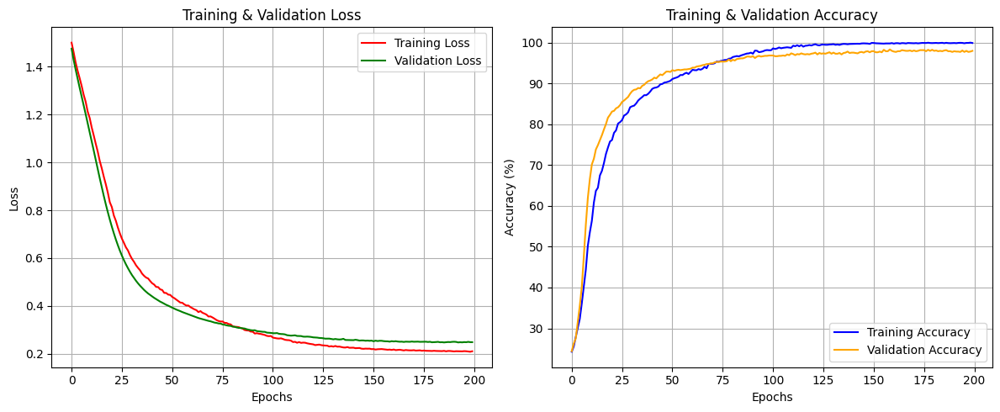

📈 Saved plots at /kaggle/working/swin_transformer/swin_training_plots.png


In [13]:
import os
import matplotlib.pyplot as plt
import pandas as pd
import torch
from transformers import SwinForImageClassification

# Create output directory if it doesn't exist
save_dir = '/kaggle/working/swin_transformer'
os.makedirs(save_dir, exist_ok=True)

# Load Swin model from .pth file
model_path = '/kaggle/input/swin_test/pytorch/default/2/swinnn/swin_model_best_acc.pth'
try:
    # Initialize Swin model
    model = SwinForImageClassification.from_pretrained(
        'microsoft/swin-base-patch4-window7-224',
        num_labels=4,  # Assuming 4 classes (brain tumor dataset), adjust if different
        ignore_mismatched_sizes=True
    )
    # Load state_dict from .pth file
    state_dict = torch.load(model_path, map_location='cpu')  # Use 'cuda' if GPU available
    # Handle different state_dict formats
    if 'model' in state_dict:
        state_dict = state_dict['model']
    elif 'state_dict' in state_dict:
        state_dict = state_dict['state_dict']
    # Filter matching keys
    model_dict = model.state_dict()
    state_dict = {k: v for k, v in state_dict.items() if k in model_dict}
    model_dict.update(state_dict)
    model.load_state_dict(model_dict)
    model.eval()  # Set to evaluation mode
    print(f"Successfully loaded Swin model from {model_path}")
except Exception as e:
    print(f"Error loading Swin model: {e}")
    exit(1)

# Load training history from CSV
history_path = '/kaggle/input/swin_test/pytorch/default/2/swin_training_log.csv'
try:
    history = pd.read_csv(history_path)
    # Extract columns
    train_losses = history['Train Loss']
    val_losses = history['Val Loss']
    train_accuracies = history['Train Accuracy']
    val_accuracies = history['Val Accuracy']
except Exception as e:
    print(f"Error loading CSV file: {e}")
    exit(1)

# Plot training history
plt.figure(figsize=(12, 5))

# Loss plot
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Training Loss', color='red')
plt.plot(val_losses, label='Validation Loss', color='green')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training & Validation Loss')
plt.legend()
plt.grid()

# Accuracy plot
plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label='Training Accuracy', color='blue')
plt.plot(val_accuracies, label='Validation Accuracy', color='orange')
plt.xlabel('Epochs')
plt.ylabel('Accuracy (%)')
plt.title('Training & Validation Accuracy')
plt.legend()
plt.grid()

plt.tight_layout()
plot_path = os.path.join(save_dir, 'swin_training_plots.png')
plt.savefig(plot_path)
plt.show()
plt.close()
print(f"📈 Saved plots at {plot_path}")

Using device: cuda
Class list: ['glioma', 'meningioma', 'notumor', 'pituitary']
Number of classes: 4
📊 Test images: 1311
Detected: output_dim=4, hidden_dim=1024
✅ Loaded model from /kaggle/input/swin_test/pytorch/default/2/swinnn/swin_model_best_acc.pth


Testing: 100%|██████████| 82/82 [00:24<00:00,  3.38it/s]


Test Accuracy: 98.40%


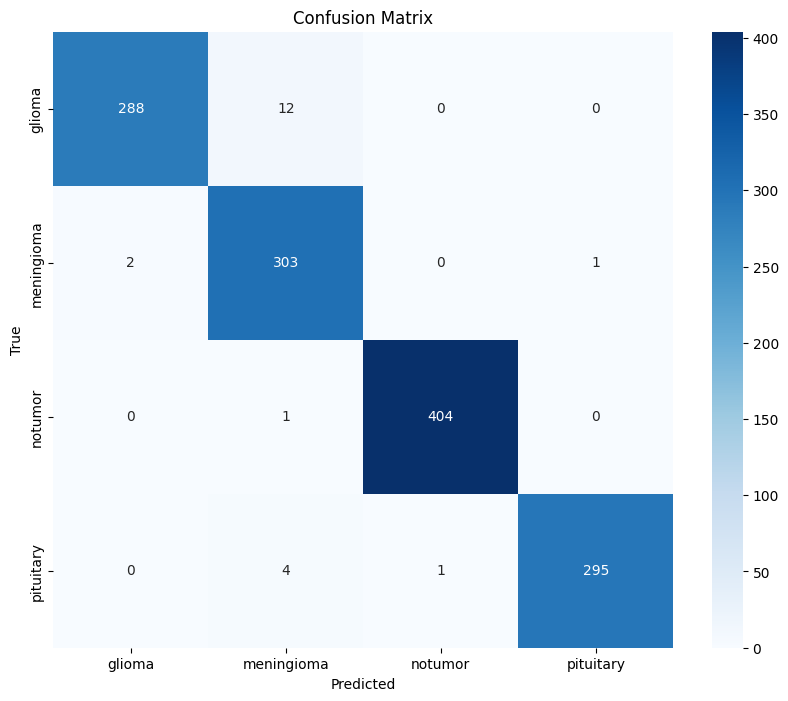

📊 Confusion matrix saved to /kaggle/working/swin_results/confusion_matrix.png

Classification Report:
              precision    recall  f1-score   support

      glioma       0.99      0.96      0.98       300
  meningioma       0.95      0.99      0.97       306
     notumor       1.00      1.00      1.00       405
   pituitary       1.00      0.98      0.99       300

    accuracy                           0.98      1311
   macro avg       0.98      0.98      0.98      1311
weighted avg       0.98      0.98      0.98      1311

📊 Classification report saved to /kaggle/working/swin_results/classification_report.txt

Misclassified Images: 21
📊 Misclassified images info saved to /kaggle/working/swin_results/misclassified_images.txt


In [15]:
import os
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from transformers import SwinForImageClassification, SwinConfig
from tqdm import tqdm
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Thiết lập seed để tái hiện
seed = 42
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
np.random.seed(seed)

# Thiết lập thư mục lưu kết quả
save_dir = "/kaggle/working/swin_results"
os.makedirs(save_dir, exist_ok=True)

# Thiết lập device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Định nghĩa transform cho tập kiểm tra
val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Tải dataset kiểm tra
data_dir = "/kaggle/input/brain-tumor-mri-dataset"
test_dataset = datasets.ImageFolder(os.path.join(data_dir, "Testing"), transform=val_transform)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)
class_names = test_dataset.classes
print(f"Class list: {class_names}")
print(f"Number of classes: {len(class_names)}")
print(f"📊 Test images: {len(test_dataset)}")

# Số lớp
num_classes = len(class_names)
output_dim = num_classes
hidden_dim = 1024

print(f"Detected: output_dim={output_dim}, hidden_dim={hidden_dim}")

# Tạo cấu hình tùy chỉnh cho Swin Transformer
config = SwinConfig(
    image_size=224,
    patch_size=4,
    num_channels=3,
    embed_dim=128,
    depths=[2, 2, 18, 2],
    num_heads=[4, 8, 16, 32],
    window_size=7,
    num_labels=output_dim
)

# Khởi tạo mô hình với cấu hình tùy chỉnh
model = SwinForImageClassification(config)

# Tùy chỉnh classifier
model.classifier = nn.Sequential(
    nn.Dropout(0.3),
    nn.Linear(model.classifier.in_features, output_dim)
)

# Chuyển mô hình sang device
model.to(device)

# Hàm đánh giá và tạo ma trận nhầm lẫn
def evaluate_model(model, test_loader, device, class_names, model_path, dataset):
    # Tải mô hình đã lưu
    try:
        state_dict = torch.load(model_path, map_location=device)
        model.load_state_dict(state_dict, strict=False)
        print(f"✅ Loaded model from {model_path}")
    except Exception as e:
        print(f"❌ Error loading model: {e}")
        return

    # Chuyển mô hình sang chế độ đánh giá
    model.eval()
    test_correct, test_total = 0, 0
    predictions = []
    true_labels = []
    misclassified_samples = []  # Lưu thông tin các mẫu sai

    # Lặp qua từng batch và ghi lại các mẫu sai
    with torch.no_grad():
        for batch_idx, (images, labels) in enumerate(tqdm(test_loader, desc="Testing")):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            logits = outputs.logits
            _, predicted = torch.max(logits, 1)
            test_correct += (predicted == labels).sum().item()
            test_total += labels.size(0)

            # Xác định các mẫu sai trong batch
            for i in range(len(labels)):
                if predicted[i] != labels[i]:
                    # Tính chỉ số toàn cục của mẫu trong dataset
                    global_idx = batch_idx * test_loader.batch_size + i
                    # Lấy đường dẫn ảnh từ dataset.samples
                    image_path = dataset.samples[global_idx][0]
                    true_label = class_names[labels[i].item()]
                    pred_label = class_names[predicted[i].item()]
                    misclassified_samples.append({
                        "image_path": image_path,
                        "true_label": true_label,
                        "predicted_label": pred_label
                    })

            predictions.extend(predicted.cpu().numpy())
            true_labels.extend(labels.cpu().numpy())

    # Tính độ chính xác
    accuracy = 100 * test_correct / test_total
    print(f"Test Accuracy: {accuracy:.2f}%")

    # Tạo ma trận nhầm lẫn
    cm = confusion_matrix(true_labels, predictions)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title("Confusion Matrix")
    cm_path = os.path.join(save_dir, "confusion_matrix.png")
    plt.savefig(cm_path)
    plt.show()
    plt.close()
    print(f"📊 Confusion matrix saved to {cm_path}")

    # In báo cáo phân loại
    print("\nClassification Report:")
    print(classification_report(true_labels, predictions, target_names=class_names))
    
    # Lưu báo cáo phân loại vào file
    report_path = os.path.join(save_dir, "classification_report.txt")
    with open(report_path, "w") as f:
        f.write(classification_report(true_labels, predictions, target_names=class_names))
    print(f"📊 Classification report saved to {report_path}")

    # In thông tin các ảnh nhận diện sai
    print(f"\nMisclassified Images: {len(misclassified_samples)}")

    # Lưu thông tin các ảnh sai vào file
    misclassified_path = os.path.join(save_dir, "misclassified_images.txt")
    with open(misclassified_path, "w") as f:
        if misclassified_samples:
            for sample in misclassified_samples:
                f.write(f"Image: {sample['image_path']}\n")
                f.write(f"True Label: {sample['true_label']}\n")
                f.write(f"Predicted Label: {sample['predicted_label']}\n")
                f.write("-" * 50 + "\n")
        else:
            f.write("No misclassified images found.\n")
    print(f"📊 Misclassified images info saved to {misclassified_path}")

# Đường dẫn đến mô hình đã lưu
model_path = "/kaggle/input/swin_test/pytorch/default/2/swinnn/swin_model_best_acc.pth"

# Gọi hàm đánh giá
evaluate_model(model, test_loader, device, class_names, model_path, test_dataset)

In [16]:
import os
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from transformers import SwinForImageClassification, SwinConfig
from tqdm import tqdm
from sklearn.metrics import average_precision_score
import numpy as np

# Thiết lập seed để tái hiện
seed = 42
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
np.random.seed(seed)

# Thiết lập thư mục lưu kết quả
save_dir = "/kaggle/working/swin_results"
os.makedirs(save_dir, exist_ok=True)

# Thiết lập device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Định nghĩa transform cho tập kiểm tra
val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Tải dataset kiểm tra
data_dir = "/kaggle/input/brain-tumor-mri-dataset"
test_dataset = datasets.ImageFolder(os.path.join(data_dir, "Testing"), transform=val_transform)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)
class_names = test_dataset.classes
print(f"Class list: {class_names}")
print(f"Number of classes: {len(class_names)}")
print(f"📊 Test images: {len(test_dataset)}")

# Số lớp
num_classes = len(class_names)
output_dim = num_classes
hidden_dim = 1024

print(f"Detected: output_dim={output_dim}, hidden_dim={hidden_dim}")

# Tạo cấu hình tùy chỉnh cho Swin Transformer
config = SwinConfig(
    image_size=224,
    patch_size=4,
    num_channels=3,
    embed_dim=128,
    depths=[2, 2, 18, 2],
    num_heads=[4, 8, 16, 32],
    window_size=7,
    num_labels=output_dim
)

# Khởi tạo mô hình với cấu hình tùy chỉnh
model = SwinForImageClassification(config)

# Tùy chỉnh classifier
model.classifier = nn.Sequential(
    nn.Dropout(0.3),
    nn.Linear(model.classifier.in_features, output_dim)
)

# Chuyển mô hình sang device
model.to(device)

# Hàm tính mAP
def calculate_mAP(model, data_loader, device, class_names, save_dir, model_path):
    """
    Tính mAP (mean Average Precision) cho mô hình trên tập dữ liệu.

    Args:
        model: Mô hình đã huấn luyện
        data_loader: DataLoader chứa dữ liệu cần đánh giá
        device: Thiết bị (CPU/GPU)
        class_names: Danh sách tên lớp
        save_dir: Thư mục để lưu kết quả
        model_path: Đường dẫn đến file mô hình đã lưu

    Returns:
        mAP: Giá trị mean Average Precision
        ap_scores: Dictionary chứa AP score cho từng lớp
    """
    # Tải mô hình đã lưu
    try:
        state_dict = torch.load(model_path, map_location=device)
        model.load_state_dict(state_dict, strict=False)
        print(f"✅ Loaded model from {model_path}")
    except Exception as e:
        print(f"❌ Error loading model: {e}")
        return None, None

    model.eval()
    all_probs = []
    all_labels = []

    # Thu thập xác suất dự đoán và nhãn thực tế
    with torch.no_grad():
        for images, labels in tqdm(data_loader, desc="Calculating mAP"):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images).logits
            probs = torch.softmax(outputs, dim=1)  # Chuyển logits thành xác suất
            all_probs.append(probs.cpu().numpy())
            all_labels.append(labels.cpu().numpy())

    # Chuyển sang numpy arrays
    all_probs = np.concatenate(all_probs, axis=0)
    all_labels = np.concatenate(all_labels, axis=0)

    # Chuyển nhãn thành one-hot encoding để tính AP
    num_classes = len(class_names)
    all_labels_one_hot = np.zeros((all_labels.shape[0], num_classes))
    for i, label in enumerate(all_labels):
        all_labels_one_hot[i, label] = 1

    # Tính AP cho từng lớp
    ap_scores = {}
    for class_idx, class_name in enumerate(class_names):
        ap = average_precision_score(all_labels_one_hot[:, class_idx], all_probs[:, class_idx])
        ap_scores[class_name] = ap
        print(f"AP for class '{class_name}': {ap:.4f}")

    # Tính mAP
    mAP = np.mean(list(ap_scores.values()))
    print(f"\nMean Average Precision (mAP): {mAP:.4f}")

    # Lưu kết quả vào file
    result_path = os.path.join(save_dir, "mAP_results.txt")
    with open(result_path, "w") as f:
        f.write(f"Mean Average Precision (mAP): {mAP:.4f}\n")
        f.write("\nAverage Precision per class:\n")
        for class_name, ap in ap_scores.items():
            f.write(f"{class_name}: {ap:.4f}\n")
    print(f"📊 Kết quả mAP được lưu tại: {result_path}")

    return mAP, ap_scores

# Đường dẫn đến mô hình đã lưu
model_path = "/kaggle/input/swin_test/pytorch/default/2/swinnn/swin_model_best_acc.pth"

# Tính mAP trên tập test
print("\nTính mAP trên tập test:")
mAP, ap_scores = calculate_mAP(model, test_loader, device, class_names, save_dir, model_path)

Using device: cuda
Class list: ['glioma', 'meningioma', 'notumor', 'pituitary']
Number of classes: 4
📊 Test images: 1311
Detected: output_dim=4, hidden_dim=1024

Tính mAP trên tập test:
✅ Loaded model from /kaggle/input/swin_test/pytorch/default/2/swinnn/swin_model_best_acc.pth


Calculating mAP: 100%|██████████| 82/82 [00:20<00:00,  3.99it/s]

AP for class 'glioma': 0.9953
AP for class 'meningioma': 0.9926
AP for class 'notumor': 1.0000
AP for class 'pituitary': 0.9998

Mean Average Precision (mAP): 0.9969
📊 Kết quả mAP được lưu tại: /kaggle/working/swin_results/mAP_results.txt


In [4]:
# Tải mô hình Swin đã huấn luyện
model_name = "microsoft/swin-base-patch4-window7-224"
model = SwinForImageClassification.from_pretrained(
    model_name,
    num_labels=len(full_dataset.classes),
    ignore_mismatched_sizes=True
)

# Định nghĩa lại classifier như khi huấn luyện
model.classifier = nn.Sequential(
    nn.Dropout(0.3),
    nn.Linear(model.config.hidden_size, model.config.num_labels)
)

# Chuyển mô hình sang thiết bị
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Tải trọng số từ file đã lưu
model_path = "/kaggle/input/swin_test/pytorch/default/2/swinnn/swin_model_best_acc.pth"
model.load_state_dict(torch.load(model_path, map_location=device))
model.eval()
print("✅ Mô hình đã được tải thành công!")

✅ Mô hình đã được tải thành công!


In [5]:
import torch.nn as nn

# Hàm tính Accuracy và Loss
def evaluate_accuracy_and_loss(model, data_loader, device, criterion):
    model.eval()
    running_loss = 0.0
    correct_preds = 0
    total_samples = 0

    with torch.no_grad():
        for images, labels in tqdm(data_loader, desc="Tính Acc & Loss"):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images).logits

            loss = criterion(outputs, labels)
            running_loss += loss.item() * images.size(0)

            _, preds = torch.max(outputs, 1)
            correct_preds += (preds == labels).sum().item()
            total_samples += labels.size(0)

    avg_loss = running_loss / total_samples
    accuracy = correct_preds / total_samples

    return accuracy, avg_loss

# Gọi hàm đánh giá
criterion = nn.CrossEntropyLoss()
accuracy_test, loss_test = evaluate_accuracy_and_loss(model, test_loader, device, criterion)

print(f"\n🎯 Accuracy (Test): {accuracy_test * 100:.2f}%")
print(f"📉 Loss (Test): {loss_test:.4f}")


Tính Acc & Loss: 100%|██████████| 82/82 [00:27<00:00,  2.98it/s]


🎯 Accuracy (Test): 98.40%
📉 Loss (Test): 0.0975


Using device: cuda
Classifier shape: torch.Size([4, 1024])
Detected: output_dim=4, hidden_dim=1024
Initializing Swin model with custom config...
Attempting to load state dict...
Model loaded with 0 missing keys and 0 unexpected keys
✅ Swin model loaded and ready for inference!


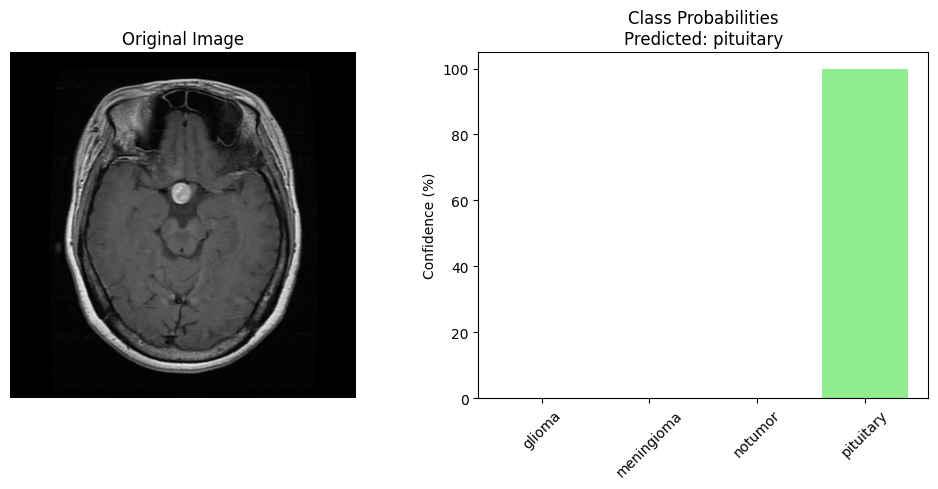


🔍 Prediction Results:
Image: Te-pi_0018.jpg
Predicted Class: pituitary
Confidence: 100.00%

📊 Class Probabilities:
glioma: 0.00%
meningioma: 0.00%
notumor: 0.00%
pituitary: 100.00%


In [18]:
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image
from transformers import SwinConfig, SwinForImageClassification
from torchvision import transforms
import os
import torch.nn.functional as F

# Chọn device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Tạo thư mục lưu kết quả
save_dir = "/content/drive/MyDrive/Colab Notebooks/chatluongcao/swin/results"
os.makedirs(save_dir, exist_ok=True)

# Khởi tạo transform
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Định nghĩa nhãn lớp
class_labels = ["glioma", "meningioma", "notumor", "pituitary"]

# Đường dẫn đến file mô hình
model_path = "/kaggle/input/swin_test/pytorch/default/2/swinnn/swin_model_best_acc.pth"

try:
    # Load state dict
    state_dict = torch.load(model_path, map_location=device)
    
    # Lấy state_dict thực sự (nếu là checkpoint)
    if isinstance(state_dict, dict) and 'model_state_dict' in state_dict:
        model_state_dict = state_dict['model_state_dict']
    else:
        model_state_dict = state_dict
    
    # Kiểm tra classifier shape để xác định cấu trúc
    output_dim = 4  # Mặc định 4 lớp
    hidden_dim = 1024  # Mặc định hidden_dim của Swin
    if 'classifier.1.weight' in model_state_dict:
        classifier_shape = model_state_dict['classifier.1.weight'].shape
        print(f"Classifier shape: {classifier_shape}")
        output_dim = classifier_shape[0]
        hidden_dim = classifier_shape[1]
    
    print(f"Detected: output_dim={output_dim}, hidden_dim={hidden_dim}")
    
    # Tạo cấu hình Swin
    config = SwinConfig(
        image_size=224,
        patch_size=4,
        num_channels=3,
        embed_dim=128,
        depths=[2, 2, 18, 2],
        num_heads=[4, 8, 16, 32],
        window_size=7,
        num_labels=output_dim
    )
    
    # Khởi tạo mô hình
    print("Initializing Swin model with custom config...")
    model = SwinForImageClassification(config)
    
    # Tùy chỉnh classifier
    model.classifier = nn.Sequential(
        nn.Dropout(0.3),
        nn.Linear(hidden_dim, output_dim)
    )
    
    # Tải state dict
    print("Attempting to load state dict...")
    missing_keys, unexpected_keys = model.load_state_dict(model_state_dict, strict=False)
    
    print(f"Model loaded with {len(missing_keys)} missing keys and {len(unexpected_keys)} unexpected keys")
    if missing_keys:
        print("Sample missing keys:", missing_keys[:5])
    if unexpected_keys:
        print("Sample unexpected keys:", unexpected_keys[:5])
    
    # Chuyển mô hình sang thiết bị và chế độ eval
    model.to(device)
    model.eval()
    print("✅ Swin model loaded and ready for inference!")

except Exception as e:
    print(f"❌ Error loading model: {e}")
    # Debug thông tin state_dict
    try:
        keys = list(model_state_dict.keys())
        print("\nSample keys in state_dict:")
        for i in range(min(10, len(keys))):
            print(f"  {keys[i]}")
        print("\nTotal keys in state_dict:", len(keys))
        print("\nSuggestion: Ensure the model architecture matches the saved state_dict.")
    except Exception as debug_error:
        print(f"Error during debugging: {debug_error}")
    exit(1)

def preprocess_image(image_path):
    """Tiền xử lý ảnh"""
    if not os.path.exists(image_path):
        print(f"Error: File {image_path} does not exist")
        return None, None
    try:
        image = Image.open(image_path).convert("RGB")
        input_tensor = transform(image).unsqueeze(0).to(device)
        return image, input_tensor
    except Exception as e:
        print(f"Error loading image {image_path}: {str(e)}")
        return None, None

def predict_single_image(image_path, model):
    """Dự đoán và trực quan hóa kết quả cho một ảnh"""
    image, input_tensor = preprocess_image(image_path)
    if image is None or input_tensor is None:
        return None, 0

    try:
        # Dự đoán
        with torch.no_grad():
            outputs = model(input_tensor)
            logits = outputs.logits
            probs = F.softmax(logits, dim=-1)
            predicted_class = torch.argmax(probs, dim=-1).item()
            confidence = probs[0][predicted_class].item() * 100

        predicted_label = class_labels[predicted_class]

        # Lưu kết quả
        result_path = os.path.join(save_dir, f"{os.path.basename(image_path).split('.')[0]}_result.jpg")

        # Trực quan hóa
        plt.figure(figsize=(10, 5))

        # Ảnh gốc
        image_cv2 = cv2.cvtColor(np.array(image), cv2.COLOR_RGB2BGR)
        plt.subplot(1, 2, 1)
        plt.imshow(image_cv2)
        plt.title('Original Image')
        plt.axis('off')

        # Xác suất các lớp
        plt.subplot(1, 2, 2)
        class_probs = probs[0].cpu().numpy() * 100
        colors = ['lightcoral' if i != predicted_class else 'lightgreen' for i in range(len(class_labels))]
        plt.bar(class_labels, class_probs, color=colors)
        plt.title(f'Class Probabilities\nPredicted: {predicted_label}')
        plt.xticks(rotation=45)
        plt.ylabel('Confidence (%)')

        plt.tight_layout()
        plt.savefig(result_path)
        plt.show()

        # In kết quả chi tiết
        print("\n🔍 Prediction Results:")
        print(f"Image: {os.path.basename(image_path)}")
        print(f"Predicted Class: {predicted_label}")
        print(f"Confidence: {confidence:.2f}%")
        print("\n📊 Class Probabilities:")
        for label, prob in zip(class_labels, class_probs):
            print(f"{label}: {prob:.2f}%")

        return predicted_label, confidence

    except Exception as e:
        print(f"Error processing image {image_path}: {str(e)}")
        return None, 0

def predict_batch(folder_path, model, num_samples=None):
    """Dự đoán nhiều ảnh từ một thư mục"""
    if not os.path.exists(folder_path):
        print(f"Error: Folder {folder_path} does not exist")
        return []

    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    if num_samples:
        image_files = image_files[:num_samples]

    results = []
    print(f"\n🚀 Processing {len(image_files)} images...")

    for image_file in image_files:
        image_path = os.path.join(folder_path, image_file)
        predicted_label, confidence = predict_single_image(image_path, model)
        if predicted_label:
            results.append({
                'file': image_file,
                'prediction': predicted_label,
                'confidence': confidence
            })
        print("\n" + "="*50)

    # Lưu tóm tắt vào file
    summary_path = os.path.join(save_dir, "batch_results_summary.txt")
    with open(summary_path, "w") as f:
        f.write("📊 Batch Prediction Summary:\n")
        f.write(f"Total images processed: {len(results)}\n\n")
        class_counts = {}
        for result in results:
            class_counts[result['prediction']] = class_counts.get(result['prediction'], 0) + 1
        f.write("Predicted Class Distribution:\n")
        for class_name, count in class_counts.items():
            percentage = (count / len(results)) * 100
            f.write(f"{class_name}: {count} images ({percentage:.1f}%)\n")
        if results:
            avg_confidence = sum(result['confidence'] for result in results) / len(results)
            f.write(f"\nAverage confidence: {avg_confidence:.2f}%\n")
        else:
            f.write("\nNo valid results to calculate average confidence\n")

    # In tóm tắt
    print("\n📊 Batch Prediction Summary:")
    print(f"Total images processed: {len(results)}")
    if results:
        class_counts = {}
        for result in results:
            class_counts[result['prediction']] = class_counts.get(result['prediction'], 0) + 1
        print("\nPredicted Class Distribution:")
        for class_name, count in class_counts.items():
            percentage = (count / len(results)) * 100
            print(f"{class_name}: {count} images ({percentage:.1f}%)")
        avg_confidence = sum(result['confidence'] for result in results) / len(results)
        print(f"\nAverage confidence: {avg_confidence:.2f}%")
    else:
        print("No valid results to display")

    print(f"\n✅ Summary saved to: {summary_path}")
    return results

# Sử dụng ví dụ
test_image_path = "/kaggle/input/brain-tumor-mri-dataset/Testing/pituitary/Te-pi_0018.jpg"

result = predict_single_image(test_image_path, model)

# Test nhiều ảnh từ thư mục (bỏ comment để sử dụng)
# folder_path = '/content/drive/MyDrive/archive_brain/Testing/meningioma'
# results = predict_batch(folder_path, model, num_samples=5)

Using device: cuda
📊 Test images: 1311
Classifier shape: torch.Size([4, 1024])
Detected: output_dim=4, hidden_dim=1024
Initializing Swin model with custom config...
Attempting to load state dict...
Model loaded with 0 missing keys and 0 unexpected keys
✅ Swin model loaded and ready for inference!


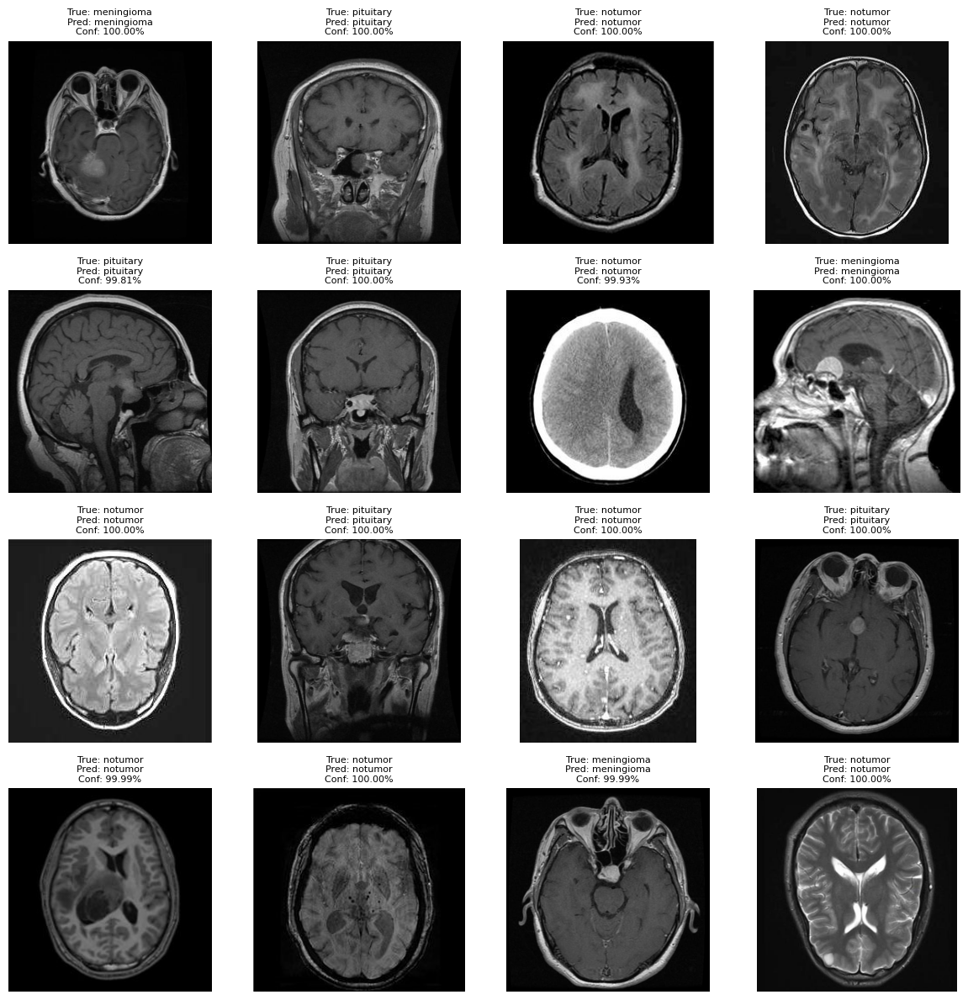

✅ Grid image saved to: /content/drive/MyDrive/Colab Notebooks/chatluongcao/swin/results/random_16_images_result.jpg

📊 Random 16 Images Prediction Summary:
Total images processed: 16
Accuracy: 16/16 (100.00%)

✅ Summary saved to: /content/drive/MyDrive/Colab Notebooks/chatluongcao/swin/results/random_16_results_summary.txt


In [19]:
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from transformers import SwinConfig, SwinForImageClassification
from torchvision import transforms, datasets
import os
import torch.nn.functional as F
import random

# Chọn device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Tạo thư mục lưu kết quả
save_dir = "/content/drive/MyDrive/Colab Notebooks/chatluongcao/swin/results"
os.makedirs(save_dir, exist_ok=True)

# Khởi tạo transform
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Định nghĩa nhãn lớp
class_labels = ["glioma", "meningioma", "notumor", "pituitary"]

# Tải dataset kiểm tra
data_dir = "/kaggle/input/brain-tumor-mri-dataset"
test_dataset = datasets.ImageFolder(os.path.join(data_dir, "Testing"), transform=transform)
print(f"📊 Test images: {len(test_dataset)}")

# Chọn ngẫu nhiên 16 ảnh
random_indices = random.sample(range(len(test_dataset)), 16)
random_samples = [test_dataset.samples[i] for i in random_indices]

# Đường dẫn đến file mô hình
model_path = "/kaggle/input/swin_test/pytorch/default/2/swinnn/swin_model_best_acc.pth"

try:
    # Load state dict
    state_dict = torch.load(model_path, map_location=device)
    
    # Lấy state_dict thực sự (nếu là checkpoint)
    if isinstance(state_dict, dict) and 'model_state_dict' in state_dict:
        model_state_dict = state_dict['model_state_dict']
    else:
        model_state_dict = state_dict
    
    # Kiểm tra classifier shape để xác định cấu trúc
    output_dim = 4  # Mặc định 4 lớp
    hidden_dim = 1024  # Mặc định hidden_dim của Swin
    if 'classifier.1.weight' in model_state_dict:
        classifier_shape = model_state_dict['classifier.1.weight'].shape
        print(f"Classifier shape: {classifier_shape}")
        output_dim = classifier_shape[0]
        hidden_dim = classifier_shape[1]
    
    print(f"Detected: output_dim={output_dim}, hidden_dim={hidden_dim}")
    
    # Tạo cấu hình Swin
    config = SwinConfig(
        image_size=224,
        patch_size=4,
        num_channels=3,
        embed_dim=128,
        depths=[2, 2, 18, 2],
        num_heads=[4, 8, 16, 32],
        window_size=7,
        num_labels=output_dim
    )
    
    # Khởi tạo mô hình
    print("Initializing Swin model with custom config...")
    model = SwinForImageClassification(config)
    
    # Tùy chỉnh classifier
    model.classifier = nn.Sequential(
        nn.Dropout(0.3),
        nn.Linear(hidden_dim, output_dim)
    )
    
    # Tải state dict
    print("Attempting to load state dict...")
    missing_keys, unexpected_keys = model.load_state_dict(model_state_dict, strict=False)
    
    print(f"Model loaded with {len(missing_keys)} missing keys and {len(unexpected_keys)} unexpected keys")
    if missing_keys:
        print("Sample missing keys:", missing_keys[:5])
    if unexpected_keys:
        print("Sample unexpected keys:", unexpected_keys[:5])
    
    # Chuyển mô hình sang thiết bị và chế độ eval
    model.to(device)
    model.eval()
    print("✅ Swin model loaded and ready for inference!")

except Exception as e:
    print(f"❌ Error loading model: {e}")
    exit(1)

def preprocess_image(image_path):
    """Tiền xử lý ảnh"""
    if not os.path.exists(image_path):
        print(f"Error: File {image_path} does not exist")
        return None, None
    try:
        image = Image.open(image_path).convert("RGB")
        input_tensor = transform(image).unsqueeze(0).to(device)
        return image, input_tensor
    except Exception as e:
        print(f"Error loading image {image_path}: {str(e)}")
        return None, None

def predict_single_image(image_path, true_label_idx, model):
    """Dự đoán và trả về kết quả cho một ảnh"""
    image, input_tensor = preprocess_image(image_path)
    if image is None or input_tensor is None:
        return None, None, None, 0

    try:
        # Dự đoán
        with torch.no_grad():
            outputs = model(input_tensor)
            logits = outputs.logits
            probs = F.softmax(logits, dim=-1)
            predicted_class = torch.argmax(probs, dim=-1).item()
            confidence = probs[0][predicted_class].item() * 100

        predicted_label = class_labels[predicted_class]
        true_label = class_labels[true_label_idx]

        return image, predicted_label, true_label, confidence

    except Exception as e:
        print(f"Error processing image {image_path}: {str(e)}")
        return None, None, None, 0

def test_16_random_images(samples, model):
    """Test 16 ảnh ngẫu nhiên và hiển thị trong lưới 4x4"""
    results = []
    plt.figure(figsize=(12, 12))

    for i, (image_path, true_label_idx) in enumerate(samples):
        image, predicted_label, true_label, confidence = predict_single_image(image_path, true_label_idx, model)
        if image is not None:
            # Hiển thị ảnh trong lưới 4x4
            plt.subplot(4, 4, i + 1)
            plt.imshow(image)
            plt.title(f"True: {true_label}\nPred: {predicted_label}\nConf: {confidence:.2f}%", fontsize=8)
            plt.axis('off')
            
            # Lưu thông tin kết quả
            results.append({
                'file': os.path.basename(image_path),
                'true_label': true_label,
                'predicted_label': predicted_label,
                'confidence': confidence
            })

    plt.tight_layout()
    result_path = os.path.join(save_dir, "random_16_images_result.jpg")
    plt.savefig(result_path)
    plt.show()
    print(f"✅ Grid image saved to: {result_path}")

    # Lưu tóm tắt vào file
    summary_path = os.path.join(save_dir, "random_16_results_summary.txt")
    with open(summary_path, "w") as f:
        f.write("📊 Random 16 Images Prediction Summary:\n")
        f.write(f"Total images processed: {len(results)}\n\n")
        correct = sum(1 for r in results if r['true_label'] == r['predicted_label'])
        accuracy = (correct / len(results)) * 100 if results else 0
        f.write(f"Accuracy: {correct}/{len(results)} ({accuracy:.2f}%)\n\n")
        f.write("Prediction Details:\n")
        for result in results:
            f.write(f"Image: {result['file']}\n")
            f.write(f"True Label: {result['true_label']}\n")
            f.write(f"Predicted Label: {result['predicted_label']}\n")
            f.write(f"Confidence: {result['confidence']:.2f}%\n")
            f.write("-" * 50 + "\n")

    # In tóm tắt
    print("\n📊 Random 16 Images Prediction Summary:")
    print(f"Total images processed: {len(results)}")
    print(f"Accuracy: {correct}/{len(results)} ({accuracy:.2f}%)")
    print(f"\n✅ Summary saved to: {summary_path}")

    return results

# Gọi hàm để test 16 ảnh ngẫu nhiên
results = test_16_random_images(random_samples, model)

ok

✅ Tải mô hình thành công!
✅ Mô hình chạy trên thiết bị: cuda


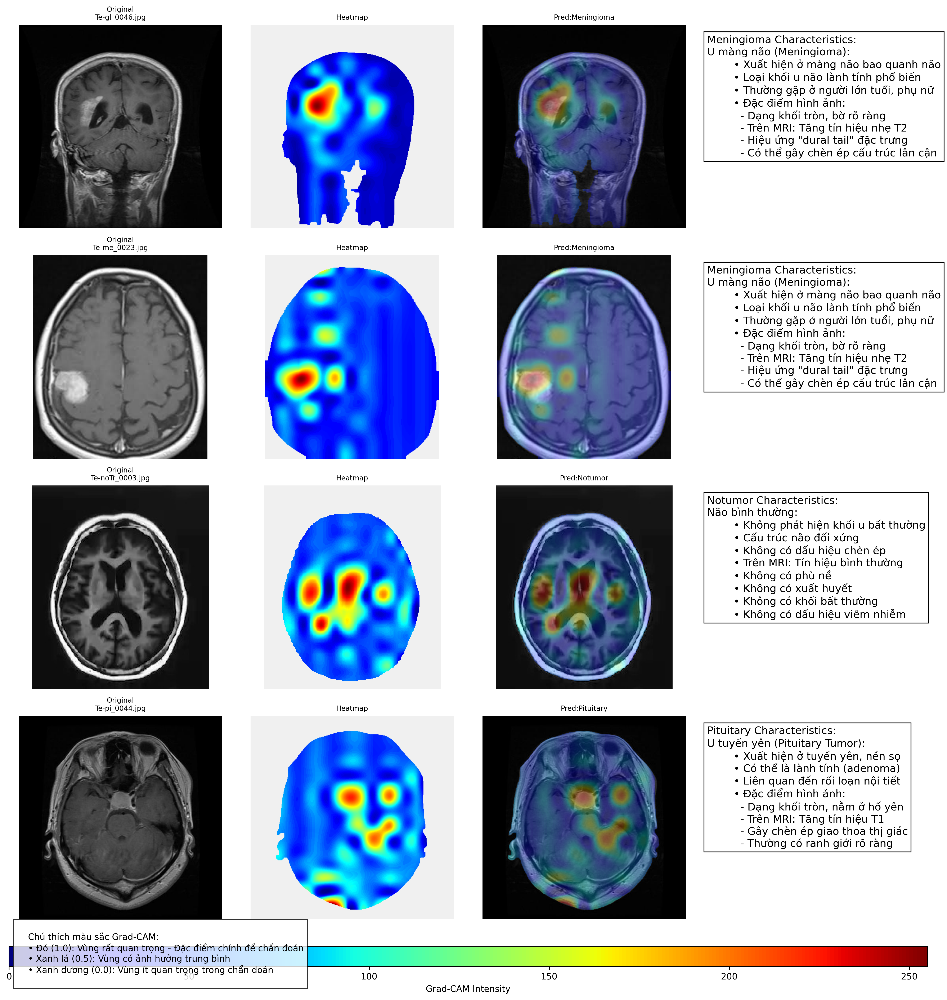


Lưu ý: Kết quả chỉ mang tính tham khảo. Hãy tham khảo ý kiến bác sĩ thần kinh để đánh giá chuyên môn!


In [4]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image
from transformers import AutoImageProcessor, SwinForImageClassification
from torchvision import transforms
from sklearn.cluster import KMeans
from IPython.display import Image as DisplayImage, display
import uuid
from matplotlib.gridspec import GridSpec
import os
import warnings
from transformers.utils import logging

# Tắt toàn bộ cảnh báo
warnings.filterwarnings("ignore")
# Tắt log của thư viện Transformers
logging.set_verbosity_error()
# Define class labels
class_labels = ["glioma", "meningioma", "notumor", "pituitary"]

# Image paths
image_paths = {
    "glioma": "/kaggle/input/brain-tumor-mri-dataset/Testing/glioma/Te-gl_0046.jpg",
    "meningioma": "/kaggle/input/brain-tumor-mri-dataset/Testing/meningioma/Te-me_0023.jpg",
    "notumor": "/kaggle/input/brain-tumor-mri-dataset/Testing/notumor/Te-noTr_0003.jpg",
    "pituitary": "/kaggle/input/brain-tumor-mri-dataset/Testing/pituitary/Te-pi_0044.jpg"
}

def get_brain_tumor_characteristics(tumor_type):
    """
    Returns detailed information about the characteristics of each brain tumor type, standardized to 9 lines.
    """
    characteristics = {
        'glioma': """
        Khối u thần kinh đệm (Glioma):
        • Xuất hiện ở mô thần kinh đệm
        • Loại khối u não nguyên phát phổ biến
        • Liên quan đến di truyền hoặc bức xạ
        • Đặc điểm hình ảnh:
          - Bờ không đều, khối không đồng nhất
          - Gây phù nề xung quanh khối u
          - Trên MRI: Tăng tín hiệu T2/FLAIR
          - Có thể kèm xuất huyết hoặc hoại tử
        """,
        'meningioma': """
        U màng não (Meningioma):
        • Xuất hiện ở màng não bao quanh não
        • Loại khối u não lành tính phổ biến
        • Thường gặp ở người lớn tuổi, phụ nữ
        • Đặc điểm hình ảnh:
          - Dạng khối tròn, bờ rõ ràng
          - Trên MRI: Tăng tín hiệu nhẹ T2
          - Hiệu ứng "dural tail" đặc trưng
          - Có thể gây chèn ép cấu trúc lân cận
        """,
        'notumor': """
        Não bình thường:
        • Không phát hiện khối u bất thường
        • Cấu trúc não đối xứng
        • Không có dấu hiệu chèn ép
        • Trên MRI: Tín hiệu bình thường
        • Không có phù nề
        • Không có xuất huyết
        • Không có khối bất thường
        • Không có dấu hiệu viêm nhiễm
        """,
        'pituitary': """
        U tuyến yên (Pituitary Tumor):
        • Xuất hiện ở tuyến yên, nền sọ
        • Có thể là lành tính (adenoma)
        • Liên quan đến rối loạn nội tiết
        • Đặc điểm hình ảnh:
          - Dạng khối tròn, nằm ở hố yên
          - Trên MRI: Tăng tín hiệu T1
          - Gây chèn ép giao thoa thị giác
          - Thường có ranh giới rõ ràng
        """
    }
    return characteristics.get(tumor_type, "Không có thông tin")

# Initialize standard transform
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Initialize feature extractor for Swin
feature_extractor = AutoImageProcessor.from_pretrained('microsoft/swin-base-patch4-window7-224')

class SwinGradCAM:
    def __init__(self, model, target_layers=["swin.encoder.layers.2.blocks.1"]):
        self.model = model
        self.target_layers = target_layers
        self.hooks = []
        self.gradients = {}
        self.activations = {}
        for layer in target_layers:
            found_layer = False
            for name, module in model.named_modules():
                if layer in name:
                    self.hooks.append(module.register_forward_hook(lambda mod, inp, out, l=layer: self._save_activation(l, out)))
                    self.hooks.append(module.register_full_backward_hook(lambda mod, grad_in, grad_out, l=layer: self._save_gradient(l, grad_out)))
                    found_layer = True
                    break
            if not found_layer:
                print(f"⚠️ Không tìm thấy tầng {layer}.")

    def _save_activation(self, layer, output):
        if isinstance(output, tuple):
            output = output[0]
        self.activations[layer] = output.detach()

    def _save_gradient(self, layer, grad_output):
        if isinstance(grad_output, tuple):
            grad_output = grad_output[0]
        self.gradients[layer] = grad_output.detach()

    def remove_hooks(self):
        for hook in self.hooks:
            hook.remove()
        self.hooks = []

    def generate_cam(self, input_tensor, target_class=None, top_k=1, image=None):
        self.model.eval()
        self.model.zero_grad()
        outputs = self.model(input_tensor, output_attentions=True)
        logits = outputs.logits
        softmax_scores = torch.softmax(logits, dim=1)[0]

        if target_class is None:
            topk_scores, topk_indices = torch.topk(softmax_scores, top_k)
        else:
            topk_indices = [target_class]
            topk_scores = [softmax_scores[target_class]]

        combined_cam = None
        valid_layers = []
        for idx, score in zip(topk_indices, topk_scores):
            self.model.zero_grad()
            one_hot = torch.zeros_like(logits)
            one_hot[0, idx] = 1
            logits.backward(gradient=one_hot, retain_graph=True)

            layer_cam = None
            for layer in self.target_layers:
                cam = self._generate_weighted_attention(input_tensor, idx.item(), image, layer)
                if cam is not None:
                    if layer_cam is None:
                        layer_cam = cam
                    else:
                        layer_cam += cam
                    valid_layers.append(layer)
            
            if layer_cam is not None and valid_layers:
                layer_cam /= len(valid_layers)
                if combined_cam is None:
                    combined_cam = layer_cam * score.item()
                else:
                    combined_cam += layer_cam * score.item()
            else:
                print(f"⚠️ Không có CAM hợp lệ cho lớp {class_labels[idx.item()]}. Sử dụng dự phòng.")
                combined_cam = self._generate_fallback_cam(input_tensor)

        if hasattr(outputs, 'attentions') and outputs.attentions is not None:
            attention_maps = torch.stack(outputs.attentions[-1:]).mean(dim=0)
            attention_maps = attention_maps.mean(dim=1)[:, 1:, 1:].mean(dim=1)
            num_patches = attention_maps.shape[-1]
            side_len = 14
            attention_cam = attention_maps.detach().cpu().numpy()
            try:
                attention_cam = attention_cam.reshape(-1, side_len, side_len).mean(axis=0)
            except ValueError:
                attention_cam = attention_cam.reshape(-1, num_patches)
                attention_cam = cv2.resize(attention_cam, (side_len, side_len), interpolation=cv2.INTER_LANCZOS4)
                attention_cam = attention_cam / (attention_cam.max() + 1e-8)
            attention_cam = (attention_cam - attention_cam.min()) / (attention_cam.max() - attention_cam.min() + 1e-8)
            if combined_cam is not None:
                combined_cam = cv2.resize(combined_cam, (side_len, side_len), interpolation=cv2.INTER_LANCZOS4)
                combined_cam = (combined_cam - combined_cam.min()) / (combined_cam.max() - combined_cam.min() + 1e-8)
                combined_cam = 0.95 * combined_cam + 0.05 * attention_cam
            else:
                combined_cam = attention_cam

        if combined_cam is None or combined_cam.max() <= combined_cam.min():
            print("⚠️ CAM tổng hợp không hợp lệ. Sử dụng dự phòng.")
            combined_cam = self._generate_fallback_cam(input_tensor)

        if combined_cam.max() > combined_cam.min():
            combined_cam = (combined_cam - combined_cam.min()) / (combined_cam.max() - combined_cam.min() + 1e-8)

        predicted_class = torch.argmax(logits, dim=1).item()
        confidence = softmax_scores[predicted_class].item()
        return combined_cam, confidence, predicted_class

    def _generate_weighted_attention(self, input_tensor, target_class, image=None, layer=None):
        gradients = self.gradients.get(layer)
        activations = self.activations.get(layer)

        if gradients is None or activations is None or gradients.dim() != 3:
            print(f"⚠️ Gradient/activation không hợp lệ cho tầng {layer}. Bỏ qua.")
            return None

        weights = torch.mean(torch.abs(gradients), dim=2)[0]
        weights_mean = torch.mean(weights)
        weights_std = torch.std(weights)
        weights = (weights - weights_mean) / (weights_std + 1e-8)
        weights = torch.relu(weights)

        cam = torch.einsum('bs,bsh->bs', weights.unsqueeze(0), activations)[0].cpu().numpy()
        side_len = 14
        try:
            current_side = int(np.sqrt(cam.shape[0]))
            cam = cam.reshape(current_side, current_side)
            cam = cv2.resize(cam, (side_len, side_len), interpolation=cv2.INTER_LANCZOS4)
        except ValueError:
            cam = cam.reshape(1, -1)
            cam = cv2.resize(cam, (side_len, side_len), interpolation=cv2.INTER_LANCZOS4)
        cam = np.maximum(cam, 0)

        if cam.max() <= cam.min():
            print(f"⚠️ Giá trị CAM không hợp lệ cho tầng {layer}. Bỏ qua.")
            return None

        cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)

        if image is not None:
            image_np = np.array(image.convert("L"))
            image_resized = cv2.resize(image_np, (side_len, side_len), interpolation=cv2.INTER_LANCZOS4)
            image_normalized = (image_resized - image_resized.min()) / (image_resized.max() - image_resized.min() + 1e-8)
            cam = cam * (0.8 + 0.2 * image_normalized)

        return cam

    def _generate_fallback_cam(self, input_tensor):
        with torch.no_grad():
            outputs = self.model(input_tensor, output_attentions=True)
        if hasattr(outputs, 'attentions') and outputs.attentions is not None:
            attention_maps = torch.stack(outputs.attentions[-1:]).mean(dim=0)[:, :, 1:, 1:].mean(dim=1)
            num_patches = attention_maps.shape[-1]
            side_len = 14
            cam = attention_maps.detach().cpu().numpy()
            try:
                cam = cam.reshape(-1, side_len, side_len).mean(axis=0)
            except ValueError:
                cam = cam.reshape(-1, num_patches)
                cam = cv2.resize(cam, (side_len, side_len), interpolation=cv2.INTER_LANCZOS4)
                cam = cam / (cam.max() + 1e-8)
            cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
            return cam
        print("⚠️ Không có chú ý - Trả về heatmap ngẫu nhiên.")
        return np.random.rand(14, 14)

def create_head_mask(image, original_size):
    image_np = np.array(image.convert("L"))
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    image_enhanced = clahe.apply(image_np)
    thresh_val, binary = cv2.threshold(image_enhanced, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    adjusted_thresh = max(10, thresh_val * 0.9)
    _, binary_adjusted = cv2.threshold(image_enhanced, adjusted_thresh, 255, cv2.THRESH_BINARY)
    kernel = np.ones((5, 5), np.uint8)
    binary_cleaned = cv2.morphologyEx(binary_adjusted, cv2.MORPH_CLOSE, kernel, iterations=2)
    binary_cleaned = cv2.morphologyEx(binary_cleaned, cv2.MORPH_OPEN, kernel, iterations=1)
    contours, _ = cv2.findContours(binary_cleaned, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    mask = np.zeros_like(image_np, dtype=np.uint8)
    if contours:
        areas = [cv2.contourArea(cnt) for cnt in contours]
        if areas:
            min_area = np.mean(areas) * 0.1
            head_contours = [cnt for cnt in contours if cv2.contourArea(cnt) > max(min_area, 100)]
            cv2.drawContours(mask, head_contours, -1, 255, thickness=cv2.FILLED)
        else:
            mask = np.ones_like(image_np, dtype=np.uint8) * 255
    else:
        mask = np.ones_like(image_np, dtype=np.uint8) * 255
    mask = cv2.GaussianBlur(mask, (5, 5), 0)
    mask = np.where(mask > 100, 1.0, 0.0)
    mask = cv2.resize(mask, original_size, interpolation=cv2.INTER_NEAREST)
    return mask

def enhance_contrast(heatmap):
    heatmap_uint8 = np.uint8(255 * heatmap)
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    heatmap_enhanced = clahe.apply(heatmap_uint8) / 255.0
    return heatmap_enhanced

def detect_anomalies(heatmap, num_clusters=3, class_name=None):
    heatmap = enhance_contrast(heatmap)
    h, w = heatmap.shape
    X = np.stack([heatmap.flatten()], axis=1)
    kmeans = KMeans(n_clusters=num_clusters, random_state=42)
    labels = kmeans.fit_predict(X).reshape(h, w)
    cluster_means = [np.mean(heatmap[labels == i]) for i in range(num_clusters)]
    
    # Select the cluster with the highest mean intensity (no threshold)
    max_cluster_idx = np.argmax(cluster_means)
    binary_map = np.zeros_like(labels, dtype=np.uint8)
    binary_map[labels == max_cluster_idx] = 255
    
    # Find contours in the binary map
    contours, _ = cv2.findContours(binary_map, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    areas = [cv2.contourArea(cnt) for cnt in contours]
    
    # Filter contours by area (keep significant ones)
    if areas:
        min_area = np.mean(areas) * 0.5  # Use a general area filter
        anomaly_contours = [cnt for cnt in contours if cv2.contourArea(cnt) > max(min_area, 100)]
    else:
        anomaly_contours = []
    
    return anomaly_contours, binary_map

def load_custom_model(model_path, num_classes=4):
    model = SwinForImageClassification.from_pretrained('microsoft/swin-base-patch4-window7-224')
    model.classifier = torch.nn.Sequential(
        torch.nn.Dropout(0.3),
        torch.nn.Linear(model.config.hidden_size, num_classes)
    )
    try:
        checkpoint = torch.load(model_path, map_location=torch.device('cpu'), weights_only=True)
        model.load_state_dict(checkpoint, strict=False)
        print("✅ Tải mô hình thành công!")
    except Exception as e:
        print(f"❌ Lỗi khi tải mô hình: {e}")
        print("⚠️ Tiếp tục với mô hình cơ bản...")
    model.eval()
    return model

def preprocess_image(image_path):
    image = Image.open(image_path).convert("RGB")
    input_tensor = transform(image).unsqueeze(0)
    return image, input_tensor

def visualize_detection(image_path, model, target_class=None):
    image, input_tensor = preprocess_image(image_path)
    original_size = (image.width, image.height)
    
    # Create a head mask to isolate the brain region
    head_mask = create_head_mask(image, original_size)
    head_mask_3c = np.stack([head_mask, head_mask, head_mask], axis=2)

    # Run Grad-CAM to generate the heatmap
    device = next(model.parameters()).device
    input_tensor = input_tensor.to(device)
    gradcam = SwinGradCAM(model)
    cam, confidence, pred_class_idx = gradcam.generate_cam(input_tensor, target_class, image=image)
    gradcam.remove_hooks()
    class_name = class_labels[pred_class_idx]

    # Resize the heatmap to match the original image size
    cam_resized = cv2.resize(cam, (224, 224), interpolation=cv2.INTER_LANCZOS4)
    cam_resized = cv2.resize(cam_resized, original_size, interpolation=cv2.INTER_LANCZOS4)
    
    # Apply the head mask and normalize
    cam_resized = cam_resized * head_mask
    if cam_resized.max() > cam_resized.min():
        cam_resized = (cam_resized - cam_resized.min()) / (cam_resized.max() - cam_resized.min() + 1e-8)
        cam_resized = np.clip(cam_resized, 0.01, 1.0)
    else:
        cam_resized = np.zeros_like(cam_resized)
    
    # Enhance the heatmap contrast
    cam_resized = enhance_contrast(cam_resized)

    # Detect anomalies
    anomaly_contours, binary_map_uint8 = detect_anomalies(cam_resized, class_name=class_name)

    # Convert the heatmap to a colored version (using JET colormap)
    heatmap_uint8 = np.uint8(255 * cam_resized)
    heatmap_colored = cv2.applyColorMap(heatmap_uint8, cv2.COLORMAP_JET)
    heatmap_colored_rgb = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)

    # Create a background for the heatmap
    background_color = (240, 240, 240)
    bg_color_bgr = (background_color[2], background_color[1], background_color[0])
    background = np.ones((original_size[1], original_size[0], 3), dtype=np.uint8) * bg_color_bgr
    heatmap_with_bg = np.where(
        head_mask_3c > 0.1,
        heatmap_colored_rgb,
        background
    )

    # Convert the original image to numpy array
    image_np = np.array(image)
    image_np = cv2.cvtColor(image_np, cv2.COLOR_RGB2BGR)

    # Apply the overlay using cv2.addWeighted on the entire image, then mask
    alpha = 0.3
    overlay = cv2.addWeighted(image_np, 1-alpha, heatmap_colored, alpha, 0)
    overlay_image_rgb = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)

    # Apply the head mask to ensure only the brain region is overlaid
    overlay_image_rgb = np.where(
        head_mask_3c > 0.1,
        overlay_image_rgb,
        cv2.cvtColor(image_np, cv2.COLOR_BGR2RGB)
    )

    return {
        "original_image": image,
        "heatmap": heatmap_with_bg,
        "overlay": overlay_image_rgb,
        "class_name": class_name,
        "confidence": confidence,
        "anomaly_contours": anomaly_contours
    }

def detect_brain_tumor_4x3(model_path):
    model = load_custom_model(model_path)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)
    print(f"✅ Mô hình chạy trên thiết bị: {device}")

    results = []
    for class_name in class_labels:
        image_path = image_paths[class_name]
        result = visualize_detection(image_path, model)
        results.append(result)

    # Create 4x4 figure with space for colorbar
    fig = plt.figure(figsize=(16, 16))
    gs = GridSpec(5, 4, height_ratios=[1, 1, 1, 1, 0.1], figure=fig)

    for i, (result, true_class) in enumerate(zip(results, class_labels)):
        image_path = image_paths[true_class]
        
        # Original Image
        ax0 = plt.subplot(gs[i, 0])
        ax0.imshow(result["original_image"])
        ax0.set_title(f"Original\n{os.path.basename(image_path)}", fontsize=8)
        ax0.axis("off")
        ax0.set_aspect('equal')
        for spine in ax0.spines.values():
            spine.set_visible(True)
            spine.set_color('black')
            spine.set_linewidth(1)

        # Heatmap
        ax1 = plt.subplot(gs[i, 1])
        im = ax1.imshow(result["heatmap"], cmap='jet')
        ax1.set_title("Heatmap", fontsize=8)
        ax1.axis("off")
        ax1.set_aspect('equal')
        for spine in ax1.spines.values():
            spine.set_visible(True)
            spine.set_color('black')
            spine.set_linewidth(1)

        # Overlay
        ax2 = plt.subplot(gs[i, 2])
        ax2.imshow(result["overlay"])
        ax2.set_title(f"Pred:{result['class_name'].capitalize()}", fontsize=8)
        ax2.axis("off")
        ax2.set_aspect('equal')
        for spine in ax2.spines.values():
            spine.set_visible(True)
            spine.set_color('black')
            spine.set_linewidth(1)

        # Characteristics
        ax3 = plt.subplot(gs[i, 3])
        characteristics = get_brain_tumor_characteristics(result['class_name'])
        characteristics_text = f"{result['class_name'].capitalize()} Characteristics:\n{characteristics.strip()}"
        ax3.text(0.01, 0.95, characteristics_text, fontsize=12, verticalalignment='top',
                 bbox=dict(boxstyle='square', facecolor='white', edgecolor='black', linewidth=1))
        ax3.axis("off")

    # Add colorbar
    cbar_ax = plt.subplot(gs[-1, :])
    plt.colorbar(im, cax=cbar_ax, orientation='horizontal', label='Grad-CAM Intensity', cmap='jet')

    # Add colorbar explanation
    text_str = """
    Chú thích màu sắc Grad-CAM:
    • Đỏ (1.0): Vùng rất quan trọng - Đặc điểm chính để chẩn đoán
    • Xanh lá (0.5): Vùng có ảnh hưởng trung bình
    • Xanh dương (0.0): Vùng ít quan trọng trong chẩn đoán
    """
    plt.figtext(0.02, 0.02, text_str, fontsize=10, bbox=dict(facecolor='white', alpha=0.8))

    # Save and display
    output_filename = f'detection_output_4x3_{uuid.uuid4().hex}.png'
    plt.tight_layout()
    plt.savefig(output_filename, dpi=300, bbox_inches='tight')
    plt.close(fig)
    display(DisplayImage(filename=output_filename, width=900, height=1200))

    # Save summary
    summary_path = "multi_result_summary.txt"
    with open(summary_path, "w") as f:
        f.write("📊 Multi-Image Prediction Summary:\n")
        for class_name in class_labels:
            image_path = image_paths[class_name]
            result = visualize_detection(image_path, model)
            f.write(f"\nImage: {os.path.basename(image_path)}\n")
            f.write(f"Predicted Class: {result['class_name']}\n")
            f.write(f"Confidence: {result['confidence']*100:.2f}%\n")
            f.write(f"Characteristics:\n{get_brain_tumor_characteristics(result['class_name'])}\n")
            f.write("-"*50 + "\n")

    print("\nLưu ý: Kết quả chỉ mang tính tham khảo. Hãy tham khảo ý kiến bác sĩ thần kinh để đánh giá chuyên môn!")
    return results

if __name__ == "__main__":
    model_path = "/kaggle/input/swin/pytorch/default/2/swin_model_best_acc.pth"
    detect_brain_tumor_4x3(model_path)

Using device: cuda
✅ Mô hình đã được tải thành công!


Tính toán Integrated Gradients (Te-me_0114.jpg): 100%|██████████| 300/300 [00:18<00:00, 16.27it/s]
Tính toán Integrated Gradients (Te-noTr_0009.jpg): 100%|██████████| 300/300 [00:18<00:00, 16.21it/s]
Tính toán Integrated Gradients (Te-pi_0041.jpg): 100%|██████████| 300/300 [00:18<00:00, 16.09it/s]


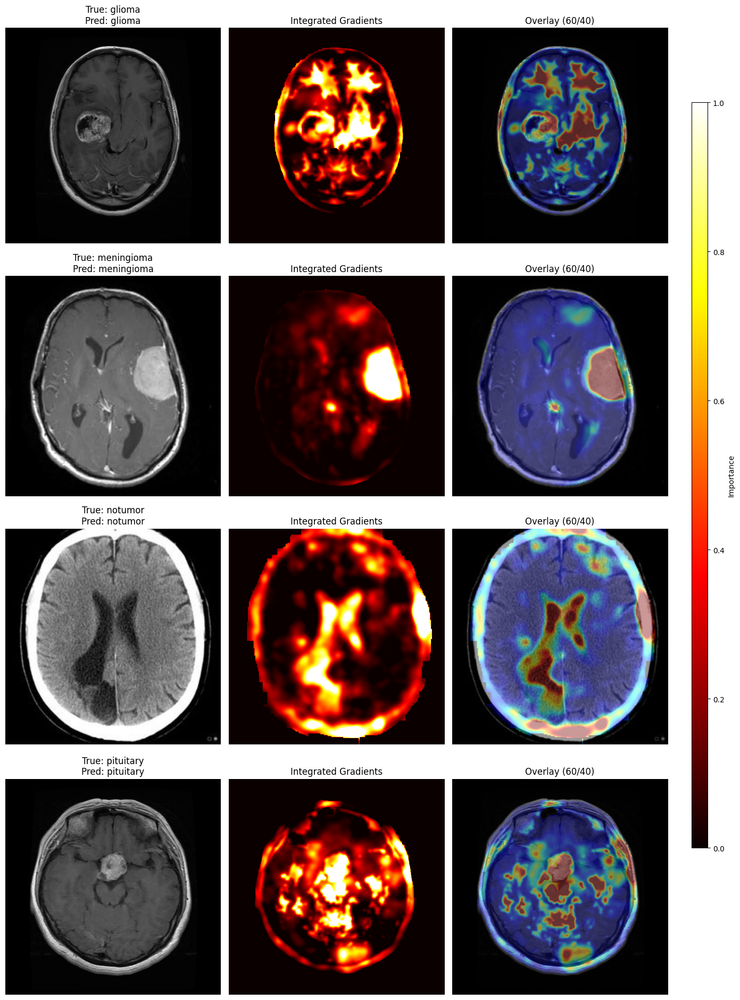

In [6]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image
from transformers import SwinForImageClassification
import torch.nn.functional as F
from scipy.ndimage import gaussian_filter
from tqdm import tqdm
import torch.nn as nn
from torchvision import transforms

# Thiết lập thiết bị
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Tạo thư mục lưu kết quả
save_dir = "/content/visualization_results"
os.makedirs(save_dir, exist_ok=True)

# Khởi tạo transform
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Load model
model_name = "microsoft/swin-base-patch4-window7-224"
model = SwinForImageClassification.from_pretrained(
    model_name,
    num_labels=4,
    ignore_mismatched_sizes=True
)
model.classifier = nn.Sequential(
    nn.Dropout(0.3),
    nn.Linear(model.config.hidden_size, model.config.num_labels)
)
model_path = "/kaggle/input/swin/pytorch/default/2/swin_model_best_acc.pth"
try:
    state_dict = torch.load(model_path, map_location=device, weights_only=True)
    model.load_state_dict(state_dict)
    print("✅ Mô hình đã được tải thành công!")
except Exception as e:
    print(f"❌ Lỗi khi tải mô hình: {e}")
    exit(1)
model.to(device)
model.eval()

def segment_brain_region(image):
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray = image

    _, thresh = cv2.threshold(gray, 10, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(thresh.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if contours:
        largest_contour = max(contours, key=cv2.contourArea)
        mask = np.zeros_like(gray)
        cv2.drawContours(mask, [largest_contour], -1, 255, -1)
        x, y, w, h = cv2.boundingRect(largest_contour)
        padding = 20  # Đảm bảo bao quát toàn bộ vùng đầu
        x = max(0, x - padding)
        y = max(0, y - padding)
        w = min(gray.shape[1] - x, w + 2*padding)
        h = min(gray.shape[0] - y, h + 2*padding)
        if len(image.shape) == 3:
            return image[y:y+h, x:x+w], (x, y, w, h)
        return gray[y:y+h, x:x+w], (x, y, w, h)
    return image, (0, 0, image.shape[1], image.shape[0])

def create_brain_mask(brain_region, target_size):
    if len(brain_region.shape) == 3:
        gray = cv2.cvtColor(brain_region, cv2.COLOR_RGB2GRAY)
    else:
        gray = brain_region.copy()

    _, mask = cv2.threshold(gray, 10, 1, cv2.THRESH_BINARY)
    kernel = np.ones((5, 5), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
    mask = cv2.erode(mask, kernel, iterations=2)
    mask = cv2.resize(mask, target_size, interpolation=cv2.INTER_NEAREST)
    return mask

def create_distance_penalty(shape, power=0.5, pituitary_focus=False):
    h, w = shape
    y, x = np.ogrid[:h, :w]
    if pituitary_focus:
        center_y, center_x = int(h * 0.5), w // 2
    else:
        center_y, center_x = h // 2, w // 2
    distance_from_center = np.sqrt((x - center_x)**2 + (y - center_y)**2)
    max_distance = np.sqrt((center_x)**2 + (center_y)**2)
    distance_penalty = 1 - (distance_from_center / max_distance)**power
    return distance_penalty

def create_pituitary_mask(shape):
    h, w = shape
    mask = np.zeros((h, w), dtype=np.float32)
    y, x = np.ogrid[:h, :w]
    center_y, center_x = h // 2, w // 2
    sigma_y, sigma_x = h / 4, w / 4
    mask = np.exp(-((x - center_x)**2 / (2 * sigma_x**2) + (y - center_y)**2 / (2 * sigma_y**2)))
    mask = gaussian_filter(mask, sigma=5.0)
    mask = (mask - mask.min()) / (mask.max() - mask.min() + 1e-8)
    return mask

def enhance_bright_regions(image, threshold_percentile=85, sigma=3.0):
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray = image

    gray = gray.astype(np.float32) / 255.0
    threshold = np.percentile(gray, threshold_percentile)
    bright_mask = (gray > threshold).astype(np.float32)
    bright_mask = gaussian_filter(bright_mask, sigma=sigma)
    bright_mask = (bright_mask - bright_mask.min()) / (bright_mask.max() - bright_mask.min() + 1e-8)
    return bright_mask

def preprocess_image(image, transform):
    try:
        input_tensor = transform(image).unsqueeze(0).to(device)
        return input_tensor
    except Exception as e:
        print(f"Error preprocessing image: {str(e)}")
        return None

def integrated_gradients_visualization(image_path, model, transform, steps=300, sigma=3.0, only_brain=True):
    class_labels = ["glioma", "meningioma", "notumor", "pituitary"]

    original_image = Image.open(image_path).convert("RGB")
    original_np = np.array(original_image)

    if only_brain:
        brain_region, bbox = segment_brain_region(original_np)
        brain_image = Image.fromarray(brain_region)
    else:
        brain_image = original_image
        brain_region = original_np

    # Sử dụng kích thước gốc của ảnh
    target_size = original_np.shape[:2][::-1]  # (width, height)

    img_tensor = preprocess_image(brain_image, transform)
    if img_tensor is None:
        print(f"Failed to preprocess image {image_path}")
        return None, None, None, None

    img_tensor = img_tensor.requires_grad_(True)

    with torch.no_grad():
        outputs = model(img_tensor)
        logits = outputs.logits
        probs = F.softmax(logits, dim=-1)
        pred_class = torch.argmax(probs, dim=-1).item()

    baseline = torch.zeros_like(img_tensor)
    integrated_grads = torch.zeros_like(img_tensor)
    for alpha in tqdm(np.linspace(0, 1, steps), desc=f"Tính toán Integrated Gradients ({os.path.basename(image_path)})"):
        interpolated_img = baseline + alpha * (img_tensor - baseline)
        interpolated_img.requires_grad_(True)
        outputs = model(interpolated_img)
        grads = torch.autograd.grad(outputs.logits[0, pred_class], interpolated_img)[0]
        integrated_grads += grads / steps

    attribution = (img_tensor - baseline) * integrated_grads
    attribution = attribution.sum(dim=1).detach().cpu().numpy().squeeze()
    attribution = gaussian_filter(np.abs(attribution), sigma=sigma)

    # Resize attribution về kích thước gốc
    attribution = cv2.resize(attribution, target_size, interpolation=cv2.INTER_CUBIC)

    # Tạo brain_mask từ ảnh gốc với kích thước gốc
    brain_mask = create_brain_mask(original_np, target_size)
    attribution = attribution * brain_mask

    pituitary_focus = (class_labels[pred_class] == "pituitary")
    distance_penalty = create_distance_penalty((target_size[1], target_size[0]), power=0.7, pituitary_focus=pituitary_focus)
    attribution = attribution * distance_penalty

    if class_labels[pred_class] in ["pituitary", "meningioma", "glioma"]:
        bright_mask = enhance_bright_regions(original_np, threshold_percentile=85, sigma=3.0)
        bright_mask = cv2.resize(bright_mask, target_size, interpolation=cv2.INTER_NEAREST)
        attribution = attribution * (1 + 3.0 * bright_mask)

    if class_labels[pred_class] == "pituitary":
        pituitary_mask = create_pituitary_mask((target_size[1], target_size[0]))
        attribution = attribution * (1 + 2.0 * pituitary_mask)

    vmin, vmax = np.percentile(attribution[attribution > 0], [15, 95])
    attribution_norm = np.clip((attribution - vmin) / (vmax - vmin + 1e-8), 0, 1)
    attribution_norm = attribution_norm * brain_mask

    heatmap = cv2.applyColorMap(np.uint8(255 * attribution_norm), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB) / 255.0

    # Sử dụng ảnh gốc để tạo overlay với kích thước gốc
    brain_np = original_np / 255.0
    overlay = 0.6 * brain_np + 0.4 * heatmap * np.expand_dims(brain_mask, axis=2)
    overlay = np.clip(overlay, 0, 1)

    return original_np, attribution_norm, overlay, class_labels[pred_class]

def integrated_gradients_visualization_batch(image_paths, model, transform, steps=300, sigma=3.0, save_dir=None):
    if save_dir is not None:
        os.makedirs(save_dir, exist_ok=True)

    # Tạo bố cục 4x3
    fig, axes = plt.subplots(4, 3, figsize=(15, 20))

    for idx, image_path in enumerate(image_paths):
        if not os.path.exists(image_path):
            print(f"Warning: Image not found at {image_path}")
            for col in range(3):
                axes[idx, col].axis("off")
            continue

        original_np, attribution_norm, overlay, pred_class = integrated_gradients_visualization(
            image_path, model, transform, steps=steps, sigma=sigma, only_brain=True
        )

        if original_np is None:
            print(f"Skipping visualization for {image_path} due to preprocessing error")
            for col in range(3):
                axes[idx, col].axis("off")
            continue

        label = os.path.basename(image_path).split('-')[1]
        if label.startswith("gl"):
            label = "glioma"
        elif label.startswith("me"):
            label = "meningioma"
        elif label.startswith("no"):
            label = "notumor"
        elif label.startswith("pi"):
            label = "pituitary"
        else:
            label = "unknown"

        # Brain Region
        axes[idx, 0].imshow(original_np)
        axes[idx, 0].set_title(f"True: {label}\nPred: {pred_class}")
        axes[idx, 0].axis("off")

        # Integrated Gradients
        im = axes[idx, 1].imshow(attribution_norm, cmap="hot")
        axes[idx, 1].set_title("Integrated Gradients")
        axes[idx, 1].axis("off")

        # Overlay
        axes[idx, 2].imshow(overlay)
        axes[idx, 2].set_title("Overlay (60/40)")
        axes[idx, 2].axis("off")

    # Thêm colorbar chung cho tất cả heatmap
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.87, 0.15, 0.02, 0.7])
    plt.colorbar(im, cax=cbar_ax, label="Importance")

    # # Tiêu đề cột
    # column_titles = ["Brain Region", "Integrated Gradients", "Overlay (60/40)"]
    # for col, title in enumerate(column_titles):
    #     fig.text(0.15 + col * 0.28, 0.98, title, ha='center', va='center', fontsize=14, fontweight='bold')

    plt.tight_layout(rect=[0, 0, 0.85, 0.95])
    if save_dir:
        save_path = os.path.join(save_dir, "integrated_gradients_batch_4x3_swin.png")
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()

if __name__ == "__main__":
    image_paths = [
        "/kaggle/input/brain-tumor-mri-dataset/Testing/glioma/Te-gl_0028.jpg",
        "/kaggle/input/brain-tumor-mri-dataset/Testing/meningioma/Te-me_0114.jpg",
        "/kaggle/input/brain-tumor-mri-dataset/Testing/notumor/Te-noTr_0009.jpg",
        "/kaggle/input/brain-tumor-mri-dataset/Testing/pituitary/Te-pi_0041.jpg"
    ]
    integrated_gradients_visualization_batch(image_paths, model, transform, save_dir=save_dir)

In [1]:
!pip install lime

Using device: cuda


Some weights of SwinForImageClassification were not initialized from the model checkpoint at microsoft/swin-base-patch4-window7-224 and are newly initialized because the shapes did not match:
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([4]) in the model instantiated
- classifier.weight: found shape torch.Size([1000, 1024]) in the checkpoint and torch.Size([4, 1024]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


LIME model loaded successfully with partial weights.


Some weights of SwinForImageClassification were not initialized from the model checkpoint at microsoft/swin-base-patch4-window7-224 and are newly initialized because the shapes did not match:
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([4]) in the model instantiated
- classifier.weight: found shape torch.Size([1000, 1024]) in the checkpoint and torch.Size([4, 1024]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Classification model loaded successfully!
Creating 4x4 LIME and Classification grid...

Processing image: /kaggle/input/brain-tumor-mri-dataset/Testing/glioma/Te-gl_0025.jpg
Image loaded successfully: (512, 512, 3)
Segmentation done: 100 segments
Running LIME explanation...


  0%|          | 0/1500 [00:00<?, ?it/s]

LIME explanation completed!

Processing image: /kaggle/input/brain-tumor-mri-dataset/Testing/meningioma/Te-me_0030.jpg
Image loaded successfully: (303, 252, 3)
Segmentation done: 106 segments
Running LIME explanation...


  0%|          | 0/1500 [00:00<?, ?it/s]

LIME explanation completed!

Processing image: /kaggle/input/brain-tumor-mri-dataset/Testing/notumor/Te-no_0016.jpg
Image loaded successfully: (218, 236, 3)
Segmentation done: 95 segments
Running LIME explanation...


  0%|          | 0/1500 [00:00<?, ?it/s]

LIME explanation completed!

Processing image: /kaggle/input/brain-tumor-mri-dataset/Testing/pituitary/Te-piTr_0008.jpg
Image loaded successfully: (512, 512, 3)
Segmentation done: 108 segments
Running LIME explanation...


  0%|          | 0/1500 [00:00<?, ?it/s]

LIME explanation completed!

Grid saved to /kaggle/working/results/lime_4x4_grid.png


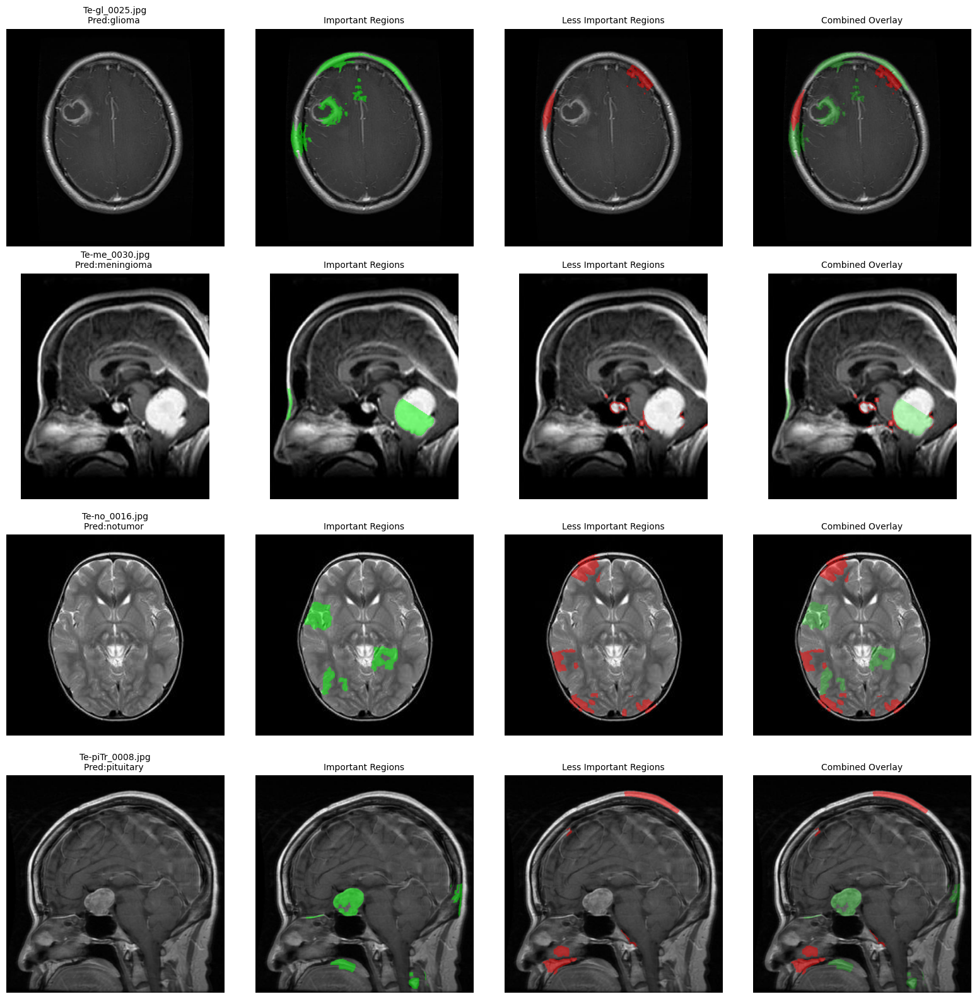

In [32]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from lime import lime_image
from skimage.segmentation import slic
import cv2
from transformers import AutoImageProcessor, SwinForImageClassification
from torchvision import transforms
import os
import torch.nn as nn
import torch.nn.functional as F
import IPython.display as display

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

save_dir = "/kaggle/working/results"
os.makedirs(save_dir, exist_ok=True)

transform_classify = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

feature_extractor = AutoImageProcessor.from_pretrained("microsoft/swin-base-patch4-window7-224")

class_labels = ["glioma", "meningioma", "notumor", "pituitary"]

def initialize_swin_model_lime():
    model = SwinForImageClassification.from_pretrained(
        "microsoft/swin-base-patch4-window7-224",
        num_labels=4,
        output_hidden_states=True,
        ignore_mismatched_sizes=True
    )
    model_path = "/kaggle/input/swin/pytorch/default/2/swin_model_best.pth"
    if not os.path.exists(model_path):
        print(f"Warning: LIME model file not found at {model_path}")
        return model
    try:
        custom_weights = torch.load(model_path, map_location=device, weights_only=True)
        new_state_dict = {}
        model_state_dict = model.state_dict()
        for key in model_state_dict.keys():
            if key in custom_weights and model_state_dict[key].shape == custom_weights[key].shape:
                new_state_dict[key] = custom_weights[key]
        model.load_state_dict(new_state_dict, strict=False)
        print("LIME model loaded successfully with partial weights.")
    except Exception as e:
        print(f"Error loading LIME model: {e}")
    return model

def initialize_swin_model_classify():
    model = SwinForImageClassification.from_pretrained(
        "microsoft/swin-base-patch4-window7-224",
        num_labels=4,
        ignore_mismatched_sizes=True
    )
    model.classifier = nn.Sequential(
        nn.Dropout(0.3),
        nn.Linear(model.config.hidden_size, model.config.num_labels)
    )
    model_path = "/kaggle/input/swin/pytorch/default/2/swin_model_best_acc.pth"
    try:
        state_dict = torch.load(model_path, map_location=device, weights_only=True)
        model.load_state_dict(state_dict)
        print("Classification model loaded successfully!")
    except Exception as e:
        print(f"Error loading classification model: {e}")
        return None
    return model

model_lime = initialize_swin_model_lime()
model_lime.to(device).eval()
model_classify = initialize_swin_model_classify()
if model_classify is None:
    print("Failed to load classification model. Exiting.")
    exit(1)
model_classify.to(device).eval()

def preprocess_image_classify(image_path):
    if not os.path.exists(image_path):
        print(f"Error: File {image_path} does not exist")
        return None, None
    try:
        image = Image.open(image_path).convert("RGB")
        input_tensor = transform_classify(image).unsqueeze(0).to(device)
        return image, input_tensor
    except Exception as e:
        print(f"Error loading image {image_path}: {str(e)}")
        return None, None

def predict_single_image(image_path):
    image, input_tensor = preprocess_image_classify(image_path)
    if image is None or input_tensor is None:
        return None, 0, None
    try:
        with torch.no_grad():
            outputs = model_classify(input_tensor)
            logits = outputs.logits
            probs = F.softmax(logits, dim=-1)
            predicted_class = torch.argmax(probs, dim=-1).item()
            confidence = probs[0][predicted_class].item() * 100
        predicted_label = class_labels[predicted_class]
        result_path = os.path.join(save_dir, f"{os.path.basename(image_path).split('.')[0]}_classify_result.jpg")
        plt.figure(figsize=(10, 5))
        image_cv2 = cv2.cvtColor(np.array(image), cv2.COLOR_RGB2BGR)
        plt.subplot(1, 2, 1)
        plt.imshow(image_cv2)
        plt.title('Original Image')
        plt.axis('off')
        plt.subplot(1, 2, 2)
        class_probs = probs[0].cpu().numpy() * 100
        colors = ['lightcoral' if i != predicted_class else 'lightgreen' for i in range(len(class_labels))]
        plt.bar(class_labels, class_probs, color=colors)
        plt.title(f'Class Probabilities\nPredicted: {predicted_label}')
        plt.xticks(rotation=45)
        plt.ylabel('Confidence (%)')
        plt.tight_layout()
        plt.savefig(result_path)
        plt.close()
        return predicted_label, confidence, image
    except Exception as e:
        print(f"Error processing image {image_path}: {str(e)}")
        return None, 0, None

def batch_predict(images):
    model_lime.eval()
    probs = np.zeros((len(images), len(class_labels)))
    for i, img in enumerate(images):
        img_pil = Image.fromarray(np.uint8(img))
        inputs = feature_extractor(images=img_pil, return_tensors="pt").to(device)
        with torch.no_grad():
            outputs = model_lime(pixel_values=inputs['pixel_values'])
            probs[i] = F.softmax(outputs.logits, dim=1).cpu().numpy()
    return probs

def segment_image(image, n_segments=80, compactness=30):
    if len(image.shape) == 3 and image.shape[2] == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray = image.copy()
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    enhanced = clahe.apply(gray.astype(np.uint8))
    enhanced = cv2.GaussianBlur(enhanced, (3, 3), 0)
    segments = slic(image, n_segments=n_segments, compactness=compactness, sigma=1.0, start_label=1,
                    enforce_connectivity=True, min_size_factor=0.02)
    return segments

def explain_with_lime_for_swin(image_path, pred_class, num_samples=1500):
    if not os.path.exists(image_path):
        print(f"Error: Image file not found at {image_path}")
        return None, None, None
    try:
        img = Image.open(image_path).convert("RGB")
        img_np = np.array(img)
        segments = segment_image(img_np, n_segments=80, compactness=30)
        explainer = lime_image.LimeImageExplainer()
        top_label = class_labels.index(pred_class)
        explanation = explainer.explain_instance(
            img_np,
            batch_predict,
            segmentation_fn=lambda x: segments,
            top_labels=None,
            labels=(top_label,),
            hide_color=0,
            num_samples=num_samples
        )
        segment_importance = explanation.local_exp[top_label]
        importance_map = np.zeros(segments.shape)
        for segment_id, weight in segment_importance:
            importance_map[segments == segment_id] = weight

        important_regions = np.copy(img_np)
        positive_map = importance_map.copy()
        positive_map[positive_map <= 0] = 0
        positive_mask = (positive_map > 0).astype(np.uint8) * 255
        for c in range(3):
            important_regions[:, :, c] = np.where(
                positive_mask > 0,
                (0.5 * [255, 0, 0][c] + 0.5 * img_np[:, :, c]).astype(np.uint8),
                img_np[:, :, c]
            )

        less_important_regions = np.copy(img_np)
        negative_map = importance_map.copy()
        negative_map[negative_map >= 0] = 0
        negative_mask = (np.abs(negative_map) > 0).astype(np.uint8) * 255
        for c in range(3):
            less_important_regions[:, :, c] = np.where(
                negative_mask > 0,
                (0.5 * [0, 255, 0][c] + 0.5 * img_np[:, :, c]).astype(np.uint8),
                img_np[:, :, c]
            )

        bright_mask = np.ones(img_np.shape[:2], dtype=np.uint8) * 255
        try:
            if pred_class == "meningioma":
                gray = cv2.cvtColor(img_np, cv2.COLOR_RGB2GRAY)
                _, bright_mask = cv2.threshold(gray, 171, 255, cv2.THRESH_BINARY)
                kernel = np.ones((5,5), np.uint8)
                bright_mask = cv2.dilate(bright_mask, kernel, iterations=1)
            elif pred_class == "glioma":
                gray = cv2.cvtColor(img_np, cv2.COLOR_RGB2GRAY)
                clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
                enhanced = clahe.apply(gray.astype(np.uint8))
                _, bright_mask = cv2.threshold(enhanced, 110, 255, cv2.THRESH_BINARY)
                sobelx = cv2.Sobel(enhanced, cv2.CV_64F, 1, 0, ksize=3)
                sobely = cv2.Sobel(enhanced, cv2.CV_64F, 0, 1, ksize=3)
                sobel = np.hypot(sobelx, sobely)
                sobel_mask = (sobel > np.percentile(sobel, 90)).astype(np.uint8) * 255
                bright_mask = cv2.bitwise_or(bright_mask, sobel_mask)
                kernel = np.ones((3,3), np.uint8)
                bright_mask = cv2.dilate(bright_mask, kernel, iterations=1)
            elif pred_class == "notumor":
                gray = cv2.cvtColor(img_np, cv2.COLOR_RGB2GRAY)
                gray = cv2.GaussianBlur(gray, (5,5), 0)
                _, bright_mask = cv2.threshold(gray, 110, 255, cv2.THRESH_BINARY)
                kernel = np.ones((3,3), np.uint8)
                bright_mask = cv2.dilate(bright_mask, kernel, iterations=1)
            elif pred_class == "pituitary":
                gray = cv2.cvtColor(img_np, cv2.COLOR_RGB2GRAY)
                clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
                enhanced = clahe.apply(gray.astype(np.uint8))
                _, bright_mask = cv2.threshold(enhanced, 170, 255, cv2.THRESH_BINARY)
                kernel = np.ones((5,5), np.uint8)
                bright_mask = cv2.morphologyEx(bright_mask, cv2.MORPH_CLOSE, kernel)
                bright_mask = cv2.dilate(bright_mask, kernel, iterations=2)
        except Exception as e:
            print(f"Error creating bright_mask for {pred_class}: {e}")
            bright_mask = np.ones(img_np.shape[:2], dtype=np.uint8) * 255

        important_regions = cv2.bitwise_and(important_regions, important_regions, mask=bright_mask)
        less_important_regions = cv2.bitwise_and(less_important_regions, less_important_regions, mask=bright_mask)
        return img_np, important_regions, less_important_regions
    except Exception as e:
        print(f"Error during LIME explanation for {image_path}: {e}")
        return None, None, None

def create_4x4_grid(image_paths):
    fig, axes = plt.subplots(4, 4, figsize=(16, 16))
    plt.tight_layout(pad=1.0, w_pad=0.5, h_pad=0.5)
    for row, image_path in enumerate(image_paths):
        pred_label, pred_confidence, image = predict_single_image(image_path)
        if pred_label is None:
            for col in range(4):
                axes[row, col].axis("off")
                axes[row, col].text(0.5, 0.5, "Error", ha="center", va="center", fontsize=12)
            continue
        img_np, important_regions, less_important_regions = explain_with_lime_for_swin(
            image_path, pred_class=pred_label, num_samples=1500
        )
        if img_np is None:
            for col in range(4):
                axes[row, col].axis("off")
                axes[row, col].text(0.5, 0.5, "Error", ha="center", va="center", fontsize=12)
            continue

        axes[row, 0].imshow(img_np)
        axes[row, 0].set_title(f"{os.path.basename(image_path)}\nPred:{pred_label} ", fontsize=10)
        axes[row, 0].axis("off")

        important_display = np.copy(img_np)
        less_important_mask = (less_important_regions.sum(axis=2) > 0).astype(np.uint8) * 255
        alpha = 0.5
        for c in range(3):
            important_display[:, :, c] = np.where(
                less_important_mask > 0,
                (alpha * less_important_regions[:, :, c] + (1 - alpha) * img_np[:, :, c]).astype(np.uint8),
                img_np[:, :, c]
            )
        axes[row, 1].imshow(important_display)
        axes[row, 1].set_title("Important Regions", fontsize=10)
        axes[row, 1].axis("off")

        less_important_display = np.copy(img_np)
        important_mask = (important_regions.sum(axis=2) > 0).astype(np.uint8) * 255
        for c in range(3):
            less_important_display[:, :, c] = np.where(
                important_mask > 0,
                (alpha * important_regions[:, :, c] + (1 - alpha) * img_np[:, :, c]).astype(np.uint8),
                img_np[:, :, c]
            )
        axes[row, 2].imshow(less_important_display)
        axes[row, 2].set_title("Less Important Regions", fontsize=10)
        axes[row, 2].axis("off")

        combined_image = np.copy(img_np)
        for c in range(3):
            combined_image[:, :, c] = np.where(
                less_important_mask > 0,
                (alpha * less_important_regions[:, :, c] + (1 - alpha) * combined_image[:, :, c]).astype(np.uint8),
                combined_image[:, :, c]
            )
            combined_image[:, :, c] = np.where(
                important_mask > 0,
                (alpha * important_regions[:, :, c] + (1 - alpha) * combined_image[:, :, c]).astype(np.uint8),
                combined_image[:, :, c]
            )
        axes[row, 3].imshow(combined_image)
        axes[row, 3].set_title("Combined Overlay", fontsize=10)
        axes[row, 3].axis("off")

    result_path = os.path.join(save_dir, "lime_4x4_grid.png")
    plt.savefig(result_path, bbox_inches="tight")
    plt.close()
    print(f"\nGrid saved to {result_path}")
    display.display(display.Image(result_path))

if __name__ == "__main__":
    print("Creating 4x4 LIME and Classification grid...")
    image_paths = [
        "/kaggle/input/brain-tumor-mri-dataset/Testing/glioma/Te-gl_0025.jpg",
        "/kaggle/input/brain-tumor-mri-dataset/Testing/meningioma/Te-me_0030.jpg",
        "/kaggle/input/brain-tumor-mri-dataset/Testing/notumor/Te-no_0016.jpg",
        "/kaggle/input/brain-tumor-mri-dataset/Testing/pituitary/Te-piTr_0008.jpg"
    ]
    for path in image_paths:
        if not os.path.exists(path):
            print(f"Warning: Image not found at {path}")
    create_4x4_grid(image_paths)

Using device: cuda


Some weights of SwinForImageClassification were not initialized from the model checkpoint at microsoft/swin-base-patch4-window7-224 and are newly initialized because the shapes did not match:
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([4]) in the model instantiated
- classifier.weight: found shape torch.Size([1000, 1024]) in the checkpoint and torch.Size([4, 1024]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


✅ Đã tải trọng số mô hình từ /kaggle/input/swin/pytorch/default/2/swin_model_best_acc.pth

Processing image: /kaggle/input/brain-tumor-mri-dataset/Testing/glioma/Te-gl_0154.jpg
✅ Đã tải trọng số mô hình từ /kaggle/input/swin/pytorch/default/2/swin_model_best_acc.pth


  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [03:55, 235.99s/it]              


Shape giá trị SHAP: (1, 154, 154, 3, 4)
Đã điều chỉnh shape giá trị SHAP: (1, 154, 154, 4)
Tổng giá trị SHAP tích cực: 0.8095142255905832
Tổng giá trị SHAP tiêu cực: 0.5658393630100094

Processing image: /kaggle/input/brain-tumor-mri-dataset/Testing/meningioma/Te-me_0219.jpg
✅ Đã tải trọng số mô hình từ /kaggle/input/swin/pytorch/default/2/swin_model_best_acc.pth


  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [04:47, 287.39s/it]              


Shape giá trị SHAP: (1, 184, 184, 3, 4)
Đã điều chỉnh shape giá trị SHAP: (1, 184, 184, 4)
Tổng giá trị SHAP tích cực: 1.01193008022845
Tổng giá trị SHAP tiêu cực: 0.3815008101697004

Processing image: /kaggle/input/brain-tumor-mri-dataset/Testing/notumor/Te-no_0244.jpg
✅ Đã tải trọng số mô hình từ /kaggle/input/swin/pytorch/default/2/swin_model_best_acc.pth


  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [04:48, 288.64s/it]              


Shape giá trị SHAP: (1, 184, 184, 3, 4)
Đã điều chỉnh shape giá trị SHAP: (1, 184, 184, 4)
Tổng giá trị SHAP tích cực: 0.8562414036528219
Tổng giá trị SHAP tiêu cực: 0.19645904520881163

Processing image: /kaggle/input/brain-tumor-mri-dataset/Testing/pituitary/Te-pi_0027.jpg
✅ Đã tải trọng số mô hình từ /kaggle/input/swin/pytorch/default/2/swin_model_best_acc.pth


  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [04:15, 255.52s/it]              
This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


Shape giá trị SHAP: (1, 184, 184, 3, 4)
Đã điều chỉnh shape giá trị SHAP: (1, 184, 184, 4)
Tổng giá trị SHAP tích cực: 0.8650509519840284
Tổng giá trị SHAP tiêu cực: 0.3120000454682539
📊 Visualization saved at '/kaggle/working/shap_results/shap_four_classes_true_class_prediction_model_confidence.png'


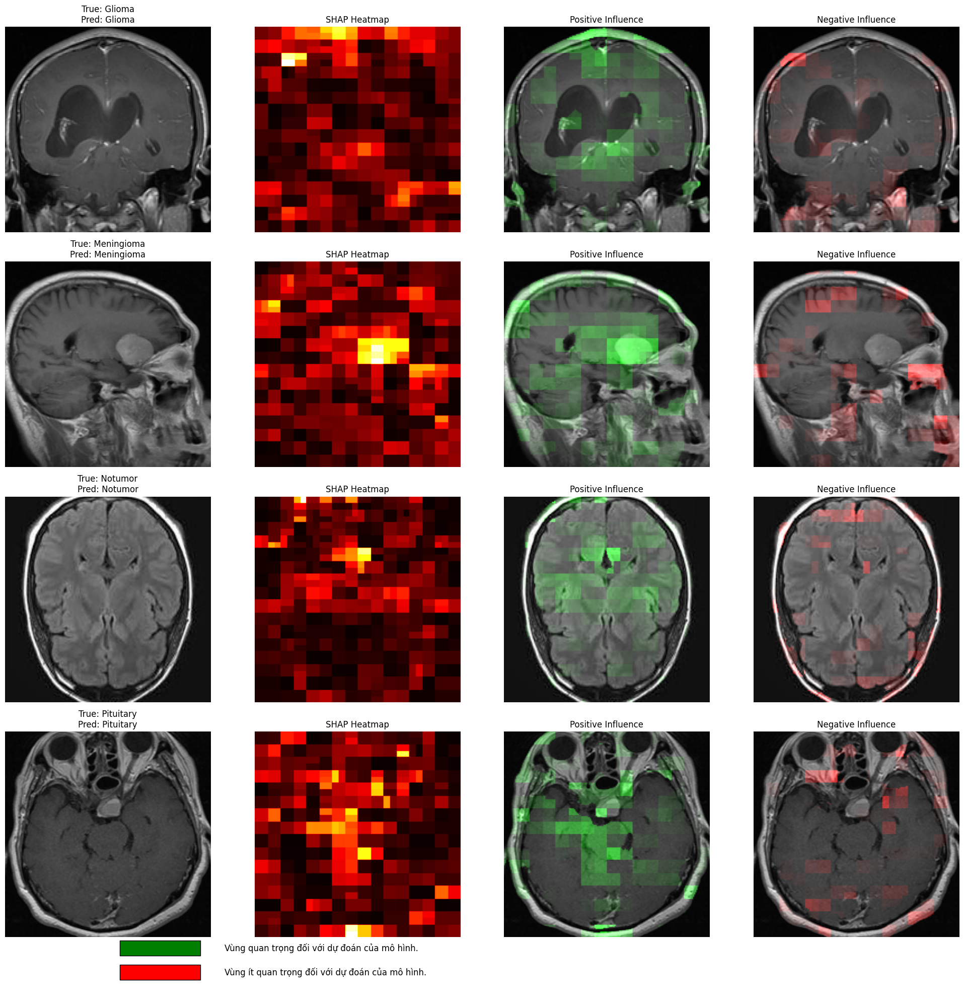

In [5]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import shap
import cv2
from transformers import SwinForImageClassification, AutoImageProcessor
from skimage.segmentation import slic
from skimage.color import label2rgb
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.patches as patches

# Định nghĩa nhãn lớp khối u não
class_labels = ["glioma", "meningioma", "notumor", "pituitary"]
num_classes = len(class_labels)

# Thiết lập thiết bị
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Tạo thư mục lưu kết quả
save_dir = "/kaggle/working/shap_results"
os.makedirs(save_dir, exist_ok=True)

# Helper functions
def initialize_model_and_params(save_dir=None, device=None, processor=None, model=None, model_path=None, model_name="microsoft/swin-base-patch4-window7-224"):
    if save_dir is not None:
        os.makedirs(save_dir, exist_ok=True)

    if device is None:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    if processor is None:
        processor = AutoImageProcessor.from_pretrained(model_name, use_fast=True)

    if model is None:
        model = SwinForImageClassification.from_pretrained(
            model_name,
            num_labels=num_classes,
            ignore_mismatched_sizes=True
        )
        # Redefine classifier as in DeiT
        model.classifier = nn.Sequential(
            nn.Dropout(0.3),
            nn.Linear(model.config.hidden_size, num_classes)
        )

    if model_path is not None and os.path.exists(model_path):
        try:
            state_dict = torch.load(model_path, map_location=device, weights_only=True)
            state_dict_no_module = {}
            for key, value in state_dict.items():
                new_key = key.replace('module.', '')
                if new_key == "classifier.weight":
                    state_dict_no_module["classifier.0.weight"] = value
                elif new_key == "classifier.bias":
                    state_dict_no_module["classifier.0.bias"] = value
                else:
                    state_dict_no_module[new_key] = value
            model.load_state_dict(state_dict_no_module, strict=True)
            print(f"✅ Đã tải trọng số mô hình từ {model_path}")
        except Exception as e:
            print(f"❌ Lỗi khi tải trọng số mô hình: {e}")
            raise

    model.to(device)
    model.eval()
    return save_dir, device, processor, model

def crop_image(img_array, margin=20):
    """Cắt bỏ rìa ảnh để loại bỏ vùng không liên quan."""
    height, width = img_array.shape[:2]
    return img_array[margin:height-margin, margin:width-margin]

def preprocess_image(img, processor, size=(224, 224), label=None):
    if isinstance(img, np.ndarray):
        img = Image.fromarray(np.uint8(img))
    elif isinstance(img, str):
        img = Image.open(img).convert("RGB")
    
    # Explicitly resize to 224x224 as in DeiT
    img = img.resize(size, Image.LANCZOS)
    
    # Convert to array for cropping
    img_array = np.array(img)
    
    # Crop image to remove borders, use margin=40 for glioma, else 20
    margin = 35 if label and label.lower() == "glioma" else 20
    img_array = crop_image(img_array, margin=margin)
    
    # Convert back to PIL Image
    img = Image.fromarray(img_array)
    
    return img, img_array

def segment_image(image, n_segments=200, compactness=20):
    if isinstance(image, str):
        image = np.array(Image.open(image).convert("RGB"))
    elif isinstance(image, Image.Image):
        image = np.array(image)

    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
    enhanced = clahe.apply(gray)

    segments = slic(
        image,
        n_segments=n_segments,
        compactness=compactness,
        sigma=1.0,
        start_label=1,
        enforce_connectivity=True,
        min_size_factor=0.01
    )
    
    return segments

class SwinWrapper:
    def __init__(self, model, processor, device, num_classes):
        self.model = model
        self.processor = processor
        self.device = device
        self.num_classes = num_classes
        self.model.eval()

    def __call__(self, images):
        if isinstance(images, np.ndarray) and len(images.shape) == 3:
            images = [images]

        batch_probs = []
        for img in images:
            img_pil = Image.fromarray(np.uint8(img)) if isinstance(img, np.ndarray) else img
            img_pil = img_pil.resize((224, 224), Image.LANCZOS)
            inputs = self.processor(images=img_pil, return_tensors="pt").to(self.device)

            with torch.no_grad():
                outputs = self.model(**inputs).logits
                probs = F.softmax(outputs, dim=1).cpu().numpy()[0]
                if probs.shape[0] != self.num_classes:
                    raise ValueError(f"Đầu ra mô hình có {probs.shape[0]} lớp, nhưng kỳ vọng {self.num_classes}")
                batch_probs.append(probs)

        return np.array(batch_probs)

def explain_with_shap(image_path, expected_label, n_segments=200, n_background=10, save_dir=None, device=None, processor=None, model=None, model_path=None):
    save_dir, device, processor, model = initialize_model_and_params(save_dir, device, processor, model, model_path)
    model.to(device).eval()

    # Preprocess image with label
    original_image, img_array = preprocess_image(image_path, processor, size=(224, 224), label=expected_label)

    # Segment image
    segments = segment_image(img_array, n_segments=n_segments)

    model_wrapper = SwinWrapper(model, processor, device, num_classes)

    # Get model probabilities
    predictions = model_wrapper(img_array)
    model_predicted_class = np.argmax(predictions[0])
    confidence = predictions[0][model_predicted_class] * 100

    # Use true class for SHAP visualization
    true_class_idx = class_labels.index(expected_label.lower())
    true_class_name = expected_label

    # Create background samples
    background = np.zeros((n_background, *img_array.shape), dtype=np.uint8)
    for i in range(n_background):
        background[i] = np.random.randint(0, 20, size=img_array.shape, dtype=np.uint8)

    # SHAP explanation
    masker = shap.maskers.Image("inpaint_telea", img_array.shape)
    explainer = shap.Explainer(model_wrapper, masker, output_names=class_labels, background=background)
    shap_values = explainer(np.array([img_array]), max_evals=5000, batch_size=32)

    print(f"Shape giá trị SHAP: {shap_values.values.shape}")

    if len(shap_values.values.shape) == 5:
        num_classes_detected = shap_values.values.shape[3]
        if num_classes_detected != num_classes:
            shap_values.values = np.sum(shap_values.values, axis=3)
            print(f"Đã điều chỉnh shape giá trị SHAP: {shap_values.values.shape}")
            if shap_values.values.shape[3] != num_classes:
                raise ValueError(f"Giá trị SHAP đã điều chỉnh có {shap_values.values.shape[3]} lớp, nhưng kỳ vọng {num_classes}")

    if shap_values.values.shape[3] != num_classes:
        raise ValueError(f"Giá trị SHAP có {shap_values.values.shape[3]} lớp, nhưng kỳ vọng {num_classes}")

    # Use true class for SHAP
    shap_values_class = shap_values.values[0, :, :, true_class_idx]
    
    # Filter SHAP values
    shap_pos = np.maximum(shap_values_class, 0)
    shap_neg = np.maximum(-shap_values_class, 0)

    # Apply brain mask
    brain_mask = np.zeros_like(segments, dtype=np.float32)
    for seg_id in np.unique(segments):
        mask = segments == seg_id
        if np.mean(img_array[mask]) > 50:
            brain_mask[mask] = 1

    if brain_mask.shape != shap_values_class.shape:
        brain_mask = cv2.resize(brain_mask, (shap_values_class.shape[1], shap_values_class.shape[0]), interpolation=cv2.INTER_NEAREST)

    shap_pos = shap_pos * brain_mask
    shap_neg = shap_neg * brain_mask

    threshold = 0.01
    shap_pos_norm = np.zeros_like(shap_pos)
    shap_neg_norm = np.zeros_like(shap_neg)

    pos_max = shap_pos.max()
    if pos_max > 0:
        shap_pos_norm = shap_pos / pos_max
        shap_pos_norm[shap_pos_norm < threshold] = 0

    neg_max = shap_neg.max()
    if neg_max > 0:
        shap_neg_norm = shap_neg / neg_max
        shap_neg_norm[shap_neg_norm < threshold] = 0

    print("Tổng giá trị SHAP tích cực:", shap_pos.sum())
    print("Tổng giá trị SHAP tiêu cực:", shap_neg.sum())

    shap_heatmap = np.abs(shap_values_class)
    shap_abs = shap_heatmap.copy()
    shap_min, shap_max = shap_abs.min(), shap_abs.max()
    if shap_max > shap_min:
        shap_abs = (shap_abs - shap_min) / (shap_max - shap_min)

    def create_colored_overlay(img, heatmap, color, alpha=0.7):
        heatmap_rgb = np.zeros((*heatmap.shape, 3), dtype=np.float32)
        for i in range(3):
            heatmap_rgb[:, :, i] = heatmap * color[i]
        heatmap_rgb = (heatmap_rgb * 255).astype(np.uint8)
        overlay = cv2.addWeighted(img.copy(), 1, heatmap_rgb, alpha, 0)
        return overlay

    pos_overlay = create_colored_overlay(img_array, shap_pos_norm, (0, 1, 0))
    neg_overlay = create_colored_overlay(img_array, shap_neg_norm, (1, 0, 0))

    segment_map = np.zeros_like(segments, dtype=np.float32)
    for seg_id in np.unique(segments):
        mask = segments == seg_id
        segment_map[mask] = np.mean(shap_abs[mask])

    segment_overlay = label2rgb(segments, img_array, alpha=0.5, bg_label=0)

    if save_dir:
        plt.imsave(os.path.join(save_dir, "shap_heatmap.png"), shap_abs, cmap='hot')
        plt.imsave(os.path.join(save_dir, "positive_influence.png"), pos_overlay)
        plt.imsave(os.path.join(save_dir, "negative_influence.png"), neg_overlay)
        plt.imsave(os.path.join(save_dir, "segment_overlay.png"), segment_overlay)

    results = {
        'original_image': img_array,
        'prediction': true_class_name,
        'confidence': confidence,
        'shap_heatmap': shap_abs,
        'positive_influence': pos_overlay,
        'negative_influence': neg_overlay,
        'segment_overlay': segment_overlay,
        'segments': segments,
        'true_class': true_class_name
    }

    return results

def analyze_multiple_brain_mri(image_paths, n_segments=200, save_dir=None, model_path=None):
    save_dir, device, processor, model = initialize_model_and_params(save_dir=save_dir, model_path=model_path)
    model.to(device).eval()

    results = []
    fig, axes = plt.subplots(4, 4, figsize=(20, 20))

    for idx, (image_path, expected_label) in enumerate(image_paths, 1):
        print(f"\nProcessing image: {image_path}")
        if not os.path.exists(image_path):
            print(f"Warning: Image not found at {image_path}")
            continue

        try:
            result = explain_with_shap(
                image_path=image_path,
                expected_label=expected_label,
                n_segments=n_segments,
                save_dir=save_dir,
                device=device,
                processor=processor,
                model=model,
                model_path=model_path
            )

            original_image = result['original_image'].copy()
            shap_heatmap = result['shap_heatmap'].copy()
            positive_influence = result['positive_influence'].copy()
            negative_influence = result['negative_influence'].copy()
            prediction = result['prediction']
            confidence = result['confidence']
            true_class = result['true_class']

            axes[idx-1, 0].imshow(original_image)
            axes[idx-1, 0].set_title(f"True: {true_class}\nPred: {prediction}")
            axes[idx-1, 0].axis('off')

            axes[idx-1, 1].imshow(shap_heatmap, cmap='hot')
            axes[idx-1, 1].set_title(f"SHAP Heatmap")
            axes[idx-1, 1].axis('off')

            axes[idx-1, 2].imshow(positive_influence)
            axes[idx-1, 2].set_title(f"Positive Influence")
            axes[idx-1, 2].axis('off')

            axes[idx-1, 3].imshow(negative_influence)
            axes[idx-1, 3].set_title(f"Negative Influence")
            axes[idx-1, 3].axis('off')

            results.append({
                "image_path": image_path,
                "expected_label": expected_label,
                "prediction": prediction,
                "confidence": confidence,
                "original_image": original_image,
                "shap_heatmap": shap_heatmap,
                "positive_influence": positive_influence,
                "negative_influence": negative_influence,
                "segments": result['segments'],
                "true_class": true_class
            })

        except Exception as e:
            print(f"Error processing {image_path}: {str(e)}")
            continue

    # Add note with colored rectangles
    note_ax = fig.add_axes([0.1, 0.01, 0.8, 0.06])
    note_ax.axis("off")
    green_rect = patches.Rectangle((0.05, 0.65), 0.1, 0.25, linewidth=1, edgecolor='black', facecolor='green', transform=note_ax.transAxes)
    note_ax.add_patch(green_rect)
    note_ax.text(0.18, 0.775, "Vùng quan trọng đối với dự đoán của mô hình.", 
                 verticalalignment='center', fontsize=12, transform=note_ax.transAxes)
    red_rect = patches.Rectangle((0.05, 0.25), 0.1, 0.25, linewidth=1, edgecolor='black', facecolor='red', transform=note_ax.transAxes)
    note_ax.add_patch(red_rect)
    note_ax.text(0.18, 0.375, "Vùng ít quan trọng đối với dự đoán của mô hình.", 
                 verticalalignment='center', fontsize=12, transform=note_ax.transAxes)

    plt.tight_layout(rect=[0, 0.06, 1, 1])
    if save_dir:
        save_path = os.path.join(save_dir, "shap_four_classes_true_class_prediction_model_confidence.png")
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"📊 Visualization saved at '{save_path}'")
        plt.show()
    else:
        plt.show()

    plt.close(fig)
    return results

# Chạy phân tích
if __name__ == "__main__":
    save_dir = "/kaggle/working/shap_results"
    model_path = "/kaggle/input/swin/pytorch/default/2/swin_model_best_acc.pth"
    image_paths = [
        ("/kaggle/input/brain-tumor-mri-dataset/Testing/glioma/Te-gl_0154.jpg", "Glioma"),
        ("/kaggle/input/brain-tumor-mri-dataset/Testing/meningioma/Te-me_0219.jpg", "Meningioma"),
        ("/kaggle/input/brain-tumor-mri-dataset/Testing/notumor/Te-no_0244.jpg", "Notumor"),
        ("/kaggle/input/brain-tumor-mri-dataset/Testing/pituitary/Te-pi_0027.jpg", "Pituitary"),
    ]
    results = analyze_multiple_brain_mri(
        image_paths=image_paths,
        n_segments=200,
        save_dir=save_dir,-
        model_path=model_path
    )

In [2]:
!pip install scikit-fuzzy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 920.8/920.8 kB 5.1 MB/s eta 0:00:0000:0100:01


In [6]:
import os
import torch
from torch.utils.data import DataLoader
from transformers import SwinForImageClassification, AutoImageProcessor, SwinConfig
from torchvision import datasets
import numpy as np
import skfuzzy as fuzz
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from tqdm import tqdm
from PIL import Image
import glob
from scipy.stats import mode
import shutil

# Đường dẫn đến file .pth của bạn
model_pth_path = "/kaggle/input/swin/pytorch/default/2/swin_model_best_acc.pth"

# Thiết lập thiết bị
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Sử dụng thiết bị: {device}")

# Định nghĩa processor cho dữ liệu
data_dir = "/kaggle/input/brain-tumor-mri-dataset"
processor = AutoImageProcessor.from_pretrained("microsoft/swin-base-patch4-window7-224")

# Custom Dataset wrapper to use processor
class CustomImageFolder(datasets.ImageFolder):
    def __init__(self, root, processor):
        super().__init__(root)
        self.processor = processor

    def __getitem__(self, index):
        path, target = self.samples[index]
        image = Image.open(path).convert("RGB")
        inputs = self.processor(images=image, return_tensors="pt")
        # Remove batch dimension for DataLoader compatibility
        inputs = {k: v.squeeze(0) for k, v in inputs.items()}
        return inputs, target

# Tải tập dữ liệu test
test_dataset = CustomImageFolder(os.path.join(data_dir, "Testing"), processor)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)
print(f"📊 Số lượng ảnh test: {len(test_dataset)}")
print(f"Danh sách lớp: {test_dataset.classes}")

# Lưu danh sách các nhãn bệnh
disease_labels = test_dataset.classes  # ['glioma', 'meningioma', 'notumor', 'pituitary']

# Khởi tạo mô hình Swin Transformer
num_classes = len(test_dataset.classes)
output_dim = num_classes
hidden_dim = 1024

print(f"Detected: output_dim={output_dim}, hidden_dim={hidden_dim}")

config = SwinConfig(
    image_size=224,
    patch_size=4,
    num_channels=3,
    embed_dim=128,
    depths=[2, 2, 18, 2],
    num_heads=[4, 8, 16, 32],
    window_size=7,
    num_labels=output_dim
)
model = SwinForImageClassification(config=config)
model.classifier = torch.nn.Sequential(
    torch.nn.Dropout(0.3),
    torch.nn.Linear(config.hidden_size, config.num_labels)
)
model.to(device)
model.eval()

# Tải trọng số mô hình từ đường dẫn .pth được cung cấp
try:
    state_dict = torch.load(model_pth_path, map_location=device, weights_only=True)
    state_dict_no_module = {}
    for key, value in state_dict.items():
        new_key = key.replace('module.', '')
        if new_key == "classifier.weight":
            state_dict_no_module["classifier.0.weight"] = value
        elif new_key == "classifier.bias":
            state_dict_no_module["classifier.0.bias"] = value
        else:
            state_dict_no_module[new_key] = value
    model.load_state_dict(state_dict_no_module, strict=False)
    print(f"✅ Đã tải trọng số mô hình từ: {model_pth_path}")
except Exception as e:
    print(f"❌ Lỗi khi tải trọng số mô hình: {e}")
    raise

# Trích xuất đặc trưng từ Swin Transformer
features = []
labels = []
with torch.no_grad():
    for batch_inputs, lbls in tqdm(test_loader, desc="Trích xuất đặc trưng"):
        # Prepare inputs for the model
        inputs = {k: v.to(device) for k, v in batch_inputs.items()}
        outputs = model.swin(**inputs).last_hidden_state[:, 0, :]  # Lấy [CLS] token equivalent
        features.append(outputs.cpu().numpy())
        labels.append(lbls.numpy())
features = np.concatenate(features, axis=0)
labels = np.concatenate(labels, axis=0)
print(f"Kích thước đặc trưng: {features.shape}")

# Giảm chiều đặc trưng xuống 3D bằng PCA
pca = PCA(n_components=3)
features_3d = pca.fit_transform(features)
print(f"Kích thước đặc trưng sau PCA: {features_3d.shape}")

# Áp dụng FCM
n_clusters = 4  # Số cụm tương ứng với số lớp
cntr, u, u0, d, jm, p, fpc = fuzz.cluster.cmeans(
    features_3d.T, c=n_clusters, m=2, error=0.005, maxiter=1000, init=None
)

# Gán nhãn cụm dựa trên mức độ thuộc cao nhất
cluster_labels = np.argmax(u, axis=0)

# Ánh xạ nhãn cụm với nhãn bệnh (dựa trên majority voting)
cluster_to_disease = {}
for cluster in range(n_clusters):
    indices = np.where(cluster_labels == cluster)[0]
    true_labels_in_cluster = labels[indices]
    most_common_label = mode(true_labels_in_cluster, axis=None)[0]
    cluster_to_disease[cluster] = disease_labels[most_common_label]
print("Ánh xạ cụm với nhãn bệnh:", cluster_to_disease)

# Tạo thư mục tạm để lưu các khung hình cho GIF
if not os.path.exists('temp_frames'):
    os.makedirs('temp_frames')

# Tạo các khung hình cho GIF và lưu hình tĩnh PNG
num_frames = 60  # Số khung hình cho GIF
colors = ['purple', 'blue', 'cyan', 'yellow']  # Màu sắc cho từng cụm

# Tạo hình tĩnh PNG
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
for i in range(n_clusters):
    cluster_points = features_3d[cluster_labels == i]
    ax.scatter(
        cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 2],
        c=colors[i], alpha=0.6, s=30, label=cluster_to_disease[i]
    )
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_zlabel('')
ax.set_title('FCM Clusters Visualization (3D)')
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_zticklabels([])
ax.legend()
plt.savefig('fcm_3d_clustering.png')
plt.close()
print(f"📊 Hình tĩnh được lưu tại 'fcm_3d_clustering.png'")

# Tạo các khung hình cho GIF
for frame in range(num_frames):
    fig = plt.figure(figsize=(8, 6))
    ax = fig.add_subplot(111, projection='3d')
    for i in range(n_clusters):
        cluster_points = features_3d[cluster_labels == i]
        ax.scatter(
            cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 2],
            c=colors[i], alpha=0.6, s=30, label=cluster_to_disease[i]
        )
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_zlabel('')
    ax.set_title('FCM Clusters Visualization (3D)')
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticklabels([])
    ax.legend()
    ax.view_init(elev=30, azim=frame * 360 / num_frames)
    plt.savefig(f'temp_frames/frame_{frame:03d}.png')
    plt.close()

# Tạo GIF từ các khung hình
frames = []
for frame_file in sorted(glob.glob('temp_frames/frame_*.png')):
    frames.append(Image.open(frame_file))
frames[0].save(
    'fcm_3d_clustering.gif',
    save_all=True,
    append_images=frames[1:],
    duration=100,
    loop=0
)

# Xóa thư mục tạm
shutil.rmtree('temp_frames')
print("🗑️ Đã xóa thư mục tạm 'temp_frames'")

# Lưu kết quả phân cụm
np.save('fcm_cluster_labels.npy', cluster_labels)
np.save('fcm_centroids.npy', cntr)
print("✅ Kết quả phân cụm đã được lưu vào 'fcm_cluster_labels.npy' và 'fcm_centroids.npy'")
print(f"📊 GIF trực quan hóa được lưu tại 'fcm_3d_clustering.gif'")

Sử dụng thiết bị: cuda
📊 Số lượng ảnh test: 1311
Danh sách lớp: ['glioma', 'meningioma', 'notumor', 'pituitary']
Detected: output_dim=4, hidden_dim=1024
✅ Đã tải trọng số mô hình từ: /kaggle/input/swin/pytorch/default/2/swin_model_best_acc.pth


Trích xuất đặc trưng: 100%|██████████| 82/82 [00:24<00:00,  3.35it/s]


Kích thước đặc trưng: (1311, 1024)
Kích thước đặc trưng sau PCA: (1311, 3)
Ánh xạ cụm với nhãn bệnh: {0: 'pituitary', 1: 'notumor', 2: 'glioma', 3: 'meningioma'}
📊 Hình tĩnh được lưu tại 'fcm_3d_clustering.png'
🗑️ Đã xóa thư mục tạm 'temp_frames'
✅ Kết quả phân cụm đã được lưu vào 'fcm_cluster_labels.npy' và 'fcm_centroids.npy'
📊 GIF trực quan hóa được lưu tại 'fcm_3d_clustering.gif'


In [5]:
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

ari = adjusted_rand_score(labels, cluster_labels)
nmi = normalized_mutual_info_score(labels, cluster_labels)
print(f"🎯 ARI: {ari:.3f} | NMI: {nmi:.3f}")


🎯 ARI: 0.910 | NMI: 0.875


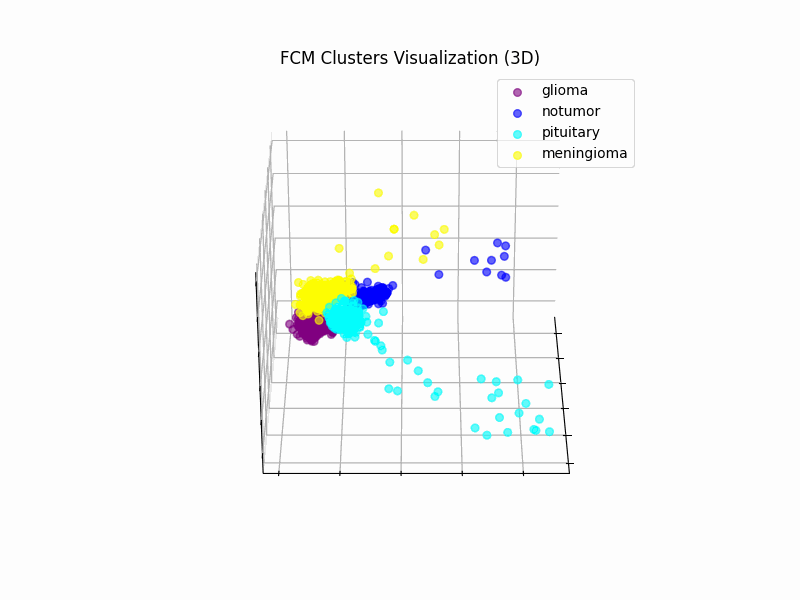

In [35]:
from IPython.display import Image
Image(filename='fcm_3d_clustering.gif')